# Import pacakages, data and functions

In [1]:
import itertools
import matlab.engine
import plotly.express as px
import plotly.graph_objs as go
import plotly

import drs
import numpy as np
import seaborn as sns

import pingouin

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import json
import time
import pandas as pd
import glob
from copy import deepcopy
import os
import sys
from joblib import Parallel, delayed, cpu_count, dump,load
import plotly.express as px

from zpyhelper.filesys import checkdir
from zpyhelper.MVPA.rdm import compute_rdm,lower_tri,upper_tri, compute_rdm_nomial, compute_rdm_identity
from zpyhelper.MVPA.preprocessors import scale_feature, average_odd_even_session,normalise_multivariate_noise, split_data, concat_data,extract_pc,average_flexi_session
from zpyhelper.MVPA.estimators import PatternCorrelation, MultipleRDMRegression, NeuralRDMStability

project_path = r'E:\pirate_fmri\Analysis'
sys.path.append(project_path)
from scripts.Exp1_fmri.multivariate.modelrdms import ModelRDM
from scripts.Exp1_fmri.multivariate.mvpa_runner import MVPARunner
from scripts.Exp1_fmri.multivariate.pirateOMutils import parallel_axes_cosine_sim, minmax_scale, generate_filters
from src.utils.composition_modelfit import multi_start_optimisation

import sklearn
from sklearn.manifold import MDS,TSNE 
import sklearn.manifold as manifold
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.multioutput import MultiOutputRegressor,MultiOutputClassifier
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import accuracy_score,r2_score

import scipy

import plotly.graph_objects as go
import warnings
warnings.simplefilter('ignore', category=FutureWarning)

In [2]:
from plotting_utils import plot_rdm_withlabel,gen_pval_annot,grouped_barscatter_withstats, plot_rdm_mds


## set path to data and load data from ROI

In [3]:
study_scripts   = os.path.join(project_path,'scripts','Exp1_fmri')
studydata_dir  = os.path.join(project_path,'data','Exp1_fmri')
with open(os.path.join(study_scripts,'pirate_defaults.json')) as f:
    pirate_defaults = json.load(f)
    subid_list = pirate_defaults['participants']['validids']
    cohort1ids = [x for x in pirate_defaults['participants']['cohort1ids'] if x in subid_list]
    cohort2ids = [x for x in pirate_defaults['participants']['cohort2ids'] if x in subid_list]
    fmribeh_dir = pirate_defaults['directory']['fmribehavior']
    fmridata_dir = pirate_defaults['directory']['fmri_data']
    nongeneralizers = pirate_defaults['participants']["nongeneralizerids"]
    generalizers    = pirate_defaults['participants']["generalizerids"]
print(len(subid_list))
print(len(cohort1ids))
print(len(cohort2ids))

fmridata_dir = os.path.join(project_path,'data','Exp1_fmri','fmri')
fmribeh_dir = os.path.join(fmridata_dir,'beh')

cohort_names_lists = dict(zip(["First Cohort","Second Cohort","Combined Cohort"],[cohort1ids,cohort2ids,subid_list]))
    

56
29
27


In [ ]:
ROIRSAdir = os.path.join(fmridata_dir,'ROIRSA','AALandHCPMMP1andFUNCsphere')
roi_data = load(os.path.join(ROIRSAdir,"roi_data_4r.pkl"))
rois = list(roi_data.keys())
print(rois)
rois = [f"{x}_bilateral" for x in ["testgtlocTPMid","testgtlocParietalSup"] + ["HPC","vmPFC","V1","V2"]]



In [126]:
print(rois)
roi_longnames = ["Hippocampus","ventral medial prefrontal cortex","Visual Area 1","Temporal Pole: Middle Temporal Gyrus","Superior Parietal Gyrus"]
roi_shortnames  = ["HPC","vmPFC","V1","TPOmid", "SPG"]

['HPC_bilateral', 'vmPFC_bilateral', 'V1_bilateral', 'testlocMidTP_L', 'testlocSupParietal_R']


In [5]:
anatroi_data1 = load(os.path.join(anatROIRSAdir,"roi_data_4r.pkl"))
anatroi_data2 = load(os.path.join(fmridata_dir,'ROIRSA','AALandHCPMMP1',"roi_data_4r.pkl"))


In [6]:
print(anatroi_data1["HPC_bilateral"][0]["preprocX"].shape)
print(anatroi_data2["HPC_bilateral"][0]["preprocX"].shape)

all([np.array_equal(anatroi_data1["HPC_bilateral"][j]["preprocX"],anatroi_data2["HPC_bilateral"][j]["preprocX"]) for j in range(len(subid_list))])

(109, 534)
(109, 1127)


False

In [7]:
studydata_dir

'E:\\pirate_fmri\\Analysis\\data\\Exp1_fmri'

<Axes: xlabel='subcohort', ylabel='count'>

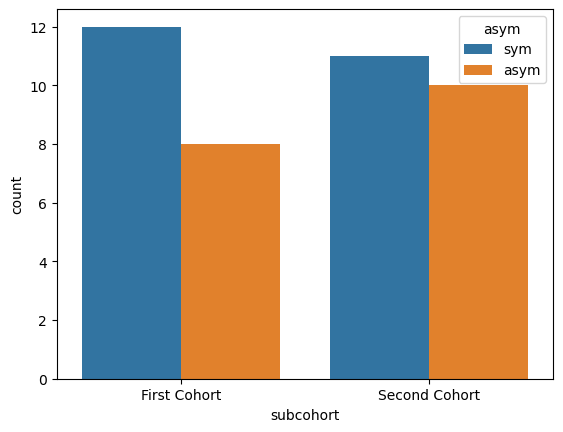

In [8]:
asymlearning_perf = pd.read_csv(os.path.join(studydata_dir,"Asymlearning.csv"))
asymlearning_perf["subid_cat"] = pd.Categorical(asymlearning_perf.subid, categories=subid_list,ordered=True)
asymlearning_perf = asymlearning_perf.sort_values("subid_cat").reset_index(drop=True)
asymlearning_perf.columns
sns.countplot(asymlearning_perf[asymlearning_perf.subgroup=="Generalizer"],x="subcohort",hue="asym")

In [7]:
scanner_ave_perf = pd.read_csv(os.path.join(studydata_dir,"scanner_average_LLR_wmapping.csv"))
scanner_ave_perf["subid_cat"] = pd.Categorical(scanner_ave_perf.subid, categories=subid_list,ordered=True)
scanner_ave_perf = scanner_ave_perf.sort_values("subid_cat").reset_index(drop=True)
scanner_ave_perf.columns
#sns.countplot(scanner_ave_perf[scanner_ave_perf.isgeneralizer=="generalizer"],x="tamapping_str",hue="cohort")

Index(['cohort', 'islearner', 'isgeneralizer', 'subid', 'tamapping',
       'tamapping_str', 'countx_coef', 'county_coef', 'ave_abs_count_coef',
       'countx_p', 'county_p', 'LLR_train', 'LLR_test', 'subid_cat'],
      dtype='object')

## get data ready

In [42]:
# get neural rdms for analysis

## initialize place holder for rdms and activity pattern matrix
stimsubgroups = ["training_nocenter","training_all","test","allstim_nocenter","allstim"]
sub_rdms, sub_patterns, sub_stimdfs = {}, {}, {}
for fname in stimsubgroups:
    sub_rdms[fname] = {}
    sub_patterns[fname] = {}
    sub_stimdfs[fname] = {}
    for roi in rois:
        sub_rdms[fname][roi] = []
        sub_patterns[fname][roi] = []
        sub_stimdfs[fname][roi] = []


## get neural rdms
for roi in rois:
    for subid,subdata in zip(subid_list,roi_data[roi]):
        
        preprocedX = deepcopy(subdata["preprocX"])
        stimdf = subdata["stimdf"].copy()
        
        navi_filter = stimdf.taskname.to_numpy() == "navigation"

        #average across sessions, so we get a 25*nvoxel matrix
        navi_X = np.mean(split_data(X      = preprocedX[navi_filter,:],
                                    groups = stimdf[navi_filter].copy().stim_session.to_numpy()),
                        axis=0)
        
        #filter out the df for just one session
        sub_dfall = stimdf[navi_filter&(stimdf.stim_session==0)].copy().reset_index(drop=True)
        sub_dfall['training_axsetstr'] = ["x" if axs==0 else "y" for axs in sub_dfall['training_axset']]
        # make loc into integer
        sub_dfall["stim_x"] = sub_dfall["stim_x"]*2
        sub_dfall["stim_y"] = sub_dfall["stim_y"]*2
        sub_dfall["stim_xdist"] = sub_dfall["stim_xdist"]*2
        sub_dfall["stim_ydist"] = sub_dfall["stim_ydist"]*2
        sub_dfall["training_axlocTL"] = sub_dfall["training_axlocTL"]*2
        sub_dfall["training_axlocTR"] = sub_dfall["training_axlocTR"]*2

        #generate filters for various stimuli type
        subfilters = generate_filters(sub_dfall)

        for fname, curr_filt in subfilters.items():
            curr_df, curr_X = sub_dfall[curr_filt].copy().reset_index(drop=True), navi_X[curr_filt,:]
            subrdm = compute_rdm(curr_X,metric="correlation")
            sub_rdms[fname][roi].append(subrdm)
            sub_patterns[fname][roi].append(curr_X)
            sub_stimdfs[fname][roi].append(curr_df)

## stimdf for navigation task stimuli
navi_stimdf = sub_dfall[['stim_id', 'stim_group', 'stim_session', 'stim_x', 'stim_y',
           'stim_xsign', 'stim_ysign', 'stim_xdist','stim_ydist',
           'training_axset','training_axsetstr','training_axlocTL','training_axlocTR',
           'stim_lrbux', 'stim_lrbuy', 'taskname']].copy()
stimsubgroup_filters = generate_filters(navi_stimdf)
navi_stimdf

,stim_id,stim_group,stim_session,stim_x,stim_y,stim_xsign,stim_ysign,stim_xdist,stim_ydist,training_axset,training_axsetstr,training_axlocTL,training_axlocTR,stim_lrbux,stim_lrbuy,taskname
0,0,0,0.0,-2.0,-2.0,-1.0,-1.0,2.0,2.0,NaN,y,NaN,NaN,2.0,2.0,navigation
1,1,0,0.0,-2.0,-1.0,-1.0,-1.0,2.0,1.0,NaN,y,NaN,NaN,2.0,3.0,navigation
2,2,1,0.0,-2.0,0.0,-1.0,0.0,2.0,0.0,0.0,x,-2.0,-2.0,2.0,0.0,navigation
3,3,0,0.0,-2.0,1.0,-1.0,1.0,2.0,1.0,NaN,y,NaN,NaN,2.0,1.0,navigation
4,4,0,0.0,-2.0,2.0,-1.0,1.0,2.0,2.0,NaN,y,NaN,NaN,2.0,2.0,navigation
5,5,0,0.0,-1.0,-2.0,-1.0,-1.0,1.0,2.0,NaN,y,NaN,NaN,3.0,2.0,navigation
6,6,0,0.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,NaN,y,NaN,NaN,3.0,3.0,navigation
7,7,1,0.0,-1.0,0.0,-1.0,0.0,1.0,0.0,0.0,x,-1.0,-1.0,3.0,0.0,navigation
8,8,0,0.0,-1.0,1.0,-1.0,1.0,1.0,1.0,NaN,y,NaN,NaN,3.0,1.0,navigation
9,9,0,0.0,-1.0,2.0,-1.0,1.0,1.0,2.0,NaN,y,NaN,NaN,3.0,2.0,navigation


# Train-Test comparison

In [108]:
meanactivation_level = []
for roi in rois:
    for subdata,subid in zip(roi_data[roi],subid_list):
        print(f"{roi} - {subid}",end="\r",flush=True)

        navi_filter = subdata["stimdf"].taskname.to_numpy() == "navigation"
        mean_activation_stimdf = subdata["stimdf"][navi_filter].copy().assign(subid=subid,roi=roi)

        mean_activation_stimdf["mean_activation"] = subdata["rawX"][navi_filter].mean(axis=1)
        meanactivation_level.append(mean_activation_stimdf)

<Axes: >

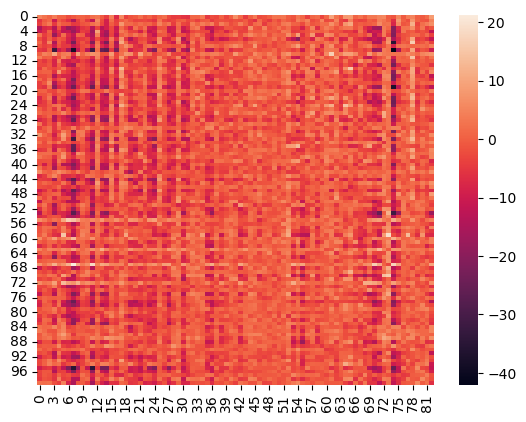

In [109]:
sns.heatmap(subdata["rawX"][navi_filter])

In [110]:
mean_activation_stimdf

,stim_id,stim_group,stim_session,stim_x,stim_y,stim_color,stim_shape,stim_xsign,stim_ysign,stim_xdist,...,resp_ysign,resp_xdist,resp_ydist,training_axset,training_axlocTL,training_axlocTR,taskname,subid,roi,mean_activation
0,0,0,0.0,-1.0,-1.0,1,1,-1.0,-1.0,1.0,...,-1.0,0.901159,1.020304,NaN,NaN,NaN,navigation,sub130,testlocSupParietal_R,0.695439
1,1,0,0.0,-1.0,-0.5,1,2,-1.0,-1.0,1.0,...,-1.0,0.942923,0.330264,NaN,NaN,NaN,navigation,sub130,testlocSupParietal_R,-1.617761
2,2,1,0.0,-1.0,0.0,1,4,-1.0,0.0,1.0,...,1.0,1.213041,0.054684,0.0,-1.0,-1.0,navigation,sub130,testlocSupParietal_R,0.713162
3,3,0,0.0,-1.0,0.5,1,0,-1.0,1.0,1.0,...,1.0,0.898408,0.404088,NaN,NaN,NaN,navigation,sub130,testlocSupParietal_R,-4.003128
4,4,0,0.0,-1.0,1.0,1,3,-1.0,1.0,1.0,...,1.0,0.750922,0.855581,NaN,NaN,NaN,navigation,sub130,testlocSupParietal_R,-4.490194
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,20,0,3.0,1.0,-1.0,2,1,1.0,-1.0,1.0,...,-1.0,0.566840,1.082847,NaN,NaN,NaN,navigation,sub130,testlocSupParietal_R,-6.503944
96,21,0,3.0,1.0,-0.5,2,2,1.0,-1.0,1.0,...,-1.0,1.079109,0.229261,NaN,NaN,NaN,navigation,sub130,testlocSupParietal_R,-4.070229
97,22,1,3.0,1.0,0.0,2,4,1.0,0.0,1.0,...,1.0,1.103879,0.192565,0.0,1.0,1.0,navigation,sub130,testlocSupParietal_R,-1.469102
98,23,0,3.0,1.0,0.5,2,0,1.0,1.0,1.0,...,1.0,0.788859,0.558848,NaN,NaN,NaN,navigation,sub130,testlocSupParietal_R,-1.670540


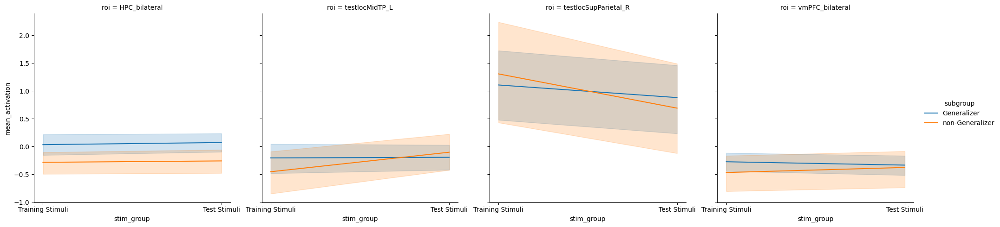

In [111]:
meanactivation_leveldf = pd.concat(meanactivation_level,axis=0).reset_index(drop=True)
meanactivation_leveldfsum = meanactivation_leveldf.groupby(["subid","roi","stim_group"]).mean_activation.mean().reset_index()
meanactivation_leveldfsum["subgroup"] = ["Generalizer" if x in generalizers else "non-Generalizer" for x in meanactivation_leveldfsum.subid]
meanactivation_leveldfsum["stim_group"] = pd.Categorical(meanactivation_leveldfsum.stim_group.map({1:"Training Stimuli",0:"Test Stimuli"}),
                                                      categories=["Training Stimuli","Test Stimuli"],ordered=True)
sns.relplot(meanactivation_leveldfsum,
            x="stim_group",y="mean_activation",hue="subgroup",
            #units="subid",estimator=None,
            col="roi",
            kind="line")


# Training Stimuli (non-center ones) Representation

## Models

In [ ]:
fname = "training_nocenter"
curr_filt = stimsubgroup_filters[fname]
plt_df = navi_stimdf[curr_filt].copy().reset_index(drop=True).sort_values(["training_axset","training_axloc"])

plt_df["stim_name"] = ['%s%d' % (x,y) for x,y in zip(np.array(plt_df["training_axsetstr"]),np.array(plt_df["training_axloc"]))]
#plt_df["stim_name"] = ['x%dy%d' % (x,y) for x,y in zip(np.array(plt_df["stim_x"]),np.array(plt_df["stim_y"]))]

tetrahedron = np.array([
    [0,            0,            0],
    [np.sqrt(2),   0,            0],
    [np.sqrt(2)/2, np.sqrt(6)/2, 0],
    [np.sqrt(2)/2, np.sqrt(6)/6, 2*np.sqrt(3)/3]]
)*2    

plt_df[["dim1","dim2","dim3"]] = np.vstack([tetrahedron,tetrahedron+2])

# join the dots of the same axis location on different axis

cpal = dict(zip(np.unique(plt_df["training_axsetstr"]), 
                sns.color_palette(None, np.unique(plt_df["training_axsetstr"]).size).as_hex()))
sdict = dict(zip(np.unique(plt_df["stim_x"]), 
                ['circle', 'diamond','circle-open','square', 'x']))
['circle', 'circle-open', 'square', 'square-open',
'diamond', 'diamond-open', 'cross', 'x']

pxfig = px.line_3d(plt_df,x="dim1",y="dim2",z="dim3",
                    text="stim_name",
                    line_group="training_axsetstr",
                    color_discrete_sequence=["black"],
                    line_dash_sequence=["dash"],
                    range_x=[-0.5,5.5],
                    range_y=[-0.5,5.5],
                    range_z=[-0.5,5.5]
                     )
pxfig.update_traces(
    line=dict(
        width=3
    )
)
for k,(ta,tadf) in enumerate(plt_df.groupby("training_axsetstr")):#["stim_x","stim_y"]
    print(k)
    trace_arr = tadf[["dim1","dim2","dim3"]].to_numpy()
    pxfig.add_trace(
        go.Scatter3d(
            x=trace_arr[:,0], y=trace_arr[:,1],z=trace_arr[:,2], 
            mode='markers',
            marker=dict(
                color=[cpal[ta]] * trace_arr.shape[0],
                #symbol=sdict[ta[0]],
                #color=cpal[ta[1]],
                #line=dict(width=10,
                #          color=cpal[ta[1]])
            ),
            name=f"training stimuli on {tadf['training_axset'].to_numpy()[0]} axis",

        )
    )

pxfig.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False),
        yaxis=dict(showticklabels=False),
        zaxis=dict(showticklabels=False),
    ),
    title_text = "Parallel Training Axis, High Dimensional (PTA-High)",
    title_subtitle_text='Parallelism Score = 1',
    title_x=0.3,title_y=0.9,
    title_font_weight="bold",title_font_size=20,
    title_subtitle_font_size=20
)
checkdir(os.path.join(ROIRSAdir,"MDS","training_nocenter"))
pxfig.write_html(os.path.join(ROIRSAdir,"MDS","training_nocenter","parallel_tetrahedron.html"))
pxfig

In [ ]:
tetrahedron = np.array([
    [0,            0,            0],
    [np.sqrt(2),   0,            0],
    [np.sqrt(2)/2, np.sqrt(6)/2, 0],
    [np.sqrt(2)/2, np.sqrt(6)/6, 2*np.sqrt(3)/3]]
)*2    

plt_df[["dim1","dim2","dim3"]] = np.vstack([tetrahedron,tetrahedron+2])

# join the dots of the same axis location on different axis

pxfig = px.line_3d(plt_df,x="training_axsetstr",y="training_axloc",z=np.zeros((plt_df.shape[0],)),
                    text="stim_name",
                    line_group="training_axsetstr",
                    color_discrete_sequence=["black"],
                    line_dash_sequence=["dash"],
                    #range_x=[-0.5,5.5],
                    #range_y=[-0.5,5.5],
                    #range_z=[-0.5,5.5]
                     )
pxfig.update_traces(
    line=dict(
        width=3
    )
)
for k,(ta,tadf) in enumerate(plt_df.groupby("training_axsetstr")):#["stim_x","stim_y"]
    print(k)
    trace_arr = tadf[["training_axset","training_axloc"]].to_numpy()
    pxfig.add_trace(
        go.Scatter3d(
            x=trace_arr[:,0], y=trace_arr[:,1],z=np.zeros((trace_arr.shape[0],)), 
            mode='markers',
            marker=dict(
                color=[cpal[ta]] * trace_arr.shape[0],
                #symbol=sdict[ta[0]],
                #color=cpal[ta[1]],
                #line=dict(width=10,
                #          color=cpal[ta[1]])
            ),
            name=f"training stimuli on {tadf['training_axsetstr'].to_numpy()[0]} axis",

        )
    )

pxfig.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False),
        yaxis=dict(showticklabels=False),
        zaxis=dict(showticklabels=False),
        aspectmode="cube"
    ),
    title_text = "Parallel Training Axis, Low Dimensional (PTA-Low)",
    title_subtitle_text='Parallelism Score = 1',
    title_x=0.3,title_y=0.9,
    title_font_weight="bold",title_font_size=20,
    title_subtitle_font_size=20,
    
)
checkdir(os.path.join(ROIRSAdir,"MDS","training_nocenter"))
pxfig.write_html(os.path.join(ROIRSAdir,"MDS","training_nocenter","parallel_lines.html"))
pxfig

In [ ]:

eng = matlab.engine.start_matlab()
featurerdm = compute_rdm_nomial(plt_df[["stim_x","stim_y"]].to_numpy())


plt_df[["dim1","dim2","dim3"]] = np.array(eng.cmdscale(featurerdm,3))  
eng.quit()

# join the dots of the same axis location on different axis
pxfig = px.line_3d(plt_df,x="dim1",y="dim2",z="dim3",
                    text="stim_name",
                    line_group="training_axsetstr",
                    color_discrete_sequence=["black"],
                    line_dash_sequence=["dash"],
                    range_x=[-0.5,0.5],
                    range_y=[-0.5,0.5],
                    range_z=[-0.5,0.5]
                     )
pxfig.update_traces(
    line=dict(
        width=3
    )
)
for k,(ta,tadf) in enumerate(plt_df.groupby("training_axset")):#["stim_x","stim_y"]
    print(k)
    trace_arr = tadf[["dim1","dim2","dim3"]].to_numpy()
    pxfig.add_trace(
        go.Scatter3d(
            x=trace_arr[:,0], y=trace_arr[:,1],z=trace_arr[:,2], 
            mode='markers',
            marker=dict(
                color=[cpal[ta]] * trace_arr.shape[0],
                #symbol=sdict[ta[0]],
                #color=cpal[ta[1]],
                #line=dict(width=10,
                #          color=cpal[ta[1]])
            ),
            name=f"training stimuli on {tadf['training_axsetstr'].to_numpy()[0]} axis",

        )
    )

from sklearn.preprocessing import OneHotEncoder
axlocs = np.unique(plt_df.training_axloc)
MDSX = OneHotEncoder(sparse_output=False).fit_transform(plt_df[["stim_x","stim_y"]].to_numpy())#X_df[["MDS ax1","MDS ax2","MDS ax3"]].to_numpy()
assert all([np.sum(plt_df.stim_x == j)==1 for j in axlocs])
assert all([np.sum(plt_df.stim_y == j)==1 for j in axlocs])
xstims = np.array([MDSX[plt_df.stim_x == j,:][0] for j in axlocs])
ystims = np.array([MDSX[plt_df.stim_y == j,:][0] for j in axlocs])
        

pxfig.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False),
        yaxis=dict(showticklabels=False),
        zaxis=dict(showticklabels=False),
        aspectmode="cube"
    ),
    title_text = "Orthogonal Training Axis, High Dimensional (OTA-High)",
    title_subtitle_text='Parallelism Score = %.3f' % (np.nanmean(parallel_axes_cosine_sim(xstims,ystims))),
    title_x=0.3,title_y=0.9,
    title_font_weight="bold",title_font_size=20,
    title_subtitle_font_size=20
)
pxfig.write_html(os.path.join(ROIRSAdir,"MDS","training_nocenter","feature_based.html"))
pxfig

In [ ]:
pxfig = px.line_3d(plt_df,x="stim_x",y="stim_y",z=np.zeros((plt_df.shape[0],)),
                    text="stim_name",
                    line_group="training_axsetstr",
                    color_discrete_sequence=["black"],
                    line_dash_sequence=["dash"],
                    #range_x=[-0.5,5.5],
                    #range_y=[-0.5,5.5],
                    #range_z=[-0.5,5.5]
                     )
pxfig.update_traces(
    line=dict(
        width=3
    )
)
for k,(ta,tadf) in enumerate(plt_df.groupby("training_axsetstr")):#["stim_x","stim_y"]
    print(k)
    trace_arr = tadf[["stim_x","stim_y"]].to_numpy()
    pxfig.add_trace(
        go.Scatter3d(
            x=trace_arr[:,0], y=trace_arr[:,1],z=np.zeros((trace_arr.shape[0],)), 
            mode='markers',
            marker=dict(
                color=[cpal[ta]] * trace_arr.shape[0],
                #symbol=sdict[ta[0]],
                #color=cpal[ta[1]],
                #line=dict(width=10,
                #          color=cpal[ta[1]])
            ),
            name=f"training stimuli on {tadf['training_axsetstr'].to_numpy()[0]} axis",

        )
    )

pxfig.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False),
        yaxis=dict(showticklabels=False),
        zaxis=dict(showticklabels=False),
        aspectmode="cube"
    ),
    title_text = "Orthogonal Training Axis, Low Dimensional (OTA-Low)",
    title_subtitle_text='Parallelism Score = 0.000',
    title_x=0.3,title_y=0.9,
    title_font_weight="bold",title_font_size=20,
    title_subtitle_font_size=20,
    
)
checkdir(os.path.join(ROIRSAdir,"MDS","training_nocenter"))
pxfig.write_html(os.path.join(ROIRSAdir,"MDS","training_nocenter","orthogonal_lines.html"))
pxfig

In [ ]:
tadfs = [tadf for ta,tadf in plt_df.groupby("training_axset")]
ts_x = np.array([[0,0,0,0],[-2,-1,1,2]]).T
ts_y = np.array([[1,1,1,1],[-2,-1,1,2]]).T
#ts_x = np.random.random((4,100))
#ts_y = np.random.random((4,100))
composed_test = np.array([np.concatenate([v1,v2]) for v1,v2 in itertools.product(ts_x,ts_y)])
#composed_test = np.array([v1+v2 for v1,v2 in itertools.product(ts_x,ts_y)])
ts_x = np.array([[0,0,0,0],[-2,-1,1,2]]).T
ts_y = np.array([[1,1,1,1],[-2,-1,1,2]]).T
test_locs = np.array([np.concatenate([v1,v2]) for v1,v2 in itertools.product(ts_x[:,[1]],ts_y[:,[1]])])
test_locs
fig,axes = plt.subplots(2,2)
sns.heatmap(test_locs,ax = axes[0,0],square=True)
sns.heatmap(compute_rdm(test_locs,"euclidean"),ax = axes[0,1],square=True)
sns.heatmap(composed_test,ax = axes[1,0],square=True)
sns.heatmap(compute_rdm(composed_test,"euclidean"),ax = axes[1,1],square=True)

In [ ]:
len(generalizers)

In [ ]:
def offdiagonalmat(squaremat):
    offdiagmat = np.full_like(squaremat,fill_value=np.nan)
    offdiagmat[lower_tri(offdiagmat)[1]] = lower_tri(squaremat)[0]
    return offdiagmat

def nandiagonalmat(squaremat):
    nandiagmat = deepcopy(squaremat)
    np.fill_diagonal(nandiagmat,np.nan)
    return nandiagmat
fname = "training_nocenter"
curr_filt = stimsubgroup_filters[fname]
new_order_df = navi_stimdf[curr_filt].copy().reset_index(drop=True).sort_values(["training_axset","training_axloc"])
new_order = new_order_df.index
pltmnames = ["PTA_ax","PTA_locEuc","PTA_locNomial","euclidean"]
cols      = ["training_axset",["training_axloc"],"training_axloc",["stim_x","stim_y"]]
funcs     = [compute_rdm_identity,lambda x: compute_rdm(x,"euclidean"),compute_rdm_identity,lambda x: compute_rdm(x,"euclidean")]
ticklabels = ["%s%d" % ("x" if ax==0 else "y", axloc) for ax, axloc in new_order_df[["training_axset","training_axloc"]].to_numpy()]

fig,axes = plt.subplots(3,len(pltmnames),figsize=(4*(len(pltmnames)),3.5*3))
for k, (mn,col,f) in enumerate(zip(pltmnames,cols,funcs)):
    sns.heatmap(nandiagonalmat(f(new_order_df[col].to_numpy())),square=True,ax=axes[0,k])
    axes[0,k].set_title(mn)

# PTA_high = funcs[0](new_order_df[cols[0]].to_numpy()) + funcs[2](new_order_df[cols[2]].to_numpy())
# sns.heatmap(nandiagonalmat(PTA_high),square=True,ax=axes[0,2])
# axes[0,2].set_title("PTA-high") 
# PTA_high = funcs[0](new_order_df[cols[0]].to_numpy()) + funcs[1](new_order_df[cols[1]].to_numpy())
# sns.heatmap(nandiagonalmat(PTA_high),square=True,ax=axes[0,1])
# axes[0,1].set_title("PTA-low") 

for k,roi in enumerate(rois):
    broi = base_rois[k]
    Grdm_scaled_mean = np.mean([minmax_scale(compute_rdm(X[new_order,:],"correlation"),0,1) for X,subid in zip(sub_patterns[fname][roi],subid_list) if subid in generalizers],axis=0)
    NGrdm_scaled_mean = np.mean([minmax_scale(compute_rdm(X[new_order,:],"correlation"),0,1) for X,subid in zip(sub_patterns[fname][roi],subid_list) if subid not in generalizers],axis=0)

    sns.heatmap(nandiagonalmat(Grdm_scaled_mean),square=True,ax=axes[1,k])
    axes[1,k].set_title(f"Generalizer\n{broi}")
    sns.heatmap(nandiagonalmat(NGrdm_scaled_mean),square=True,ax=axes[2,k])
    axes[2,k].set_title(f"nonGeneralizer\n{broi}")

for ax in axes.flatten():
    ax.set_xticks(np.arange(len(ticklabels))+0.5,labels=ticklabels,rotation=90)
    ax.set_yticks(np.arange(len(ticklabels))+0.5,labels=ticklabels,rotation=0)

fig.tight_layout()



In [ ]:
fname = "test"
curr_filt = stimsubgroup_filters[fname]
new_order_df = navi_stimdf[curr_filt].copy().reset_index(drop=True).sort_values(["stim_x","stim_y"])
new_order = new_order_df.index
pltmnames = ["feature","euclidean"]
cols      = [["stim_x","stim_y"],["stim_x","stim_y"]]
funcs     = [compute_rdm_nomial,lambda x: compute_rdm(x,"euclidean")]
ticklabels = ["(%d,%d)" % (x,y) for x,y in new_order_df[["stim_x","stim_y"]].to_numpy()]

fig,axes = plt.subplots(3,4,figsize=(4*4,3.5*3))
for k, (mn,col,f) in enumerate(zip(pltmnames,cols,funcs)):
    sns.heatmap(nandiagonalmat(f(new_order_df[col].to_numpy())),square=True,ax=axes[0,k])
    axes[0,k].set_title(mn)

for k,roi in enumerate(rois):
    broi = base_rois[k]
    Grdm_scaled_mean = np.mean([minmax_scale(compute_rdm(X[new_order,:],"correlation"),0,1) for X,subid in zip(sub_patterns[fname][roi],subid_list) if subid in generalizers],axis=0)
    NGrdm_scaled_mean = np.mean([minmax_scale(compute_rdm(X[new_order,:],"correlation"),0,1) for X,subid in zip(sub_patterns[fname][roi],subid_list) if subid not in generalizers],axis=0)

    sns.heatmap(nandiagonalmat(Grdm_scaled_mean),square=True,ax=axes[1,k])
    axes[1,k].set_title(f"Generalizer\n{broi}")
    sns.heatmap(nandiagonalmat(NGrdm_scaled_mean),square=True,ax=axes[2,k])
    axes[2,k].set_title(f"nonGeneralizer\n{broi}")

for ax in axes.flatten():
    ax.set_xticks(np.arange(len(ticklabels))+0.5,labels=ticklabels,rotation=90)
    ax.set_yticks(np.arange(len(ticklabels))+0.5,labels=ticklabels,rotation=0)

fig.tight_layout()


## MDS plots

In [ ]:
## plotly interactive 3D plots
fname = 'training_nocenter'
curr_filt = stimsubgroup_filters[fname]
for cohortstr,cohortname in zip(["sub0","sub1"],["firstcohort","secondcohort"]):
    for roi in rois:

        Grdm_scaled_mean = np.mean([minmax_scale(m,newmax=1,newmin=0) for m,subid in zip(sub_rdms[fname][roi],subid_list) if subid in generalizers and cohortstr in subid],axis=0)
        NGrdm_scaled_mean = np.mean([minmax_scale(m,newmax=1,newmin=0) for m,subid in zip(sub_rdms[fname][roi],subid_list) if subid not in generalizers and cohortstr in subid],axis=0)
        
        # Grdm_scaled_mean = np.mean([m for m,subid in zip(sub_rdms[fname][roi],subid_list) if subid in generalizers],axis=0)
        # NGrdm_scaled_mean = np.mean([m for m,subid in zip(sub_rdms[fname][roi],subid_list) if subid not in generalizers],axis=0)

        for subgroup, sgrdm in zip(["Generalizers","nonGeneralizers"],[Grdm_scaled_mean,NGrdm_scaled_mean]):
            outputdir = os.path.join(ROIRSAdir,"MDS",f"{fname}_TLmapping")
            checkdir(outputdir)
            fig, axes, X_df = plot_rdm_mds(sgrdm,ncompo=3,stimdf=navi_stimdf[curr_filt].copy().reset_index(drop=True),
                                        gcol="training_axsetstr",
                                        huecol="training_axsetstr",stylecol="training_axlocTL",stim_namer=lambda h,s: '%s%d' % (h,s),
                                        plot_3d=True)
            fig.suptitle(f"{roi} - {subgroup}")
            fig.savefig(os.path.join(outputdir,f"{roi}_{subgroup}_{cohortname}.jpg"))
            #for loc1,loc2,tl in X_df[['MDS ax1', 'MDS ax2', "stim_name"]].to_numpy():
            #    axes[1].text(loc1,loc2, tl,size='small')
            plt.close()
            cpal = dict(zip(np.unique(X_df["training_axsetstr"]), 
                            sns.color_palette(None, np.unique(X_df["training_axsetstr"]).size).as_hex()))
            pxfig = px.line_3d(X_df,x="MDS ax1",y="MDS ax2",z="MDS ax3",
                            text="stim_name",
                            #symbol= "training_axloc",
                            line_group="training_axsetstr",
                            color_discrete_sequence=["black"],
                            line_dash_sequence=["dash"],
                            )
            pxfig.update_traces(
                line=dict(
                    width=3
                )
            )
            for k,(ta,tadf) in enumerate(X_df.groupby("training_axsetstr")):
                trace_arr = tadf[["MDS ax1","MDS ax2","MDS ax3"]].to_numpy()
                pxfig.add_trace(
                    go.Scatter3d(
                        x=trace_arr[:,0], y=trace_arr[:,1],z=trace_arr[:,2], 
                        mode='markers',
                        marker=dict(
                            color=cpal[ta]#[cpal[ta]] * trace_arr.shape[0]
                        ),
                        name=f"Training stimuli on {ta} axis",

                    )
                )

            axlocs = np.unique(X_df.training_axlocTL)
            MDSX = X_df[["MDS ax1","MDS ax2","MDS ax3"]].to_numpy()
            assert all([np.sum(X_df.stim_x == j)==1 for j in axlocs])
            assert all([np.sum(X_df.stim_y == j)==1 for j in axlocs])
            xstims = np.array([MDSX[X_df.stim_x == j,:][0] for j in axlocs])
            ystims = np.array([MDSX[X_df.stim_y == j,:][0] for j in axlocs])
            
            pxfig.update_layout(#
                title_text=f"{roi.replace('_bilateral','')} {subgroup}",
                title_subtitle_text='Parallelism Score = %.3f' % (np.nanmean(parallel_axes_cosine_sim(xstims,ystims))),
                title_x=0.3,title_y=0.9,
                title_font_weight="bold",title_font_size=20,
                title_subtitle_font_size=20)
            outputdir = os.path.join(ROIRSAdir,"MDS",f"{fname}_TLmapping")
            checkdir(outputdir)
            pxfig.write_html(os.path.join(outputdir,f"{roi}_{subgroup}_{cohortname}.html"))
                

## Cross-validated SVD    

In [ ]:
from multivariate.pirateOMutils import cross_val_SVD

###### for training stimuli

In [92]:
svdestdim_df = pd.read_csv(os.path.join(ROIRSAdir,"trainingstim_withinax_svdestdim_df.csv"))
svdestdim_df = svdestdim_df[svdestdim_df.roi.isin(rois)]    
svdestdim_df["roi"] = pd.Categorical(svdestdim_df.roi, categories=rois,ordered=True)
svdestdim_df_sum = svdestdim_df.groupby(["roi","subid","dimonaxis"]).mean().reset_index()
svdestdim_df_sum["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in svdestdim_df_sum["subid"]]    
svdestdim_df_sum["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in svdestdim_df_sum["subid"]] 

print(svdestdim_df_sum.shape)
svdestdim_df_sum



(560, 8)


,roi,subid,dimonaxis,est_dim,reconstruction_corr,run,subgroup,subcohort
0,HPC_bilateral,sub001,x axis,2.25,-0.005330,1.5,Generalizer,first cohort
1,HPC_bilateral,sub001,y axis,1.50,0.001228,1.5,Generalizer,first cohort
2,HPC_bilateral,sub002,x axis,1.00,0.053853,1.5,nonGeneralizer,first cohort
3,HPC_bilateral,sub002,y axis,1.50,0.060774,1.5,nonGeneralizer,first cohort
4,HPC_bilateral,sub003,x axis,1.75,0.043268,1.5,Generalizer,first cohort
...,...,...,...,...,...,...,...,...
555,testlocSupParietal_R,sub128,y axis,1.00,0.382084,1.5,Generalizer,second cohort
556,testlocSupParietal_R,sub129,x axis,1.00,0.276024,1.5,Generalizer,second cohort
557,testlocSupParietal_R,sub129,y axis,1.00,0.237652,1.5,Generalizer,second cohort
558,testlocSupParietal_R,sub130,x axis,1.00,0.239477,1.5,Generalizer,second cohort


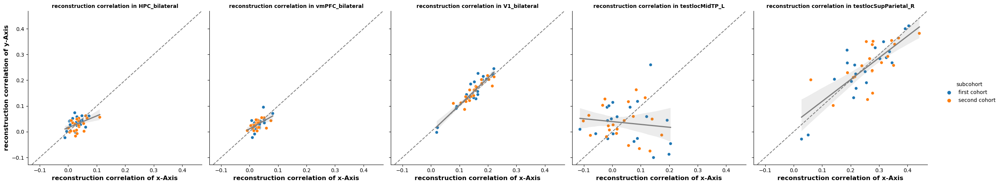

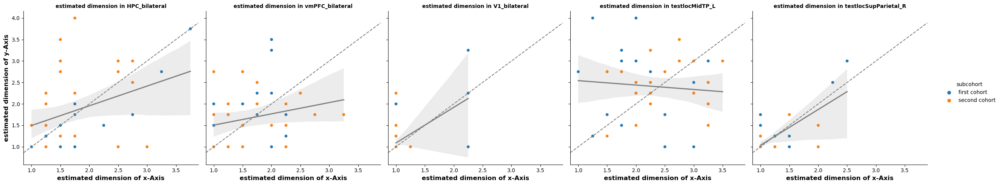

In [130]:
# see if the estimation for x axis and y axis are consistent
plot_yvars = {"reconstruction correlation":"reconstruction_corr","estimated dimension":"est_dim"}
for yname, ycol in plot_yvars.items():
    plotdf = svdestdim_df_sum[svdestdim_df_sum.subgroup=="Generalizer"].copy().pivot(index=["roi","subgroup","subcohort","subid"], columns="dimonaxis", values=ycol).reset_index()
    gs = sns.relplot(data=plotdf,
                     x="x axis",
                     y= "y axis",
                     hue="subcohort",palette="tab10",
                     col="roi",
                     kind="scatter")
    gs.map_dataframe(sns.regplot,
                     x="x axis",
                     y= "y axis",
                     color="grey",scatter=False)
    for ax in gs.axes.flatten():
        if "dim" in yname:
            ax.axline((1,1),slope=1,color="grey",linestyle="--")
        else:
            ax.axline((0,0),slope=1,color="grey",linestyle="--")
    gs.set_titles("%s in {col_name}"%(yname),fontdict={"fontsize":15,"fontweight":"bold"})
    gs.set_axis_labels(x_var=f"{yname} of x-Axis", y_var=f"{yname} of y-Axis", clear_inner=False, fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    gs.tight_layout()


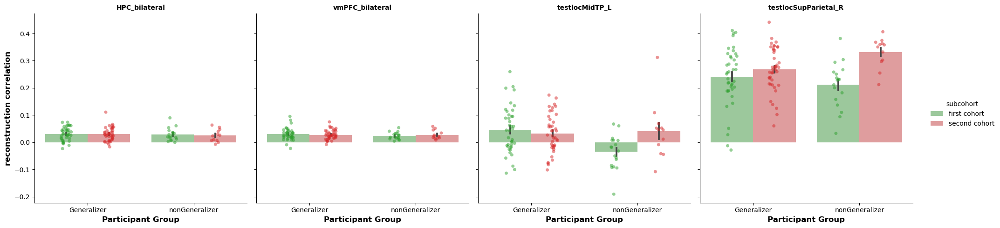

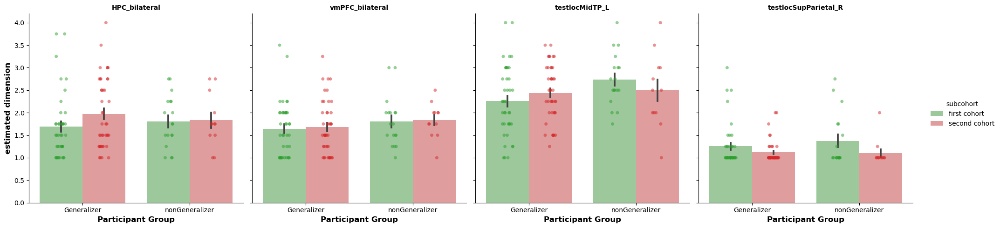

In [124]:
# check if cohort average and distribution is similar
svdestdim_df_sum_overaxis = svdestdim_df_sum.groupby(["roi","subid"])[["est_dim","reconstruction_corr"]].mean().reset_index()
svdestdim_df_sum_overaxis["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in svdestdim_df_sum_overaxis["subid"]]    
svdestdim_df_sum_overaxis["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in svdestdim_df_sum_overaxis["subid"]] 

plot_yvars = {"reconstruction correlation":"reconstruction_corr","estimated dimension":"est_dim"}
for yname, ycol in plot_yvars.items():
    xcol,huecol = "subgroup","subcohort"
    col_col = "roi"
    gs = sns.catplot(data=svdestdim_df_sum,
                     y=ycol,
                     x=xcol,hue=huecol,palette=sns.color_palette("tab10",4)[2:],
                     col=col_col,
                     kind="bar",errorbar="se",
                     dodge=True,                     
                     alpha=0.5,
                     sharex=False)
    gs.map_dataframe(sns.stripplot,
                     y=ycol,
                     x=xcol,hue=huecol,palette=sns.color_palette("tab10",4)[2:],
                     dodge=True, 
                     alpha=0.5)
    gs.set_titles("{col_name}",fontdict={"fontsize":15,"fontweight":"bold"})
    for ax in gs.axes.flatten():
        ax.set_xlabel("Participant Group",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
        ax.set_ylabel(yname,fontdict={"fontsize":12,"fontweight":"bold"})
        
    gs.tight_layout()

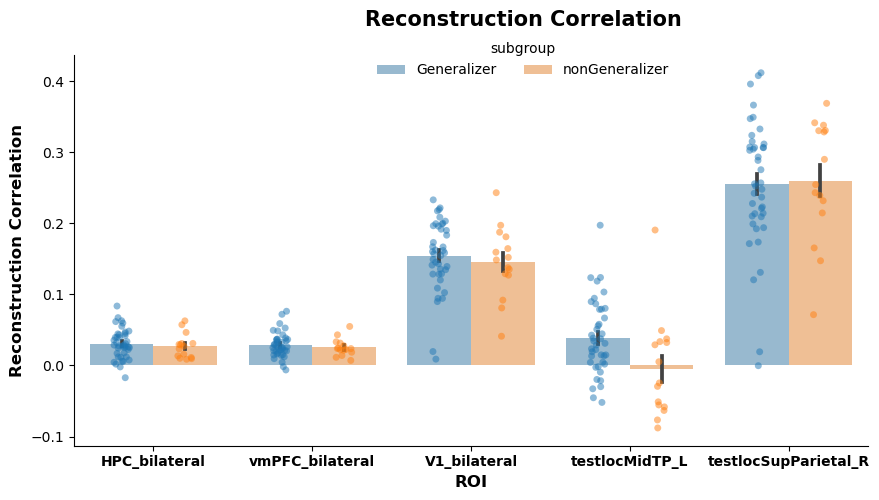

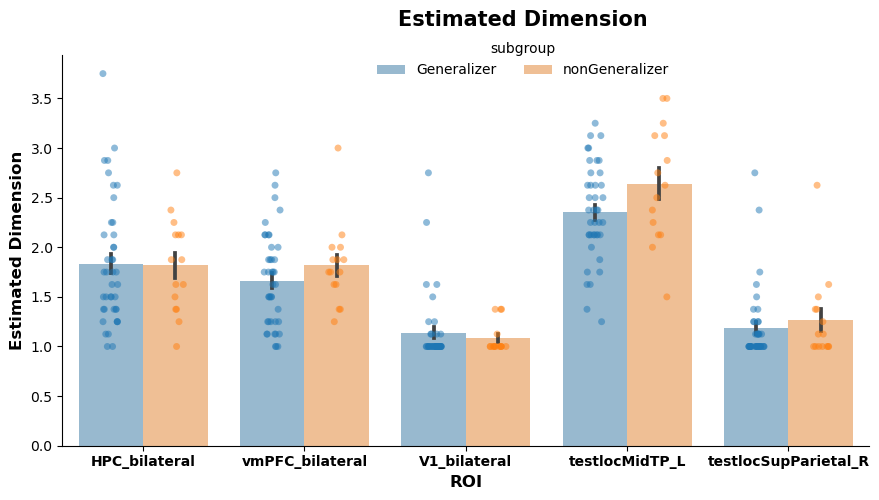

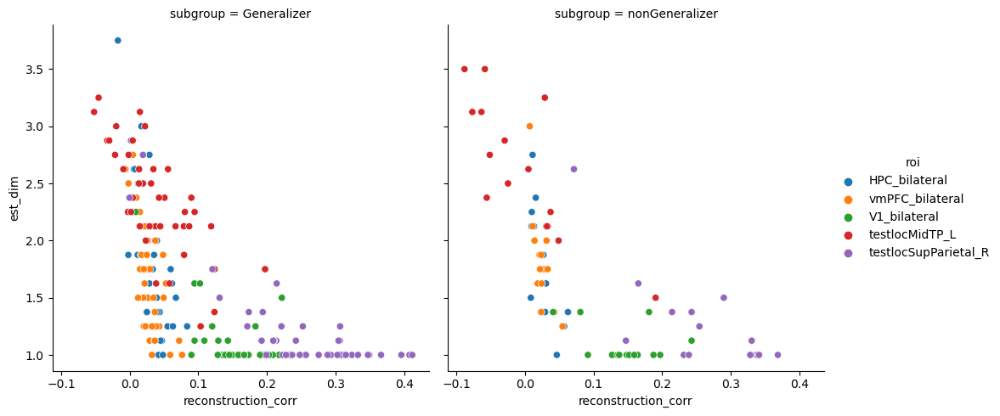

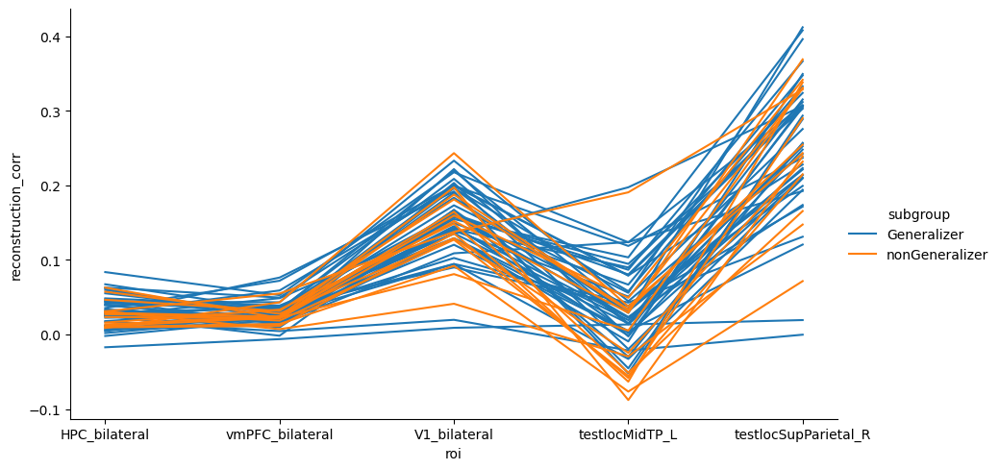

In [131]:
svdestdim_df_sum_overaxis = svdestdim_df_sum.groupby(["roi","subid"])[["est_dim","reconstruction_corr"]].mean().reset_index()
svdestdim_df_sum_overaxis["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in svdestdim_df_sum_overaxis["subid"]]    
svdestdim_df_sum_overaxis["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in svdestdim_df_sum_overaxis["subid"]] 

plot_yvars = {"Reconstruction Correlation":"reconstruction_corr","Estimated Dimension":"est_dim"}
for yname, ycol in plot_yvars.items():
    xcol,huecol = "roi","subgroup"
    #col_col = "roi"
    gs = sns.catplot(data=svdestdim_df_sum_overaxis,
                     y=ycol,
                     x=xcol,hue=huecol,palette="tab10",
                     #col=col_col,
                     kind="bar",errorbar="se",
                     dodge=True,                     
                     alpha=0.5,
                     sharex=False,
                     aspect=1.8)
    gs.map_dataframe(sns.stripplot,
                     y=ycol,
                     x=xcol,hue=huecol,palette="tab10",
                     dodge=True, 
                     alpha=0.5)
    for ax in gs.axes.flatten():
        ax.set_xlabel("ROI",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
        ax.set_ylabel(yname,fontdict={"fontsize":12,"fontweight":"bold"})
        plt.setp(ax.get_xticklabels(), fontsize=10, fontweight="bold")
    
    gs.figure.suptitle(yname,fontsize=15, fontweight="bold",y=0.99)
    sns.move_legend(gs,loc="upper center", bbox_to_anchor = (0.5,0.95),ncols=2)
    gs.tight_layout()

sns.relplot(data=svdestdim_df_sum_overaxis,
            x="reconstruction_corr",
            y="est_dim",
            col="subgroup", hue="roi")

sns.relplot(data=svdestdim_df_sum_overaxis,
            y="reconstruction_corr",
            x="roi", 
            hue="subgroup",
            units="subid", estimator=None,
            kind="line",aspect=1.8)

['HPC_bilateral',
 'vmPFC_bilateral',
 'V1_bilateral',
 'testlocMidTP_L',
 'testlocSupParietal_R']

Text(0, 0.5, 'Count')

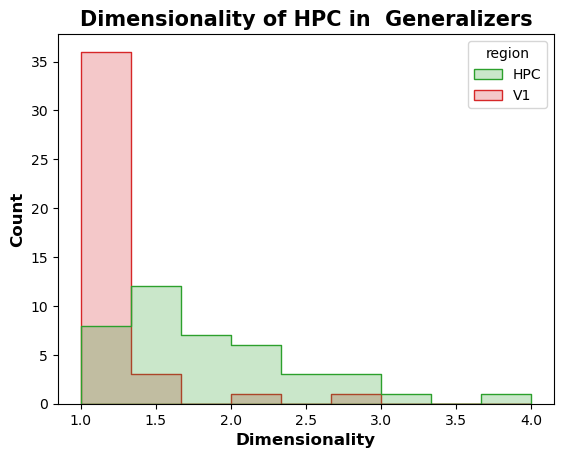

In [ ]:
svdestdim_df_sum_overaxis["region"] = [roi.split("_")[0] for roi in svdestdim_df_sum_overaxis["roi"]]
for gname, gdf in svdestdim_df_sum_overaxis.groupby("roi"):
    sns.histplot(data=gdf[(gdf.subgroup=="Generalizer")].copy(),
                x="est_dim",
                hue="region",palette=sns.color_palette("tab10",4)[2:],
                binrange=[1,4], element="step"
                    )
    plt.title(f"Dimensionality of HPC in  Generalizers",fontdict={"fontsize":15,"fontweight":"bold"})
    plt.xlabel("Dimensionality",fontdict={"fontsize":12,"fontweight":"bold"})
    plt.ylabel("Count",fontdict={"fontsize":12,"fontweight":"bold"})

###### for test stimuli

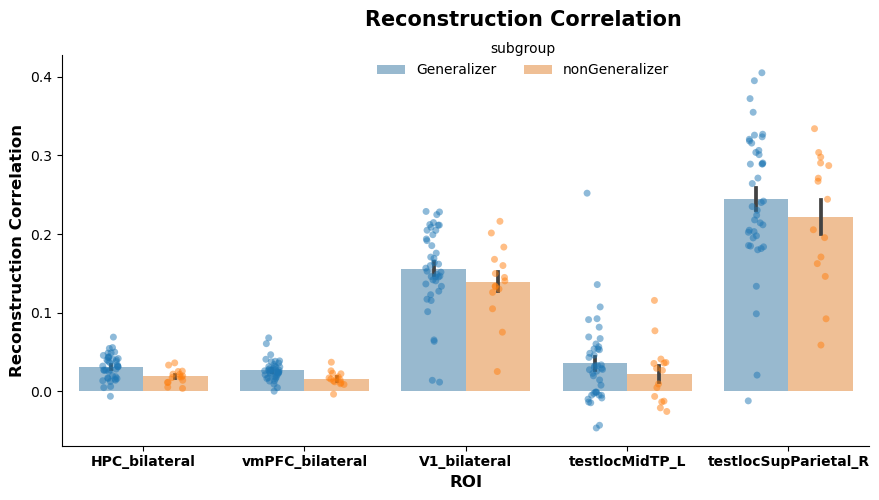

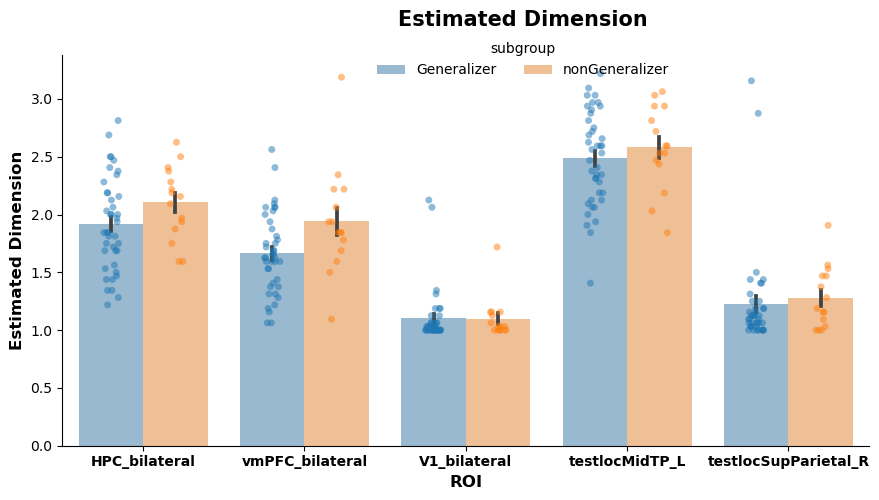

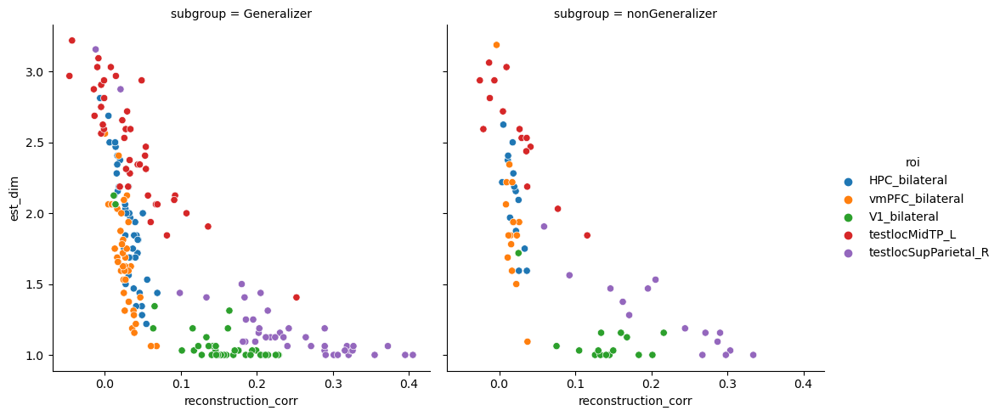

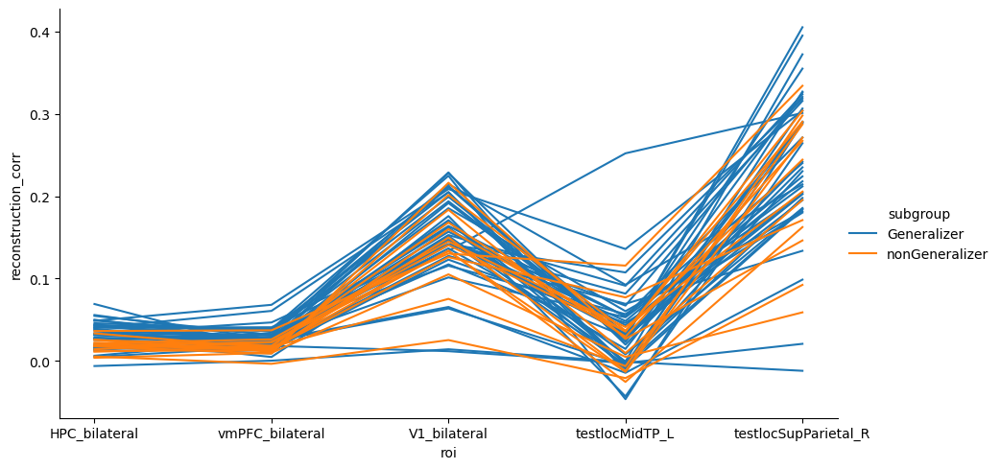

In [133]:
teststim_svdestdim_df = pd.read_csv(os.path.join(ROIRSAdir,"teststim_withinax_svdestdim_df.csv"))
teststim_svdestdim_df["roi"] = pd.Categorical(teststim_svdestdim_df.roi, categories=rois,ordered=True)
teststim_svdestdim_df_sum = teststim_svdestdim_df.groupby(["roi","subid","dimonaxis"])[['est_dim', 'reconstruction_corr']].mean().reset_index()
teststim_svdestdim_df_sum["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in teststim_svdestdim_df_sum["subid"]]    
teststim_svdestdim_df_sum["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in teststim_svdestdim_df_sum["subid"]] 

teststim_svdestdim_df_sum_overaxis = teststim_svdestdim_df_sum.groupby(["roi","subid"])[["est_dim","reconstruction_corr"]].mean().reset_index()
teststim_svdestdim_df_sum_overaxis["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in teststim_svdestdim_df_sum_overaxis["subid"]]    
teststim_svdestdim_df_sum_overaxis["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in teststim_svdestdim_df_sum_overaxis["subid"]] 

plot_yvars = {"Reconstruction Correlation":"reconstruction_corr","Estimated Dimension":"est_dim"}
for yname, ycol in plot_yvars.items():
    xcol,huecol = "roi","subgroup"
    #col_col = "roi"
    gs = sns.catplot(data=teststim_svdestdim_df_sum_overaxis,
                     y=ycol,
                     x=xcol,hue=huecol,palette="tab10",
                     #col=col_col,
                     kind="bar",errorbar="se",
                     dodge=True,                     
                     alpha=0.5,
                     sharex=False,
                     aspect=1.8)
    gs.map_dataframe(sns.stripplot,
                     y=ycol,
                     x=xcol,hue=huecol,palette="tab10",
                     dodge=True, 
                     alpha=0.5)
    for ax in gs.axes.flatten():
        ax.set_xlabel("ROI",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
        ax.set_ylabel(yname,fontdict={"fontsize":12,"fontweight":"bold"})
        plt.setp(ax.get_xticklabels(), fontsize=10, fontweight="bold")
        
    gs.figure.suptitle(yname,fontsize=15, fontweight="bold",y=0.99)
    sns.move_legend(gs,loc="upper center", bbox_to_anchor = (0.5,0.95),ncols=2)
    gs.tight_layout()

sns.relplot(data=teststim_svdestdim_df_sum_overaxis,
            x="reconstruction_corr",
            y="est_dim",
            col="subgroup", hue="roi")

sns.relplot(data=teststim_svdestdim_df_sum_overaxis,
            y="reconstruction_corr",
            x="roi", 
            hue="subgroup",
            units="subid", estimator=None,
            kind="line",aspect=1.8)



###### correlation between train and test

In [134]:
trte_estdim = svdestdim_df_sum.rename({"est_dim":"est_dim_train","reconstruction_corr":"reconstruction_corr_train"},axis=1)
trte_estdim = trte_estdim.join(
    teststim_svdestdim_df_sum.rename({"est_dim":"est_dim_test","reconstruction_corr":"reconstruction_corr_test"},axis=1).set_index(["roi","subid",'subgroup', 'subcohort',"dimonaxis"]),
    on=["roi","subid",'subgroup', 'subcohort',"dimonaxis"])




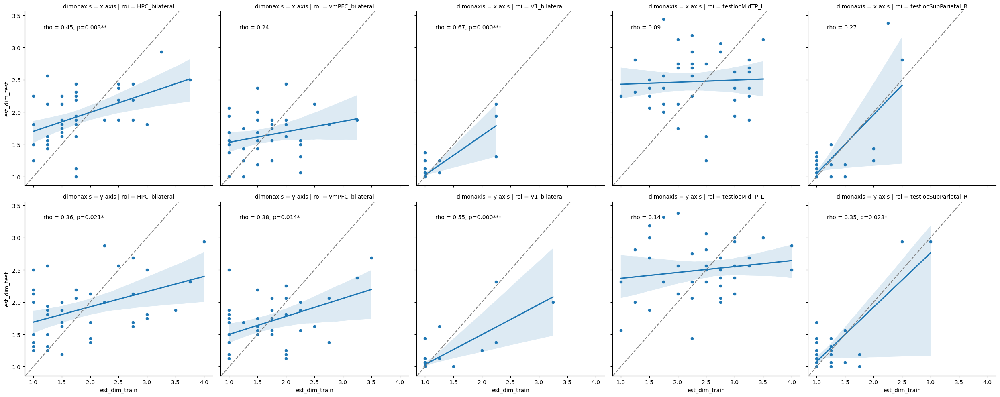

In [135]:
def rankcorr(data,x, y, **kwarg):
    res = pingouin.corr(data[x], data[y], method="spearman")
    rho,pval = res.r[0], res["p-val"][0]
    ax = plt.gca()
    if pval<=0.05:
        ax.annotate(f'rho = {rho:.2f}, {gen_pval_annot(pval)}', xy=(0.1, 0.9), xycoords=ax.transAxes)
    else:
        ax.annotate(f'rho = {rho:.2f}', xy=(0.1, 0.9), xycoords=ax.transAxes)
gs = sns.relplot(trte_estdim[trte_estdim.subgroup=="Generalizer"].copy(),
            x="est_dim_train",y="est_dim_test",
            col="roi",
            row="dimonaxis")
gs.map_dataframe(rankcorr,x="est_dim_train",y="est_dim_test")
gs.map_dataframe(sns.regplot,
                 x="est_dim_train",y="est_dim_test",scatter=False)
for ax in gs.axes.flatten():
    ax.axline(xy1=[1,1],slope=1,linestyle="--",color="grey")


## Decoding to see if there is stimuli, feature or location representation?

In [80]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

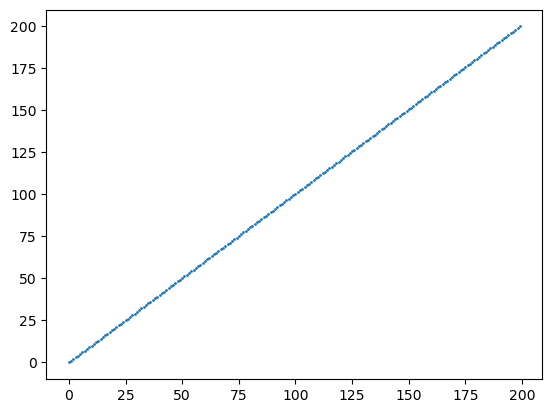

In [52]:
plt.scatter(np.arange(200),np.linspace(10**-5,200,num=200),s=1)

In [53]:
nctrstim_decoding_res = load(os.path.join(ROIRSAdir,"noncenter_trainingstim_LRdecoding_acc.pkl"))
print(nctrstim_decoding_res.keys())
print(nctrstim_decoding_res['GSresults'].columns)

dict_keys(['GSresults', 'decoder', 'performance', 'confusion_matrices'])
Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'roi', 'subid', 'target', 'heldoutrun'],
      dtype='object')


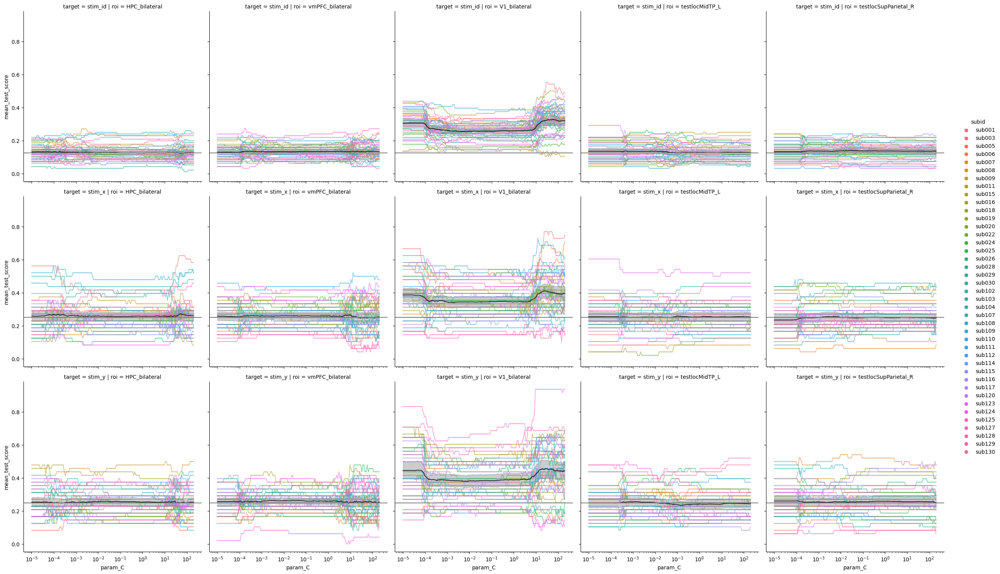

In [54]:
#check if gridsearch cover sufficient range of parameter range
decodingcheckgsdf = nctrstim_decoding_res['GSresults'][nctrstim_decoding_res['GSresults'].subid.isin(generalizers)].copy()
decodingcheckgsdf.roi = pd.Categorical(decodingcheckgsdf.roi, categories=rois,ordered=True)
decodingcheckgsdfsum = decodingcheckgsdf.groupby(["subid","roi","target","param_C"])["mean_test_score"].mean().reset_index()
gs = sns.relplot(data=decodingcheckgsdfsum,x="param_C",y="mean_test_score",hue="subid",col="roi",row="target",kind="scatter",facet_kws=dict(sharex=True,sharey=True),alpha=0.5,s=2)
gs.map_dataframe(sns.lineplot,x="param_C",y="mean_test_score",hue="subid",alpha=0.5) #show individual lines
gs.map_dataframe(sns.lineplot,x="param_C",y="mean_test_score",alpha=0.8,color="black") # show average line
gs.set(xscale="log")
for j,ax in enumerate(gs.axes.flatten()):
    if j < 5:
        ax.axhline(1/8,c="grey")
    else:
        ax.axhline(0.25,c="grey")

In [93]:
nctrstimdc_performance_df = nctrstim_decoding_res["performance"]
nctrstimdc_performance_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrstimdc_performance_df["subid"]]

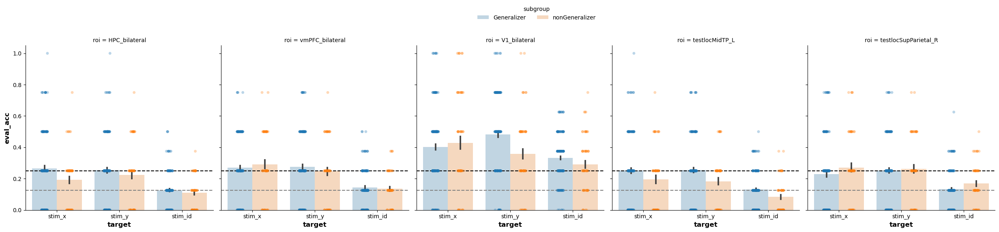

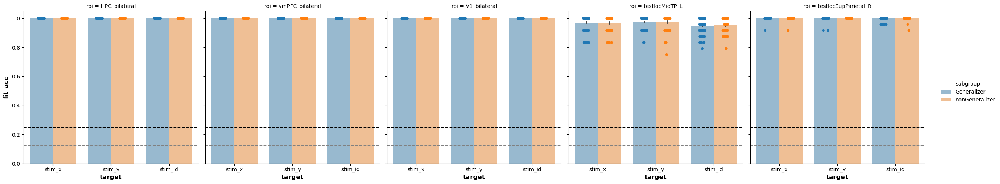

In [94]:
nctrstimdc_performance_df = nctrstim_decoding_res["performance"]
nctrstimdc_performance_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrstimdc_performance_df["subid"]]
gs = sns.catplot(data=nctrstim_decoding_res["performance"],
            x="target",y="eval_acc",
            hue="subgroup",palette="tab10",
            col="roi",
            kind="bar",errorbar="se",alpha=0.3)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black",label="stim feature decoding chance level")
    ax.axhline(1/8,linestyle="--",color="grey",label="stim ID decoding chance level")
gs.map_dataframe(sns.stripplot,
                 x="target",y="eval_acc",alpha=0.3,
                hue="subgroup",palette="tab10",
                dodge=True)
sns.move_legend(gs,loc="upper center", bbox_to_anchor=(0.5, 1.15), ncol=5)


gs = sns.catplot(data=nctrstim_decoding_res["performance"],
            x="target",y="fit_acc",
            hue="subgroup",palette="tab10",
            col="roi",
            kind="bar",errorbar="se",alpha=0.5)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black",label="stim feature decoding chance level")
    ax.axhline(1/8,linestyle="--",color="grey",label="stim ID decoding chance level")
gs.map_dataframe(sns.stripplot,
                 x="target",y="fit_acc",
                hue="subgroup",palette="tab10",
                dodge=True)

In [95]:
# correlation between decoding accuracy and dimensionality separately for each axis
training_feature_decoding = nctrstimdc_performance_df.query("target!='stim_id'").groupby(["roi","subid","target"])[["fit_acc","eval_acc"]].mean().reset_index()
training_feature_decoding["dimonaxis"] = training_feature_decoding["target"].map(dict(zip(['stim_x', 'stim_y'], ['x axis', 'y axis'])))
training_feature_decoding = training_feature_decoding.join(svdestdim_df_sum.set_index(["roi","subid","dimonaxis"]),on=["roi","subid","dimonaxis"],rsuffix="_svd")


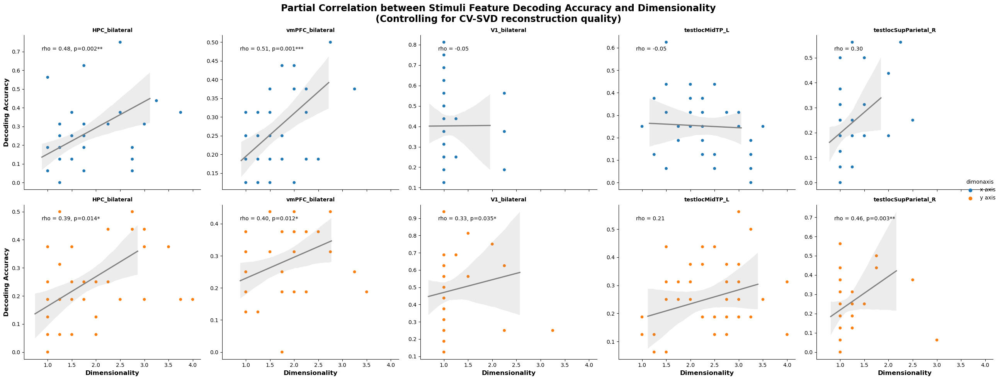

In [96]:
training_feature_decoding["roi"] = pd.Categorical(training_feature_decoding.roi, categories=rois,ordered=True)
def partialrankcorr(data,x, y,covar, **kwargs):
    res = pingouin.partial_corr(data=data, x=x,y=y,covar=covar,method="spearman")
    rho,pval = res.r[0], res["p-val"][0]
    ax = plt.gca()
    if pval<=0.05:
        ax.annotate(f'rho = {rho:.2f}, {gen_pval_annot(pval)}', xy=(0.1, 0.9), xycoords=ax.transAxes)
    else:
        ax.annotate(f'rho = {rho:.2f}', xy=(0.1, 0.9), xycoords=ax.transAxes)
gs = sns.relplot(data=training_feature_decoding[training_feature_decoding.subgroup=="Generalizer"].copy(),
            x="est_dim",y="eval_acc",
            palette="tab10",
            #hue="subcohort",
            row="dimonaxis",
            hue="dimonaxis",
            col="roi",
            facet_kws=dict(sharey=False),
            kind="scatter").set_titles("{col_name}",fontsize="x-large",fontweight="bold")
gs.map_dataframe(sns.regplot,
                 x="est_dim",y="eval_acc",
                 scatter=False,
                 color="grey",
                 x_partial="reconstruction_corr"
                 )
gs.map_dataframe(partialrankcorr, x="est_dim",y="eval_acc",covar="reconstruction_corr")
gs.set_ylabels("Decoding Accuracy",fontsize="large",fontweight="bold")
gs.set_xlabels("Dimensionality",fontsize="large",fontweight="bold")
gs.figure.suptitle("Partial Correlation between Stimuli Feature Decoding Accuracy and Dimensionality\n(Controlling for CV-SVD reconstruction quality)",fontsize="xx-large",fontweight="bold")
gs.figure.tight_layout()


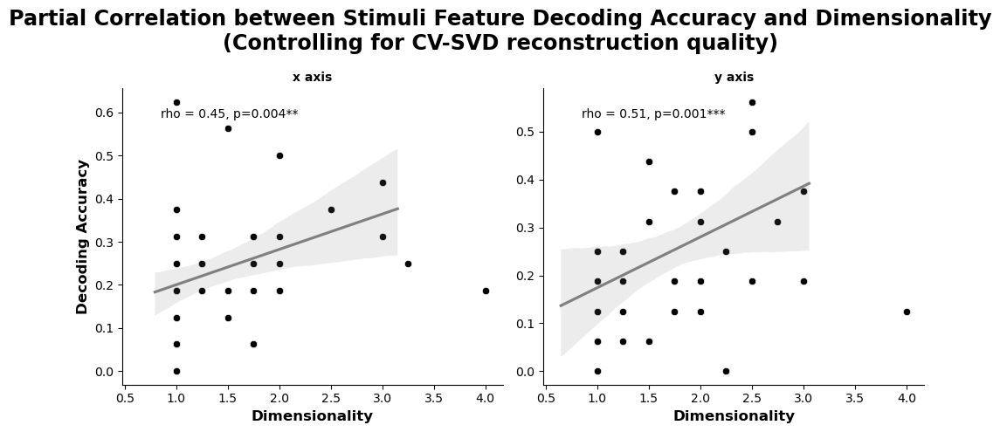

In [62]:
# correlation between decoding accuracy and dimensionality separately for each axis
training_feature_decoding["region"] = [roi.split("_")[0] for roi in training_feature_decoding["roi"]]   

def partialrankcorr(data,x, y,covar, **kwargs):
    res = pingouin.partial_corr(data=data, x=x,y=y,covar=covar,method="spearman")
    rho,pval = res.r[0], res["p-val"][0]
    ax = plt.gca()
    if pval<=0.05:
        ax.annotate(f'rho = {rho:.2f}, {gen_pval_annot(pval)}', xy=(0.1, 0.9), xycoords=ax.transAxes)
    else:
        ax.annotate(f'rho = {rho:.2f}', xy=(0.1, 0.9), xycoords=ax.transAxes)
gs = sns.relplot(data=training_feature_decoding[(training_feature_decoding.subgroup=="Generalizer")&(training_feature_decoding.region=="HPC")].copy(),
            x="est_dim",y="eval_acc",
            #palette=sns.color_palette("tab10",4)[2:],
            #hue="dimonaxis",
            color="black",
            col="dimonaxis",
            facet_kws=dict(sharey=False),
            kind="scatter").set_titles("{col_name}",fontsize="x-large",fontweight="bold")
gs.map_dataframe(sns.regplot,
                 x="est_dim",y="eval_acc",
                 scatter=False,
                 color="grey",
                 x_partial="reconstruction_corr"
                 )
gs.map_dataframe(partialrankcorr, x="est_dim",y="eval_acc",covar="reconstruction_corr")
gs.set_ylabels("Decoding Accuracy",fontsize="large",fontweight="bold")
gs.set_xlabels("Dimensionality",fontsize="large",fontweight="bold")
gs.figure.suptitle("Partial Correlation between Stimuli Feature Decoding Accuracy and Dimensionality\n(Controlling for CV-SVD reconstruction quality)",fontsize="xx-large",fontweight="bold")
gs.figure.tight_layout()



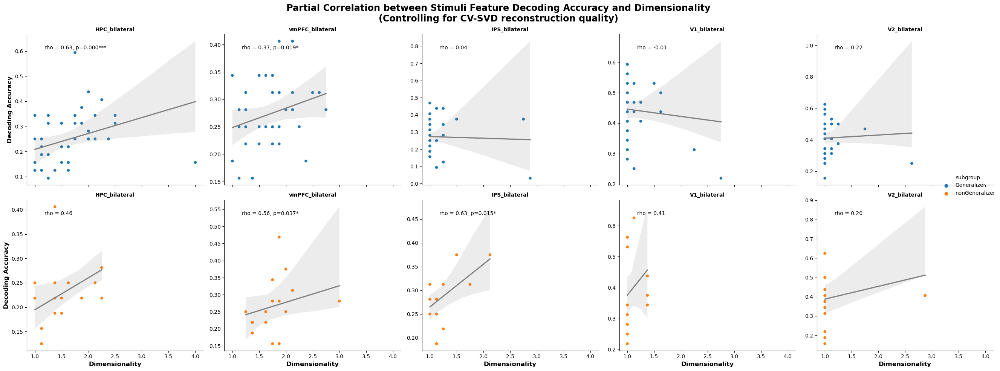

In [382]:
training_feature_decoding_sumoveraxis = training_feature_decoding.groupby(["roi","subid"])[["eval_acc","est_dim","reconstruction_corr"]].mean().reset_index()
training_feature_decoding_sumoveraxis["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in training_feature_decoding_sumoveraxis["subid"]]
def partialrankcorr(data,x, y,covar, **kwargs):
    res = pingouin.partial_corr(data=data, x=x,y=y,covar=covar,method="spearman")
    rho,pval = res.r[0], res["p-val"][0]
    ax = plt.gca()
    if pval<=0.05:
        ax.annotate(f'rho = {rho:.2f}, {gen_pval_annot(pval)}', xy=(0.1, 0.9), xycoords=ax.transAxes)
    else:
        ax.annotate(f'rho = {rho:.2f}', xy=(0.1, 0.9), xycoords=ax.transAxes)
gs = sns.relplot(data=training_feature_decoding_sumoveraxis,
            x="est_dim",y="eval_acc",
            palette="tab10",
            row="subgroup",
            hue="subgroup",
            col="roi",
            facet_kws=dict(sharey=False),
            kind="scatter").set_titles("{col_name}",fontsize="x-large",fontweight="bold")
gs.map_dataframe(sns.regplot,
                 x="est_dim",y="eval_acc",
                 scatter=False,
                 color="grey",
                 y_partial="reconstruction_corr"
                 )
gs.map_dataframe(partialrankcorr, x="est_dim",y="eval_acc",covar="reconstruction_corr")
gs.set_ylabels("Decoding Accuracy",fontsize="large",fontweight="bold")
gs.set_xlabels("Dimensionality",fontsize="large",fontweight="bold")
gs.figure.suptitle("Partial Correlation between Stimuli Feature Decoding Accuracy and Dimensionality\n(Controlling for CV-SVD reconstruction quality)",fontsize="xx-large",fontweight="bold")
gs.figure.tight_layout()


## RSA regression of High vs Low dimension representation

In [112]:
#run RSA analysis
res_df_list = []
for roi in rois:
    for subdata,subid in zip(roi_data[roi],subid_list):
        print(f"{roi} - {subid}",end="\r",flush=True)
        subgroup = "Generalizer" if subid in generalizers else "nonGeneralizer"
        subcohort = "first cohort" if subid in cohort1ids else "second cohort"
        preprocedX = deepcopy(subdata["preprocX"])#deepcopy(subdata["rawX"])#
        stimdf = subdata["stimdf"]
        
        navi_filter = stimdf.taskname.to_numpy() == "navigation"
        non_center_filter = [not all([x==0, y==0]) for x,y in stimdf[["stim_x","stim_y"]].to_numpy()]

        final_filter = np.all([navi_filter,non_center_filter],axis=0)
        #average across sessions
        navi_X = np.mean(split_data(X      = preprocedX[final_filter,:],
                                    groups = stimdf[final_filter].copy().stim_session.to_numpy()),
                        axis=0)
        
        stim_dict = stimdf[final_filter&(stimdf.stim_session==0)].copy().reset_index(drop=True).to_dict('list')
        submodelrdm = ModelRDM(
            stimid    = stim_dict["stim_id"],
            stimgtloc = np.vstack([stim_dict["stim_x"],stim_dict["stim_y"]]).T,
            stimfeature = np.vstack([stim_dict["stim_color"],stim_dict["stim_shape"]]).T,
            stimgroup = stim_dict["stim_group"],
            sessions = stim_dict["stim_session"],
            nan_identity = False,
            splitgroup  = True
        )

        prim_reg_names = ["gtlocEuclidean","feature"]
        
        #tam = scanner_ave_perf[scanner_ave_perf.subid==subid].copy()["tamapping"].values[0]

        tam = np.sign(scanner_ave_perf[scanner_ave_perf.subid==subid].copy()[["countx_coef","county_coef"]].to_numpy()).prod()

        PTAhigh_prim = "PTA_locNomial_TL" if tam==1 else "PTA_locNomial_TR"
        PTAlow_prim = "PTA_locEuc_TL" if tam==1 else "PTA_locEuc_TR"
        
        analyses = [
            {"name": "train stim withinxy - Euc",
            "reg_names": [f"withinxy_trainstimpairs_{PTAlow_prim}"],
            "short_names": ["locEuc within axis"]
            },
            {"name": "train stim withinxy - VisualField",
            "reg_names": ["withinxy_trainstimpairs_hierachical_wrtcentre"],
            "short_names": ["VisualField within axis"]
            },

            {"name": "train stim Compete Feature Cartesian",
            "reg_names": [f"trainstimpairs_{x}" for x in prim_reg_names],
            "short_names":  prim_reg_names
            },

            {"name": "test stim Compete Feature Cartesian",
            "reg_names": [f"teststimpairs_{x}" for x in prim_reg_names],
            "short_names":  prim_reg_names
            },
            {"name": "test stim Compete Feature CartesianCB",
            "reg_names": [f"teststimpairs_{x}" for x in ["gtlocCityBlock","feature"]],
            "short_names":  ["gtlocCityBlock","feature"]
            },

            {"name": "test stim withinxy - Euc",
            "reg_names": [f"withinxy_teststimpairs_gtlocEuclidean"],
            "short_names": ["locEuc within axis"]
            },
            {"name": "test stim Cartesian",
            "reg_names": [f"teststimpairs_gtlocEuclidean"],
            "short_names": ["gtlocEuclidean"]
            },
            {"name": "test stim feature",
            "reg_names": [f"teststimpairs_feature"],
            "short_names": ["feature"]
            }
            
        ]
        
        for analysis_dict in analyses:
            reg_names, short_names = analysis_dict["reg_names"], analysis_dict["short_names"]
            reg_vals  = [submodelrdm.models[k] for k in reg_names]
            if len(reg_names)>1: # get regression coefficients if number of model rdm is more than 1
                reg_estimator  = MultipleRDMRegression(navi_X,
                                                    modelrdms=reg_vals,
                                                    modelnames=short_names,
                                                    rdm_metric="correlation")
            else: # get z-transformed spearman correlation coefficient if only one model rdm
                reg_estimator  = PatternCorrelation(navi_X,
                                                    modelrdms=reg_vals,
                                                    modelnames=short_names,
                                                    rdm_metric="correlation",
                                                    type="spearman",
                                                    ztransform=True)
            reg_estimator.fit()
            res_df = pd.DataFrame(
                {"modelrdm":   reg_estimator.modelnames,
                "coefficient": reg_estimator.result}
            ).assign(
            roi = roi,
            subid=subid,
            subgroup=subgroup,
            cohort = subcohort,
            analysis = analysis_dict["name"],
            adjR2 = reg_estimator.adjR2 if len(reg_names)>1 else np.nan,
            R2    = reg_estimator.R2 if len(reg_names)>1 else np.nan,
            )
            res_df_list.append(res_df)



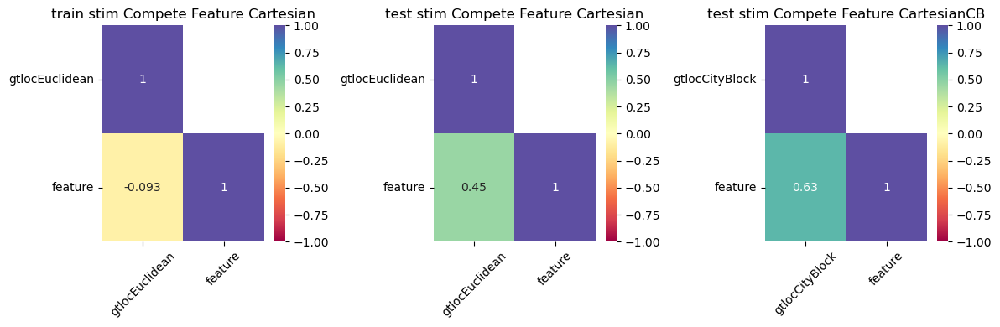

In [113]:
# correlation between model RDMs
show_reg_corrs_for = [x for x in analyses if len(x["reg_names"])>1]
plot_rows = np.ceil(len(show_reg_corrs_for)/5).astype(int) if len(show_reg_corrs_for)>5 else 1
plot_cols = np.ceil(len(show_reg_corrs_for)/plot_rows).astype(int)
fig_regcorr, axes_regcorr = plt.subplots(plot_rows,plot_cols,figsize=(4*plot_cols,4*plot_rows))
for j,analysis_dict in enumerate(show_reg_corrs_for):
    reg_names, short_names = analysis_dict["reg_names"], analysis_dict["short_names"]
    reg_vals  = [submodelrdm.models[k] for k in reg_names]
    reg_estimator  = MultipleRDMRegression(navi_X,
                                        modelrdms=reg_vals,
                                        modelnames=short_names,
                                        rdm_metric="correlation")
    reg_estimator.fit()

    regressor_corrs = 1 - compute_rdm(reg_estimator.X[reg_estimator.na_filters].T,"correlation")
    regressor_corrs[upper_tri(regressor_corrs)[1]] = np.nan
    sns.heatmap(regressor_corrs,ax = axes_regcorr.flatten()[j],annot=True,center=0,vmin=-1,vmax=1,cmap="Spectral")
    axes_regcorr.flatten()[j].set_xticklabels(short_names,rotation=45)
    axes_regcorr.flatten()[j].set_yticklabels(short_names,rotation=0)
    axes_regcorr.flatten()[j].set_title(analysis_dict["name"])

if len(show_reg_corrs_for) < plot_rows*plot_cols:
    for j in range(int(plot_rows*plot_cols)-len(show_reg_corrs_for)):
        axes_regcorr.flatten()[j+len(show_reg_corrs_for)].remove()
    
fig_regcorr.tight_layout()

In [117]:
res_df = pd.concat(res_df_list,axis=0).reset_index(drop=True)
print(res_df.shape)
print(f"unique analysis names: {np.unique(res_df.analysis)}")
print(f"unique modelrdm names: {np.unique(res_df.modelrdm)}")
res_df.head(5)

(3080, 9)
unique analysis names: ['test stim Cartesian' 'test stim Compete Feature Cartesian'
 'test stim Compete Feature CartesianCB' 'test stim feature'
 'test stim withinxy - Euc' 'train stim Compete Feature Cartesian'
 'train stim withinxy - Euc' 'train stim withinxy - VisualField']
unique modelrdm names: ['VisualField within axis' 'feature' 'gtlocCityBlock' 'gtlocEuclidean'
 'locEuc within axis']


,modelrdm,coefficient,roi,subid,subgroup,cohort,analysis,adjR2,R2
0,locEuc within axis,-0.244978,HPC_bilateral,sub001,Generalizer,first cohort,train stim withinxy - Euc,NaN,NaN
1,VisualField within axis,-0.148919,HPC_bilateral,sub001,Generalizer,first cohort,train stim withinxy - VisualField,NaN,NaN
2,gtlocEuclidean,-0.135970,HPC_bilateral,sub001,Generalizer,first cohort,train stim Compete Feature Cartesian,0.014507,0.051006
3,feature,0.168103,HPC_bilateral,sub001,Generalizer,first cohort,train stim Compete Feature Cartesian,0.014507,0.051006
4,gtlocEuclidean,0.114548,HPC_bilateral,sub001,Generalizer,first cohort,test stim Compete Feature Cartesian,0.003431,0.011806


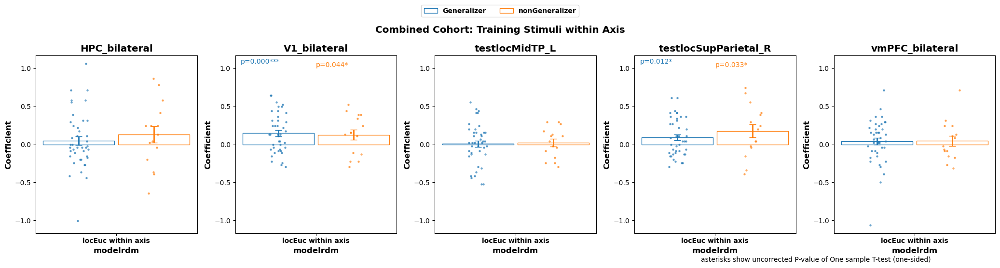

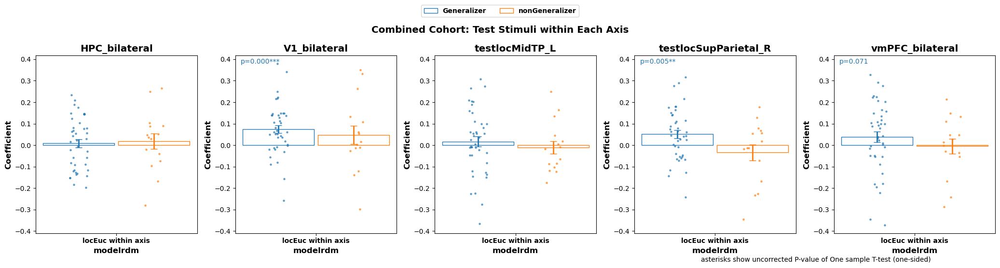

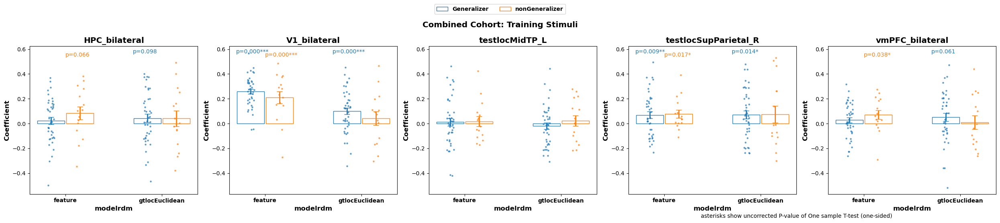

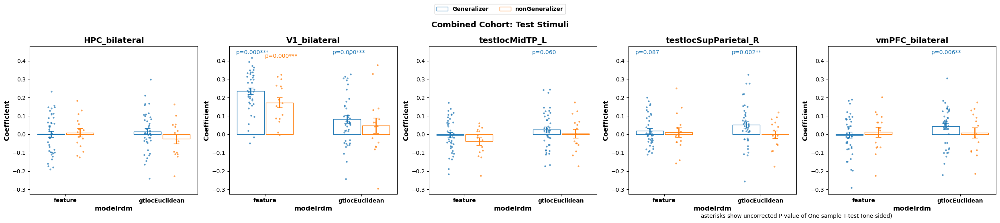

In [ ]:
# test if coefficients are significantly above zero
xvar, gvar, yvar, yvartest = "modelrdm",  "subgroup", "coefficient", "coefficient"


plt_ana = dict(zip(["train stim withinxy - Euc",
                    "test stim withinxy - Euc",
                    "train stim Compete Feature Cartesian",
                    "test stim Compete Feature Cartesian"                     
                    ],
                   
                   ["Training Stimuli within Axis",
                    "Test Stimuli within Each Axis",
                    "Training Stimuli",
                    "Test Stimuli", 
                    ]))
aprs    = dict(zip(["train stim withinxy - Euc",
                    "test stim withinxy - Euc",
                    "train stim Compete Feature Cartesian",
                    "test stim Compete Feature Cartesian", 
                    ],
                   [1.2,
                    1.2,
                    1,
                    1
]))


#for cname,clist in zip(["First Cohort","Second Cohort","Combined Cohort"],[cohort1ids,cohort2ids,subid_list]):
for cname,clist in zip(["Combined Cohort"],[subid_list]):
    for a, atitle in plt_ana.items():
        curr_pdf = res_df[(res_df.analysis==a)&(res_df.subid.isin(clist))].copy().reset_index(drop=True)
        curr_pdf.modelrdm = pd.Categorical(curr_pdf.modelrdm)
        nonparstat = lambda yt:scipy.stats.wilcoxon(yt,alternative="greater").pvalue
        parastat = lambda yt: scipy.stats.ttest_1samp(yt,0,alternative="greater").pvalue
        stat_name = 'Wilcoxon signed-rank test' if cname != "Combined Cohort" else 'One sample T-test'
        stat_func = nonparstat if cname != "Combined Cohort" else parastat
        fig,axes = grouped_barscatter_withstats(curr_pdf,
                                    facet_vars = "roi", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                    prows=1,pcols=5,hrow=5,wcol=5/aprs[a],
                                    statfunc= parastat)
        for ifacet, _ in enumerate(axes.flatten()):
            axes.flatten()[ifacet].set_ylabel("Coefficient",fontweight="bold",fontsize="large")
            axes.flatten()[ifacet].set_xlabel("modelrdm",fontweight="bold",fontsize="large")
        
            
        hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
        fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        fig.suptitle(f"{cname}: {atitle}",fontweight="bold",fontsize="x-large")
        fig.text(x=0.7, y=0, s=f'asterisks show uncorrected P-value of {stat_name} (one-sided)')
        fig.tight_layout()


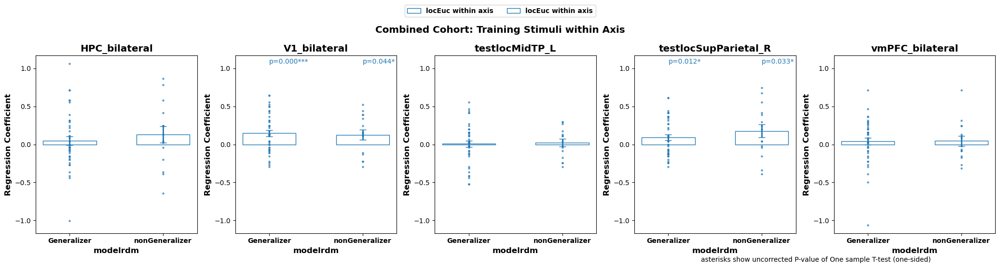

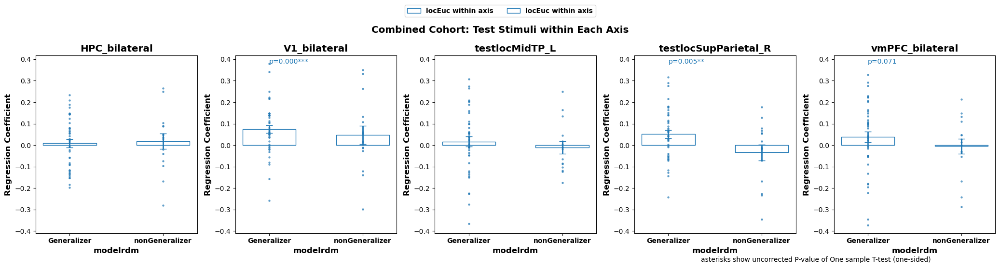

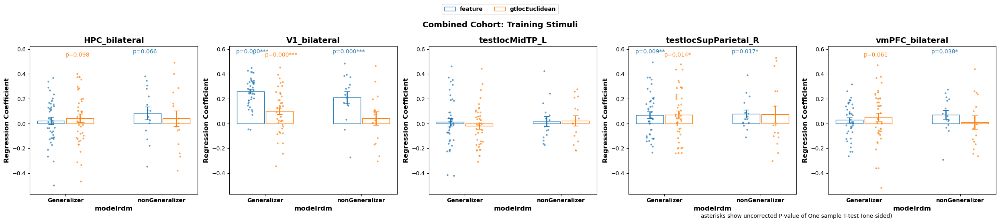

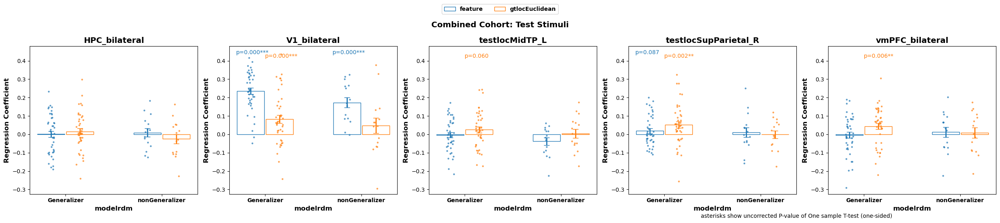

In [120]:
# test if coefficients are significantly above zero
xvar, gvar, yvar, yvartest = "subgroup", "modelrdm",  "coefficient", "coefficient"


plt_ana = dict(zip(["train stim withinxy - Euc",
                    "test stim withinxy - Euc",
                    "train stim Compete Feature Cartesian",
                    "test stim Compete Feature Cartesian"                     
                    ],
                   
                   ["Training Stimuli within Axis",
                    "Test Stimuli within Each Axis",
                    "Training Stimuli",
                    "Test Stimuli", 
                    ]))
aprs    = dict(zip(["train stim withinxy - Euc",
                    "test stim withinxy - Euc",
                    "train stim Compete Feature Cartesian",
                    "test stim Compete Feature Cartesian", 
                    ],
                   [1.2,
                    1.2,
                    1,
                    1
]))


#for cname,clist in zip(["First Cohort","Second Cohort","Combined Cohort"],[cohort1ids,cohort2ids,subid_list]):
for cname,clist in zip(["Combined Cohort"],[subid_list]):
    for a, atitle in plt_ana.items():
        curr_pdf = res_df[(res_df.analysis==a)&(res_df.subid.isin(clist))].copy().reset_index(drop=True)
        curr_pdf.modelrdm = pd.Categorical(curr_pdf.modelrdm)
        curr_pdf.subgroup = pd.Categorical(curr_pdf.subgroup)
        nonparstat = lambda yt:scipy.stats.wilcoxon(yt,alternative="greater").pvalue
        parastat = lambda yt: scipy.stats.ttest_1samp(yt,0,alternative="greater").pvalue
        stat_name = 'Wilcoxon signed-rank test' if cname != "Combined Cohort" else 'One sample T-test'
        stat_func = nonparstat if cname != "Combined Cohort" else parastat
        fig,axes = grouped_barscatter_withstats(curr_pdf,
                                    facet_vars = "roi", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                    prows=1,pcols=5,hrow=5,wcol=5/aprs[a],
                                    statfunc= parastat)
        for ifacet, _ in enumerate(axes.flatten()):
            axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
            axes.flatten()[ifacet].set_xlabel("modelrdm",fontweight="bold",fontsize="large")
        
            
        hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
        fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        fig.suptitle(f"{cname}: {atitle}",fontweight="bold",fontsize="x-large")
        fig.text(x=0.7, y=0, s=f'asterisks show uncorrected P-value of {stat_name} (one-sided)')
        fig.tight_layout()


From the first two plots above, we can see that within each training axis, we didn't observe compression  
The plot below shows that the degree of compression is not consistent in train vs test either

Combined Cohort-HPC: PearsonRResult(statistic=0.06302636913578846, pvalue=0.6954462539923666)
Combined Cohort-vmPFC: PearsonRResult(statistic=0.22928136559411097, pvalue=0.14930080113938685)
Combined Cohort-IPS: PearsonRResult(statistic=0.29433796709407495, pvalue=0.06175969607975196)
Combined Cohort-V1: PearsonRResult(statistic=-0.013448291839403693, pvalue=0.9334923374070662)
Combined Cohort-V2: PearsonRResult(statistic=0.09681790481375274, pvalue=0.5470525097929805)


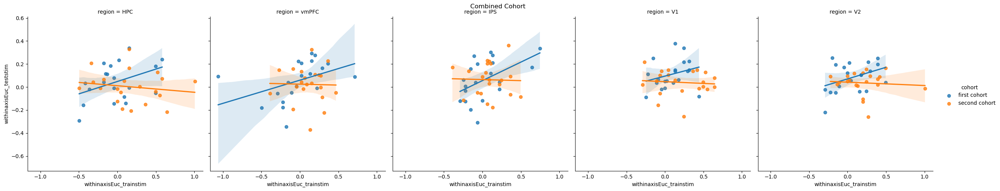

In [385]:
cname = "Combined Cohort"
clist = cohort_names_lists[cname] #
trte_comprRSA = res_df[(res_df.analysis.isin(["train stim withinxy - Euc","test stim withinxy - Euc"]))&(res_df.subid.isin(clist))].copy().reset_index(drop=True)
trte_comprRSA.analysis=trte_comprRSA.analysis.map(dict(zip(["train stim withinxy - Euc","test stim withinxy - Euc"],["_trainstim","_teststim"])))
trte_comprRSA["withinaxisEuc"] = trte_comprRSA["coefficient"]
trte_comprRSA_wide = trte_comprRSA.pivot(index=["subid","subgroup","cohort","roi","region","side","modelrdm"],
                columns="analysis",
                values=["withinaxisEuc"]).reset_index()
trte_comprRSA_wide = trte_comprRSA_wide.set_axis(trte_comprRSA_wide.columns.map(''.join), axis=1)
trte_comprRSA_wide["region"] = pd.Categorical(trte_comprRSA_wide["region"],categories=base_rois,ordered=True)

trte_comprRSA_wide
#sns.scatterplot(trte_comprRSA_wide[trte_comprRSA_wide.subid.isin(generalizers)],
#                x="withinaxisEuc_trainstim",y="withinaxisEuc_teststim",hue="cohort")
#

sns.lmplot(trte_comprRSA_wide[trte_comprRSA_wide.subid.isin(generalizers)],
            x="withinaxisEuc_trainstim",y="withinaxisEuc_teststim",
            hue="cohort",
            col="region")
plt.gcf().suptitle(cname,y=1)
#maxabscoef = np.abs([trte_comprRSA["coefficient"].min(),trte_comprRSA["coefficient"].max()]).max()
#plt.axline(-maxabscoef*np.ones(2,),maxabscoef*np.ones(2,),c="grey",linestyle="dashed")
for roi in base_rois:
    corr_res = scipy.stats.pearsonr(trte_comprRSA_wide[trte_comprRSA_wide.subid.isin(generalizers)&(trte_comprRSA_wide.region==roi)]["withinaxisEuc_trainstim"],
                                    trte_comprRSA_wide[trte_comprRSA_wide.subid.isin(generalizers)&(trte_comprRSA_wide.region==roi)]["withinaxisEuc_teststim"])
    print(f"{cname}-{roi}: {corr_res}")

## PS score for parallel vs orthogonal


#### On raw activity pattern

In [9]:
#load precalculated PS and null distribution of PS
ROIPS_dict = load(os.path.join(ROIRSAdir,"ROI_PS_trainingnocenter_permnocentering.pkl"))
sub_cs_perms, sub_cs_obs = ROIPS_dict["permutation"], ROIPS_dict["observation"]


In [35]:
subrep_category = {}
ps_crit = 0.005
for roi in rois:
    subrep_category[roi] = []
    cs_null = np.array(sub_cs_perms[roi]).mean(axis=0)
    cs_null_G = np.array([csn for csn,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers and subid in subid_list]).mean(axis=0)
    cs_null_NG = np.array([csn for csn,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers and subid in subid_list]).mean(axis=0)
    for subps,_ in zip(sub_cs_obs[roi],sub_cs_perms[roi]):
        if np.mean(cs_null<subps)<ps_crit:
            subrep_category[roi].append(-1)
        elif np.mean(cs_null>subps)<ps_crit:
            subrep_category[roi].append(1)
        else:
            subrep_category[roi].append(0)

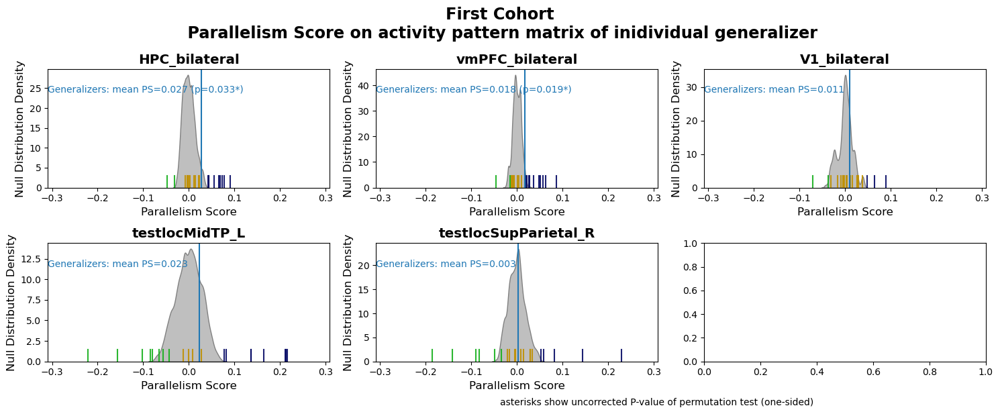

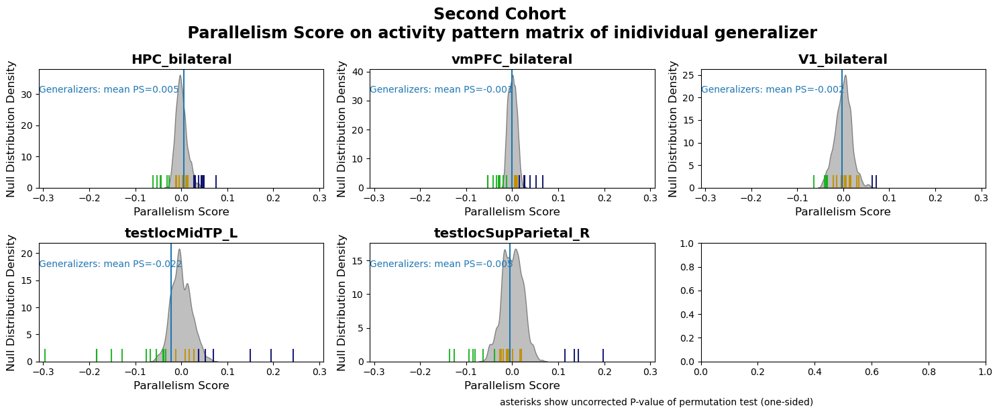

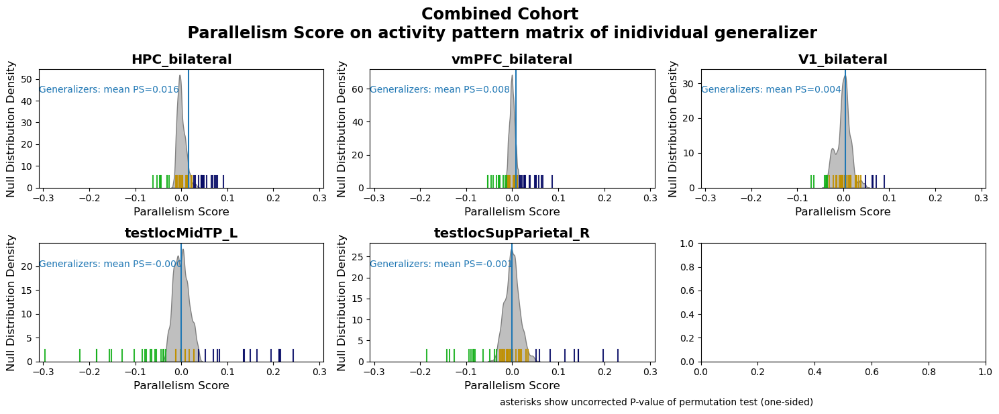

In [36]:
psgroup_huedict = dict(zip([-1,0,1],["#15B01A","#BF9000","#030764"])) # GREEN, yellow, darkblue
psxlimtmp = [np.min([np.min(sub_cs_obs[roi]) for roi in rois]),
          np.max([np.max(sub_cs_obs[roi]) for roi in rois])]
psxlim = [-np.abs(psxlimtmp).max(), np.abs(psxlimtmp).max()]
for sname, slist in cohort_names_lists.items():        
    fig_cs,axes_cs = plt.subplots(2,3,figsize=(15,6))
    GnG_colors = sns.color_palette(None,2)
    twinaxes_cs = []
    for j,roi in enumerate(rois):
        cs_null = np.array(sub_cs_perms[roi]).mean(axis=0)
        cs_null_G = np.array([csn for csn,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers and subid in slist]).mean(axis=0)
        cs_null_NG = np.array([csn for csn,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers and subid in slist]).mean(axis=0)
        cs_null = cs_null_G
        
        cs_G = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers and subid in slist]
        cs_NG = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers and subid in slist]

        #hist_n,hist_bins,_ = axes_cs.flatten()[j].hist(cs_null,color="grey",label="null",alpha=0.5,bins='doane')
        sns.kdeplot(data=pd.DataFrame(np.atleast_2d(cs_null).T,columns=["null"]),
                    x="null",bw_adjust=1,
                    color="grey",fill=True,alpha=0.5,ax=axes_cs.flatten()[j])
        axylim = axes_cs.flatten()[j].get_ylim()
        axes_cs.flatten()[j].set_xlim(psxlim)
        #twinaxes_cs.append(axes_cs.flatten()[j].twinx()) 
        #twinaxes_cs[j].set_ylim([0,1])
        #oghist_n,oghist_bins,_ = twinaxes_cs[j].hist(cs_G,color="lightsteelblue",label="Gnull",alpha=0.3)
        #onghist_n,onghist_bins,_ = twinaxes_cs[j].hist(cs_NG,color="bisque",label="NGnull",alpha=0.3)
        #twinaxes_cs[j].set_ylabel("Observed Distribution Count",fontsize="large")
        
        for x,subid,subrc in zip(sub_cs_obs[roi],subid_list,subrep_category[roi]):
            if subid in generalizers and subid in slist:
                alpha_v = 0.9 #0.3 if abs(subrc)==1 else 0.9
                axes_cs.flatten()[j].axvline(x,ymin=0,ymax=.1,color=psgroup_huedict[subrc],label="G",alpha=alpha_v)

        G_csmu = np.mean(cs_G)
        axes_cs.flatten()[j].axvline(x=G_csmu,color=GnG_colors[0],label="Generalizers")
        NG_csmu = np.mean(cs_NG)
        #axes_cs.flatten()[j].axvline(x=NG_csmu,color=GnG_colors[1], label="nonGeneralizers")
        Gp = (1 - np.mean([G_csmu>csn for csn in cs_null_G]))
        NGp = (1 - np.mean([NG_csmu>csn for csn in cs_null_NG]))
        if Gp<0.05:
            axes_cs.flatten()[j].text(psxlim[0],0.8*axylim[1],f"Generalizers: mean PS={'%.3f' % G_csmu} ({gen_pval_annot(Gp)})",color=GnG_colors[0])
        else:
            axes_cs.flatten()[j].text(psxlim[0],0.8*axylim[1],f"Generalizers: mean PS={'%.3f' % G_csmu}",color=GnG_colors[0])
        #axes_cs.flatten()[j].text(psxlim[0],0.5*axylim[1],f"nonGeneralizers: mean PS={'%.3f' % NG_csmu}",color=GnG_colors[1]) 
        
        #if NGp<0.05:
        #		axes_cs.flatten()[j].text(psxlim[0],np.median(hist_n)*0.8,f"nonGeneralizers: mean PS={'%.3f' % NG_csmu} ({gen_pval_annot(NGp)})",color=GnG_colors[1])
        #else:
        #		axes_cs.flatten()[j].text(psxlim[0],np.median(hist_n)*0.8,f"nonGeneralizers: mean PS={'%.3f' % NG_csmu}",color=GnG_colors[1]) 
        
        axes_cs.flatten()[j].set_title(roi,fontweight="bold",fontsize="x-large")
        axes_cs.flatten()[j].set_xlabel("Parallelism Score",fontsize="large")
        axes_cs.flatten()[j].set_ylabel("Null Distribution Density",fontsize="large")

    fig_cs.text(x=0.5, y=-.01, s='asterisks show uncorrected P-value of permutation test (one-sided)')
    fig_cs.suptitle(f"{sname}\n Parallelism Score on activity pattern matrix of inidividual generalizer",fontweight="bold",fontsize="xx-large")
    fig_cs.tight_layout()


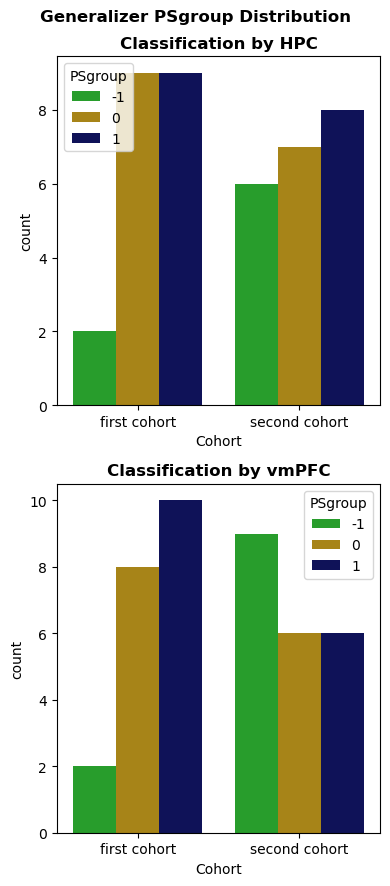

In [37]:
subrep_category_df = pd.DataFrame(subrep_category)
subrep_category_df["subid"] = subid_list
subrep_category_df["cohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in subid_list]
subrep_category_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in subid_list]
plt.subplots(2,1,figsize=(4,9))
plt.subplot(2,1,1)
sns.countplot(subrep_category_df[subrep_category_df.subid.isin(generalizers)].copy().reset_index(drop=True),
              x="cohort",hue="HPC_bilateral",palette=psgroup_huedict)
plt.legend(title='PSgroup', loc='best')
plt.xlabel("Cohort")
plt.title("Classification by HPC",fontweight="bold")

plt.subplot(2,1,2)
sns.countplot(subrep_category_df[subrep_category_df.subid.isin(generalizers)].copy().reset_index(drop=True),
              x="cohort",hue="vmPFC_bilateral",palette=psgroup_huedict)
plt.xlabel("Cohort")
plt.legend(title='PSgroup', loc='best')
plt.title("Classification by vmPFC",fontweight="bold")

plt.suptitle("Generalizer PSgroup Distribution",fontweight="bold")
plt.tight_layout()

Index(['HPC_bilateral', 'vmPFC_bilateral', 'V1_bilateral', 'testlocMidTP_L',
       'testlocSupParietal_R', 'subid', 'subgroup', 'cohort', 'subcohort',
       'odd', 'even', 'asym_cont', 'asym', 'subid_cat'],
      dtype='object')

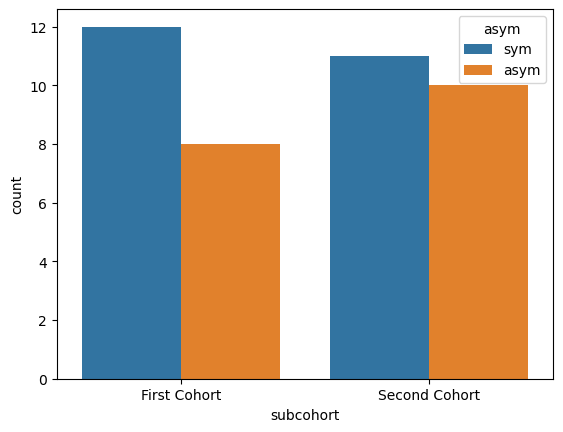

In [38]:
#put into dataframe
ps_roi_df = pd.DataFrame(sub_cs_obs)
ps_roi_df["subid"] = pd.Categorical(subid_list,categories=subid_list,ordered=True)
ps_roi_df["subgroup"] = ["Generalizer" if sid in generalizers else "nonGeneralizer" for sid in ps_roi_df["subid"]]
ps_roi_df["cohort"] = ["first cohort" if sid in cohort1ids else "second cohort" for sid in ps_roi_df["subid"]]

#g = sns.JointGrid(data=ps_roi_df[ps_roi_df.subgroup=="Generalizer"].copy(), 
#                  x="HPC_bilateral", y="vmPFC_bilateral", hue="cohort")
#g.plot(sns.scatterplot, sns.histplot)


scanner_ave_perf = pd.read_csv(os.path.join(studydata_dir,"scanner_average_LLR_wmapping.csv"))
scanner_ave_perf.subid=pd.Categorical(scanner_ave_perf.subid,categories=subid_list,ordered=True)
scanner_ave_perf = scanner_ave_perf.sort_values("subid").reset_index(drop=True)


asymlearning_perf = pd.read_csv(os.path.join(studydata_dir,"Asymlearning.csv"))
asymlearning_perf["subid_cat"] = pd.Categorical(asymlearning_perf.subid, categories=subid_list,ordered=True)
asymlearning_perf = asymlearning_perf.sort_values("subid_cat").reset_index(drop=True)
asymlearning_perf.columns
sns.countplot(asymlearning_perf[asymlearning_perf.subgroup=="Generalizer"],x="subcohort",hue="asym")

ps_roi_df = ps_roi_df.merge(asymlearning_perf,on=["subid","subgroup"],how="inner")
ps_roi_df.to_csv(os.path.join(ROIRSAdir,"trainingstimuliPS.csv"))

subrep_category_df = pd.DataFrame(subrep_category)
subrep_category_df["subid"] = subid_list
subrep_category_df["cohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in subid_list]
subrep_category_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in subid_list]
subrep_category_df = subrep_category_df.merge(asymlearning_perf,on=["subid","subgroup"],how="inner")

ps_roi_df.columns

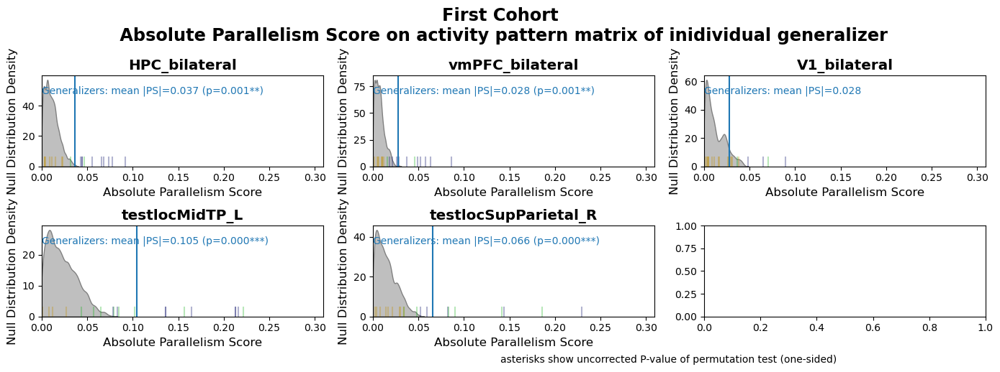

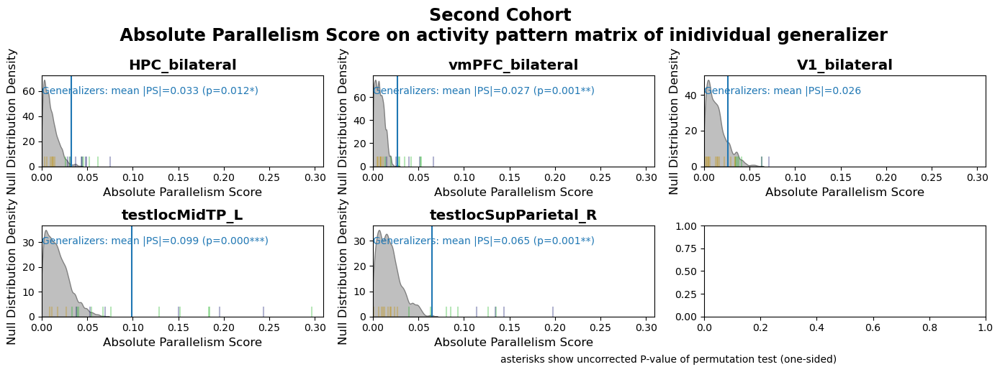

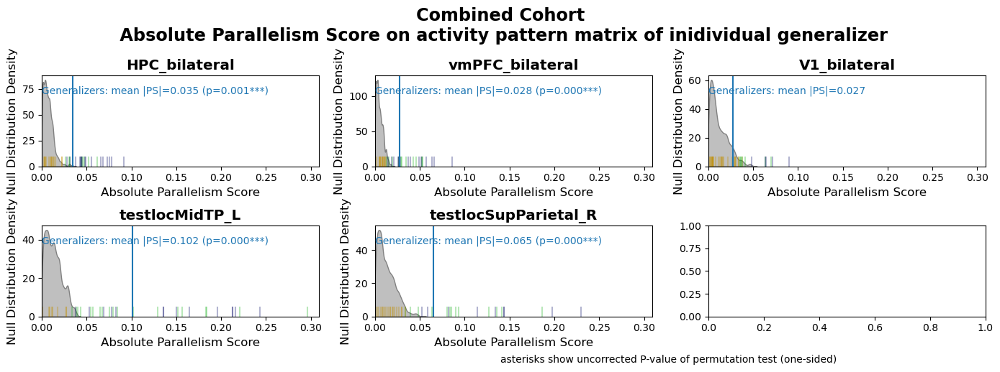

In [40]:
# Look at the absolute value of PS, we should get sth like a  half-normal distribution  for the null of abs(PS)

GnG_colors = sns.color_palette(None,2)
abspsxlim = [0,
             np.max([np.abs(sub_cs_obs[roi]).max() for roi in rois])]
        
for sname, slist in cohort_names_lists.items():   
    fig_cs,axes_cs = plt.subplots(2,3,figsize=(14,5))
    twinaxes_cs = []    
    for j,roi in enumerate(rois):
        cs_null = np.abs(np.mean(sub_cs_perms[roi],axis=0))
        cs_null_G = np.abs(np.mean([csn for csn,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers and subid in slist],axis=0))
        cs_null_NG = np.abs(np.mean([csn for csn,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers and subid in slist],axis=0))
        cs_null = cs_null_G
        cs_G = [np.abs(cs) for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers and subid in slist]
        cs_NG = [np.abs(cs) for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers and subid in slist]
        
        sns.kdeplot(data=pd.DataFrame(np.atleast_2d(cs_null).T,columns=["null"]),
                    x="null",bw_adjust=1,common_norm=True,
                    color="grey",fill=True,alpha=0.5,ax=axes_cs.flatten()[j])
        axylim = axes_cs.flatten()[j].get_ylim()
        axes_cs.flatten()[j].set_xlim(abspsxlim)

        # twinaxes_cs.append(axes_cs.flatten()[j].twinx())
        # twinaxes_cs[j].set_ylim([0,30])
        # sns.histplot(data=pd.DataFrame(np.atleast_2d(cs_G).T,columns=["Generalizers"]),
        # 			x="Generalizers",#bw_adjust=1,common_norm=True,
        # 			color=GnG_colors[0],fill=True,alpha=0.1,ax=twinaxes_cs[j])
        # twinaxes_cs[j].set_ylabel("Observed Distribution Density",fontsize="large")

        #hist_n,hist_bins,_ = axes_cs.flatten()[j].hist(cs_null,color="grey",label="null",alpha=0.5)
        for x,subid,subrc in zip(sub_cs_obs[roi],subid_list,subrep_category[roi]):
            if subid in generalizers and subid in slist:
                alpha_v = 0.3
                axes_cs.flatten()[j].axvline(abs(x),ymin=0,ymax=.1,color=psgroup_huedict[subrc],label="G",alpha=alpha_v)

        G_csmu = np.mean(cs_G)
        axes_cs.flatten()[j].axvline(x=G_csmu,color=GnG_colors[0],label="Generalizers")
        NG_csmu = np.mean(cs_NG)
        #axes_cs.flatten()[j].axvline(x=NG_csmu,color=GnG_colors[1], label="nonGeneralizers")
        Gp = (1 - np.mean([G_csmu>csn for csn in cs_null_G]))
        NGp = (1 - np.mean([NG_csmu>csn for csn in cs_null_NG]))
        if Gp<0.05:
            axes_cs.flatten()[j].text(abspsxlim[0],0.8*axylim[1],f"Generalizers: mean |PS|={'%.3f' % G_csmu} ({gen_pval_annot(Gp)})",color=GnG_colors[0])
        else:
            axes_cs.flatten()[j].text(abspsxlim[0],0.8*axylim[1],f"Generalizers: mean |PS|={'%.3f' % G_csmu}",color=GnG_colors[0])
        
        axes_cs.flatten()[j].set_title(roi,fontweight="bold",fontsize="x-large")
        axes_cs.flatten()[j].set_xlabel("Absolute Parallelism Score",fontsize="large")
        axes_cs.flatten()[j].set_ylabel("Null Distribution Density",fontsize="large")

        

    fig_cs.text(x=0.5, y=-.01, s='asterisks show uncorrected P-value of permutation test (one-sided)')
    fig_cs.suptitle(f"{sname}\n Absolute Parallelism Score on activity pattern matrix of inidividual generalizer",fontweight="bold",fontsize="xx-large")
    fig_cs.tight_layout()


### MDS of different PS group

In [252]:
len(subrep_category[rois[0]])

56

In [43]:
PSgroupaveRDMS = {"Generalizer":{},"nonGeneralizer":{}}
fname = "training_nocenter"
curr_filt = stimsubgroup_filters[fname]
for psgrouproi in rois:
    PSgroupaveRDMS["Generalizer"][psgrouproi] = {}
    PSgroupaveRDMS["nonGeneralizer"][psgrouproi] = {}
    for mdsroi in rois:
        PSgroupaveRDMS["Generalizer"][psgrouproi][mdsroi] = {1:[],-1:[],0:[]}
        PSgroupaveRDMS["nonGeneralizer"][psgrouproi][mdsroi] = {1:[],-1:[],0:[]}

        for subid,subdf,subX,subrc in zip(subid_list,sub_stimdfs[fname][mdsroi],sub_patterns[fname][mdsroi],subrep_category[psgrouproi]):
            axloc_col = "training_axlocTR" if subrc==-1 else "training_axlocTL"
            sg = "Generalizer" if subid in generalizers else "nonGeneralizer"
            reordered_subdf = subdf.sort_values(["training_axset",axloc_col])
            reorder_idx = reordered_subdf.index.to_numpy()
            reordered_subX = subX[reorder_idx,:]
            reordered_subrdm = compute_rdm(reordered_subX,"correlation")
            PSgroupaveRDMS[sg][psgrouproi][mdsroi][subrc].append(reordered_subrdm)

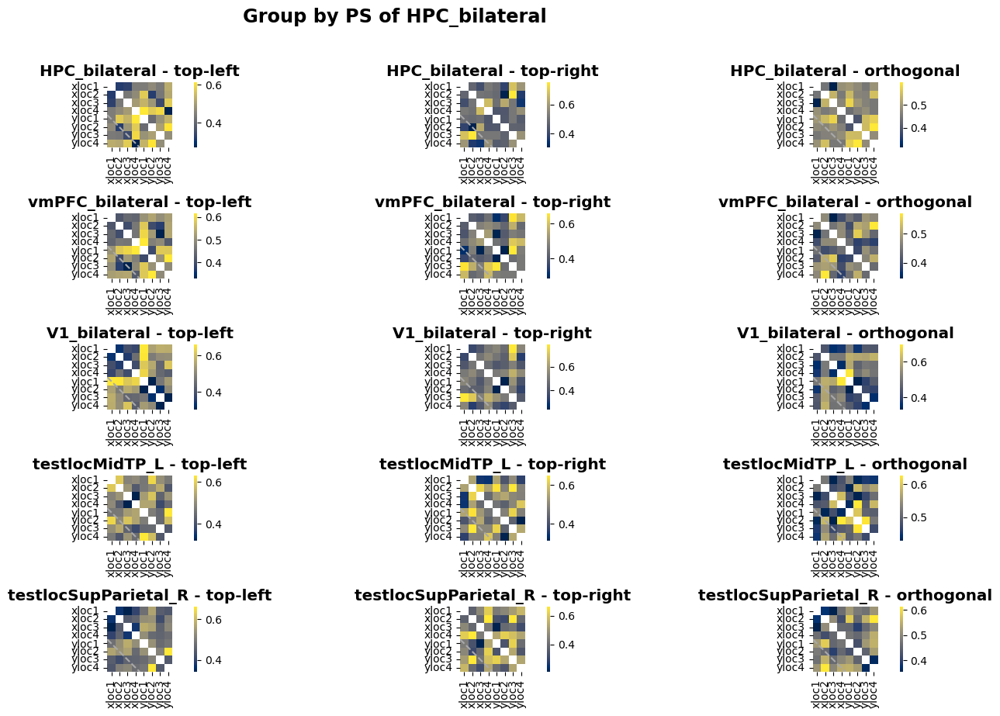

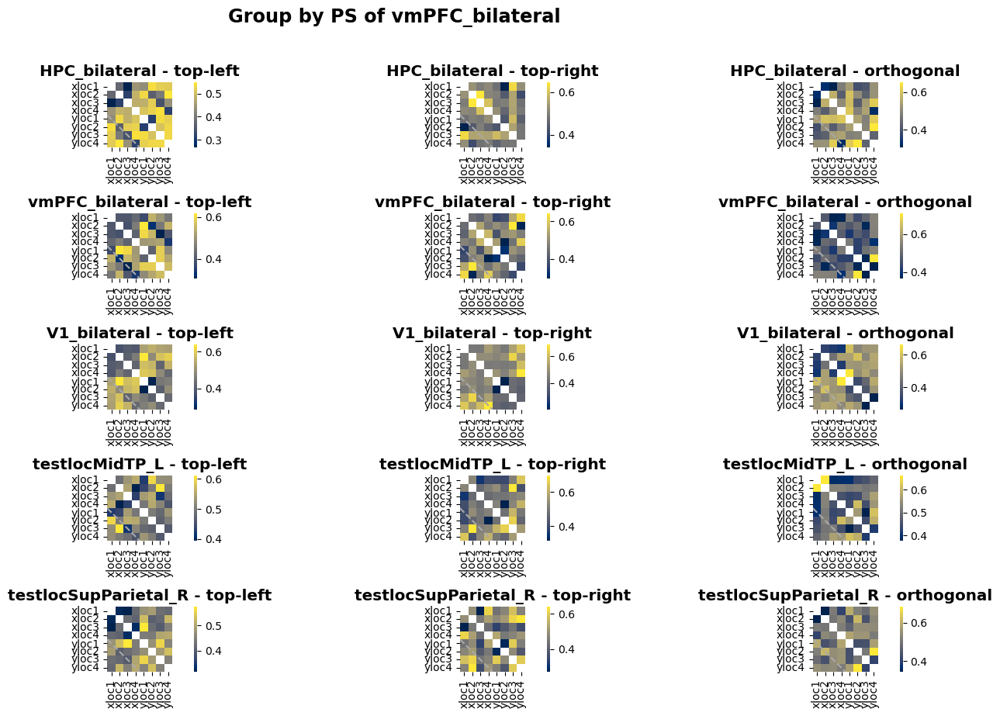

In [45]:
for psgrouproi in rois[:2]:
    figmds,axesmds = plt.subplots(5,3,figsize=(15,9))
    for j,mdsroi in enumerate(rois):
        subgroup = "Generalizer"
        for k,rcname in enumerate(PSgroupaveRDMS["Generalizer"][psgrouproi][mdsroi].keys()):        
            averdm = np.mean([minmax_scale(x) for x in PSgroupaveRDMS["Generalizer"][psgrouproi][mdsroi][rcname]],axis=0)
            outputdir = os.path.join(ROIRSAdir,"classicalMDS_PSalignedRDM",f"{fname}_PSgroupby{psgrouproi.replace('_bilateral','')}")
            prdm = deepcopy(averdm)
            np.fill_diagonal(prdm,np.nan)
            sns.heatmap(prdm,ax=axesmds[j,k],square=True,cmap="cividis")
            axesmds[j,k].set_xticks(np.arange(8)+.5,labels=[f"xloc{x}" for x in np.arange(4)+1]+[f"yloc{x}" for x in np.arange(4)+1],rotation=90)
            axesmds[j,k].set_yticks(np.arange(8)+.5,labels=[f"xloc{x}" for x in np.arange(4)+1]+[f"yloc{x}" for x in np.arange(4)+1],rotation=0)
            axesmds[j,k].axline([0,4],[4,8],color="darkgrey",linestyle="--")
            rcnamestr = {1:"top-left",-1:"top-right",0:"orthogonal"}[rcname]
            axesmds[j,k].set_title(f"{mdsroi} - {rcnamestr}",fontweight="bold",fontsize="x-large")

    figmds.suptitle(f"Group by PS of {psgrouproi}",fontweight="bold",fontsize="xx-large",y=1.02)
    figmds.tight_layout()

In [ ]:
#perform MDS of group average RDM (rescaled to 0-1 before averaging)
for psgrouproi in rois:
    for mdsroi in rois:
        for rc in PSgroupaveRDMS["Generalizer"][psgrouproi][mdsroi].keys():        
            rcname = {1:"top-left",-1:"top-right",0:"orthogonal"}[rc]
            averdm = np.mean([minmax_scale(x) for x in PSgroupaveRDMS["Generalizer"][psgrouproi][mdsroi][rc]],axis=0)
            outputdir = os.path.join(ROIRSAdir,"classicalMDS",f"{fname}_PSgroupby{psgrouproi.replace('_bilateral','')}")
            checkdir(outputdir)
            
            mcol = "training_axlocTL"
            fig, axes, X_df = plot_rdm_mds(averdm,ncompo=3,stimdf=navi_stimdf[curr_filt].copy().reset_index(drop=True),
                                        gcol="training_axsetstr",
                                        huecol="training_axsetstr",stylecol=mcol,stim_namer=lambda h,s: '%s%d' % (h,s),
                                        plot_3d=False)
            fig.suptitle(f"{mdsroi.replace('_bilateral','')} {subgroup} {rcname}({rc})")
            fig.savefig(os.path.join(outputdir,f"{mdsroi}_Generalizer_{rcname}.jpg"))
            #for loc1,loc2,tl in X_df[['MDS ax1', 'MDS ax2', "stim_name"]].to_numpy():
            #    axes[1].text(loc1,loc2, tl,size='small')
            plt.close()
            cpal = dict(zip(np.unique(X_df["training_axsetstr"]), 
                            sns.color_palette(None, np.unique(X_df["training_axsetstr"]).size).as_hex()))
            pxfig = px.line_3d(X_df,x="MDS ax1",y="MDS ax2",z="MDS ax3",
                            text="stim_name",
                            #symbol= "training_axloc",
                            line_group="training_axsetstr",
                            color_discrete_sequence=["black"],
                            line_dash_sequence=["dash"],
                            )
            pxfig.update_traces(
                line=dict(
                    width=3
                )
            )
            for k,(ta,tadf) in enumerate(X_df.groupby("training_axsetstr")):
                trace_arr = tadf[["MDS ax1","MDS ax2","MDS ax3"]].to_numpy()
                pxfig.add_trace(
                    go.Scatter3d(
                        x=trace_arr[:,0], y=trace_arr[:,1],z=trace_arr[:,2], 
                        mode='markers',
                        marker=dict(
                            color=cpal[ta]#[cpal[ta]] * trace_arr.shape[0]
                        ),
                        name=f"Training stimuli on {ta} axis",

                    )
                )

            axlocs = np.unique(X_df[mcol])
            MDSX = X_df[["MDS ax1","MDS ax2","MDS ax3"]].to_numpy()
            assert all([np.sum(X_df.stim_x == j)==1 for j in axlocs])
            assert all([np.sum(X_df.stim_y == j)==1 for j in axlocs])
            xstims = np.array([MDSX[X_df.stim_x == j,:][0] for j in axlocs])
            ystims = np.array([MDSX[X_df.stim_y == j,:][0] for j in axlocs])

            pxfig.update_layout(#
                title_text=f"{mdsroi.replace('_bilateral','')} {subgroup} {rcname}({rc})",
                title_subtitle_text='Parallelism Score = %.3f' % (np.nanmean(parallel_axes_cosine_sim(xstims,ystims))),
                title_x=0.3,title_y=0.9,
                title_font_weight="bold",title_font_size=20,title_font_color=psgroup_huedict[rc],
                title_subtitle_font_size=20,title_subtitle_font_color=psgroup_huedict[rc])
            pxfig.write_html(os.path.join(outputdir,f"{mdsroi}_Generalizer_{rcname}.html"))

### MDS of aligned RDM averaged across parallel and orthogonal

In [47]:
PSalignedgroupaveRDMS = {"Generalizer":{},"nonGeneralizer":{}}
fname = "training_nocenter"
curr_filt = stimsubgroup_filters[fname]
for psgrouproi in rois:
    PSalignedgroupaveRDMS["Generalizer"][psgrouproi] = {}
    PSalignedgroupaveRDMS["nonGeneralizer"][psgrouproi] = {}
    for mdsroi in rois:
        PSalignedgroupaveRDMS["Generalizer"][psgrouproi][mdsroi] = {"parallel":[],"orthogonal":[],"all":[]}
        PSalignedgroupaveRDMS["nonGeneralizer"][psgrouproi][mdsroi] = {"parallel":[],"orthogonal":[],"all":[]}

        for subid,subdf,subX,subrc in zip(subid_list,sub_stimdfs[fname][mdsroi],sub_patterns[fname][mdsroi],subrep_category[psgrouproi]):
            axloc_col = "training_axlocTR" if subrc==-1 else "training_axlocTL"
            sg = "Generalizer" if subid in generalizers else "nonGeneralizer"
            reordered_subdf = subdf.sort_values(["training_axset",axloc_col])
            reorder_idx = reordered_subdf.index.to_numpy()
            reordered_subX = subX[reorder_idx,:]
            reordered_subrdm = compute_rdm(reordered_subX,"correlation")
            
            rcname = "parallel" if abs(subrc) == 1 else "orthogonal"
            PSalignedgroupaveRDMS[sg][psgrouproi][mdsroi][rcname].append(reordered_subrdm)
            PSalignedgroupaveRDMS[sg][psgrouproi][mdsroi]["all"].append(reordered_subrdm)
            

In [ ]:
#perform MDS of group average RDM (rescaled to 0-1 before averaging)
MDS_res = {}
for psgrouproi in rois:
    MDS_res[psgrouproi] = {}
    for mdsroi in rois:
        MDS_res[psgrouproi][mdsroi] = {"Generalizer":{},"nonGeneralizer":{}}
        subgroup = "Generalizer"
        for rcname in PSalignedgroupaveRDMS["Generalizer"][psgrouproi][mdsroi].keys():        
            averdm = np.mean([minmax_scale(x) for x in PSalignedgroupaveRDMS["Generalizer"][psgrouproi][mdsroi][rcname]],axis=0)
            outputdir = os.path.join(ROIRSAdir,"classicalMDS_PSalignedRDM",f"{fname}_PSgroupby{psgrouproi.replace('_bilateral','')}")
            checkdir(outputdir)
            
            mcol = "training_axlocTL"
            fig, axes, X_df = plot_rdm_mds(averdm,ncompo=3,stimdf=reordered_subdf.copy().reset_index(drop=True),
                                        gcol="training_axsetstr",
                                        huecol="training_axsetstr",stylecol=mcol,stim_namer=lambda h,s: '%s%d' % (h,s),
                                        plot_3d=False)
            fig.suptitle(f"{mdsroi.replace('_bilateral','')} {subgroup} {rcname}")
            fig.savefig(os.path.join(outputdir,f"{mdsroi}_Generalizer_{rcname}.jpg"))
            #for loc1,loc2,tl in X_df[['MDS ax1', 'MDS ax2', "stim_name"]].to_numpy():
            #    axes[1].text(loc1,loc2, tl,size='small')
            plt.close()

            MDS_res[psgrouproi][mdsroi][subgroup][rcname] = X_df
            # cpal = dict(zip(np.unique(X_df["training_axsetstr"]), 
            #                 sns.color_palette(None, np.unique(X_df["training_axsetstr"]).size).as_hex()))
            # pxfig = px.line_3d(X_df,x="MDS ax1",y="MDS ax2",z="MDS ax3",
            #                 text="stim_name",
            #                 #symbol= "training_axloc",
            #                 line_group="training_axsetstr",
            #                 color_discrete_sequence=["black"],
            #                 line_dash_sequence=["dash"],
            #                 )
            # pxfig.update_traces(
            #     line=dict(
            #         width=3
            #     )
            # )
            # for k,(ta,tadf) in enumerate(X_df.groupby("training_axsetstr")):
            #     trace_arr = tadf[["MDS ax1","MDS ax2","MDS ax3"]].to_numpy()
            #     pxfig.add_trace(
            #         go.Scatter3d(
            #             x=trace_arr[:,0], y=trace_arr[:,1],z=trace_arr[:,2], 
            #             mode='markers',
            #             marker=dict(
            #                 color=cpal[ta]#[cpal[ta]] * trace_arr.shape[0]
            #             ),
            #             name=f"Training stimuli on {ta} axis",

            #         )
            #     )

            # axlocs = np.unique(X_df[mcol])
            # MDSX = X_df[["MDS ax1","MDS ax2","MDS ax3"]].to_numpy()
            # assert all([np.sum(X_df.stim_x == j)==1 for j in axlocs])
            # assert all([np.sum(X_df.stim_y == j)==1 for j in axlocs])
            # xstims = np.array([MDSX[X_df.stim_x == j,:][0] for j in axlocs])
            # ystims = np.array([MDSX[X_df.stim_y == j,:][0] for j in axlocs])

            # pxfig.update_layout(#
            #     title_text=f"{mdsroi.replace('_bilateral','')} {subgroup} {rcname}",
            #     subtitle_text='Parallelism Score = %.3f' % (np.nanmean(parallel_axes_cosine_sim(xstims,ystims))),
            #     title_x=0.3,title_y=0.9,
            #     title_font_weight="bold",title_font_size=20,#title_font_color=psgroup_huedict[rc],title_subtitle_font_color=psgroup_huedict[rc]
            #     title_subtitle_font_size=20)
            # pxfig.write_html(os.path.join(outputdir,f"{mdsroi}_Generalizer_{rcname}.html"))
dump(MDS_res,os.path.join(ROIRSAdir,"classicalMDS_PSalignedRDM","MDS_results.pkl"))

In [12]:
MDS_res = load(os.path.join(ROIRSAdir,"classicalMDS_PSalignedRDM","MDS_results.pkl"))

In [ ]:
for psgrouproi in rois[:2]:
    for mdsroi in rois:
        subgroup = "Generalizer"
        for rcname in PSalignedgroupaveRDMS["Generalizer"][psgrouproi][mdsroi].keys():        
            averdm = np.mean([minmax_scale(x) for x in PSalignedgroupaveRDMS["Generalizer"][psgrouproi][mdsroi][rcname]],axis=0)
            outputdir = os.path.join(ROIRSAdir,"classicalMDS_PSalignedRDM",f"{fname}_PSgroupby{psgrouproi.replace('_bilateral','')}")
            checkdir(outputdir)
            
            mcol = "training_axlocTL"
            X_df = MDS_res[psgrouproi][mdsroi][subgroup][rcname]
            cpal = dict(zip(np.unique(X_df["training_axsetstr"]), 
                            sns.color_palette(None, np.unique(X_df["training_axsetstr"]).size).as_hex()))
            pxfig = px.line_3d(X_df,x="MDS ax1",y="MDS ax2",z="MDS ax3",
                            text="stim_name",
                            #symbol= "training_axloc",
                            line_group="training_axsetstr",
                            color_discrete_sequence=["black"],
                            line_dash_sequence=["dash"],
                            )
            pxfig.update_traces(
                line=dict(
                    width=3
                )
            )
            for k,(ta,tadf) in enumerate(X_df.groupby("training_axsetstr")):
                trace_arr = tadf[["MDS ax1","MDS ax2","MDS ax3"]].to_numpy()
                pxfig.add_trace(
                    go.Scatter3d(
                        x=trace_arr[:,0], y=trace_arr[:,1],z=trace_arr[:,2], 
                        mode='markers',
                        marker=dict(
                            color=cpal[ta]#[cpal[ta]] * trace_arr.shape[0]
                        ),
                        name=f"Training stimuli on {ta} axis",

                    )
                )

            axlocs = np.unique(X_df[mcol])
            MDSX = X_df[["MDS ax1","MDS ax2","MDS ax3"]].to_numpy()
            assert all([np.sum(X_df.stim_x == j)==1 for j in axlocs])
            assert all([np.sum(X_df.stim_y == j)==1 for j in axlocs])
            xstims = np.array([MDSX[X_df.stim_x == j,:][0] for j in axlocs])
            ystims = np.array([MDSX[X_df.stim_y == j,:][0] for j in axlocs])

            pxfig.update_layout(#
                title_text=f"{mdsroi.replace('_bilateral','')} {subgroup} {rcname}",
                title_subtitle_text='Parallelism Score = %.3f' % (np.nanmean(parallel_axes_cosine_sim(xstims,ystims))),
                title_x=0.3,title_y=0.9,
                title_font_weight="bold",title_font_size=20,#title_font_color=psgroup_huedict[rc],title_subtitle_font_color=psgroup_huedict[rc]
                title_subtitle_font_size=20)
            pxfig.write_html(os.path.join(outputdir,f"{mdsroi}_Generalizer_{rcname}.html"))

<Axes: >

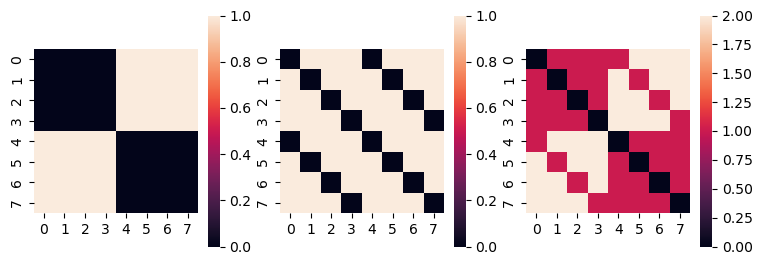

In [45]:
plt.subplots(1,3,figsize=(9,3))
plt.subplot(1,3,1)
axlocrdm = compute_rdm_identity(X_df["training_axlocTL"])
axrdm = compute_rdm_identity(X_df["training_axset"])
sns.heatmap(axrdm,square=True)
plt.subplot(1,3,2)
sns.heatmap(axlocrdm,square=True)
plt.subplot(1,3,3)
sns.heatmap(axlocrdm+axrdm,square=True) # np.multiply(axlocrdm,axrdm)

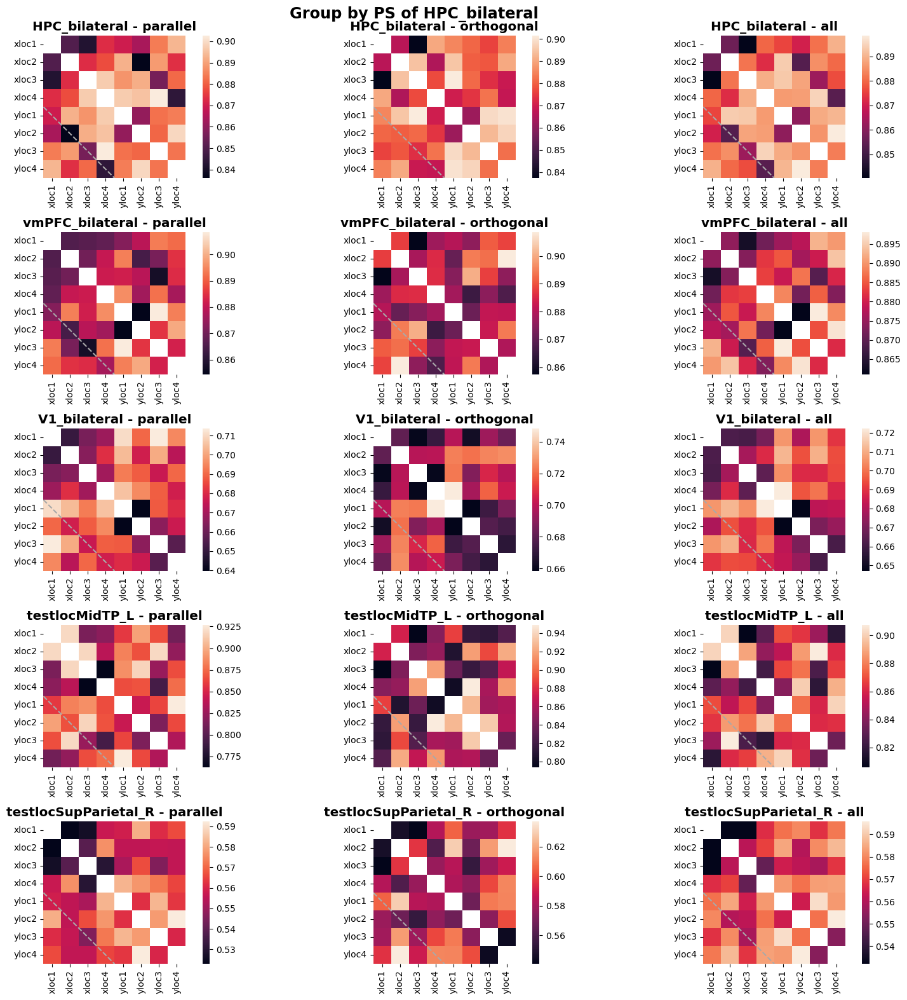

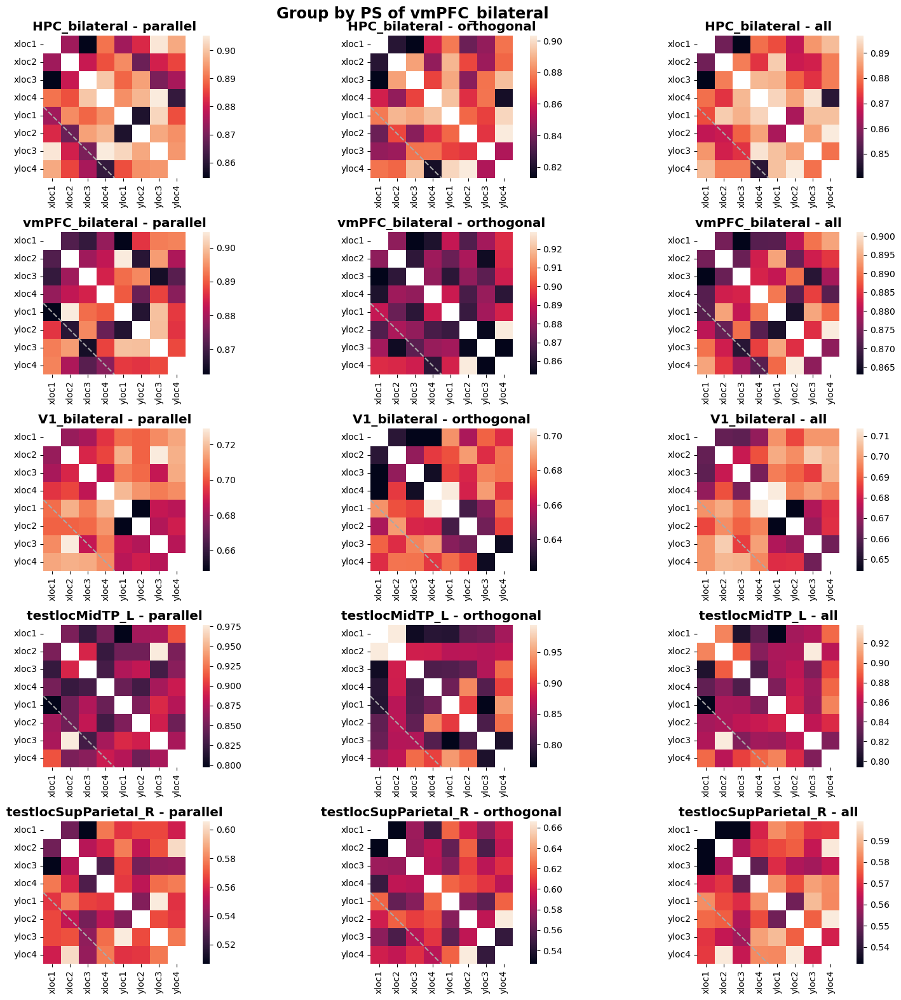

In [50]:
nonmetricMDS_res = {}
for psgrouproi in rois[:2]:
    figmds,axesmds = plt.subplots(5,3,figsize=(16,16))
    nonmetricMDS_res[psgrouproi] = {}
    for j,mdsroi in enumerate(rois):
        nonmetricMDS_res[psgrouproi][mdsroi] = {"Generalizer":{},"nonGeneralizer":{}}
        subgroup = "Generalizer"
        for k,rcname in enumerate(PSalignedgroupaveRDMS["Generalizer"][psgrouproi][mdsroi].keys()):        
            averdm = np.mean([x for x in PSalignedgroupaveRDMS["Generalizer"][psgrouproi][mdsroi][rcname]],axis=0)
            outputdir = os.path.join(ROIRSAdir,"classicalMDS_PSalignedRDM",f"{fname}_PSgroupby{psgrouproi.replace('_bilateral','')}")
            prdm = deepcopy(averdm)
            np.fill_diagonal(prdm,np.nan)
            sns.heatmap(prdm,ax=axesmds[j,k],square=True)
            axesmds[j,k].set_xticks(np.arange(8)+.5,labels=[f"xloc{x}" for x in np.arange(4)+1]+[f"yloc{x}" for x in np.arange(4)+1],rotation=90)
            axesmds[j,k].set_yticks(np.arange(8)+.5,labels=[f"xloc{x}" for x in np.arange(4)+1]+[f"yloc{x}" for x in np.arange(4)+1],rotation=0)
            axesmds[j,k].axline([0,4],[4,8],color="darkgrey",linestyle="--")
            axesmds[j,k].set_title(f"{mdsroi} - {rcname}",fontweight="bold",fontsize="x-large")

    figmds.suptitle(f"Group by PS of {psgrouproi}",fontweight="bold",fontsize="xx-large")
    figmds.tight_layout()

## re-run RSA analysis with k-fold validation

### with cross validation

In [11]:
savedop = load(os.path.join(ROIRSAdir,"ROI_PTARSA_2v2raw.pkl"))
ROIRSA_PTA_cvres = savedop["RSA"]
ROIPS_PTA_cvres  = savedop["PS"]
ROIRSA_PTA_cvres_df = pd.concat(ROIRSA_PTA_cvres,axis=0).reset_index(drop=True)
ROIRSA_PTA_cvres_df["region"] = pd.Categorical(ROIRSA_PTA_cvres_df.RSAroi,categories=rois,ordered=True)


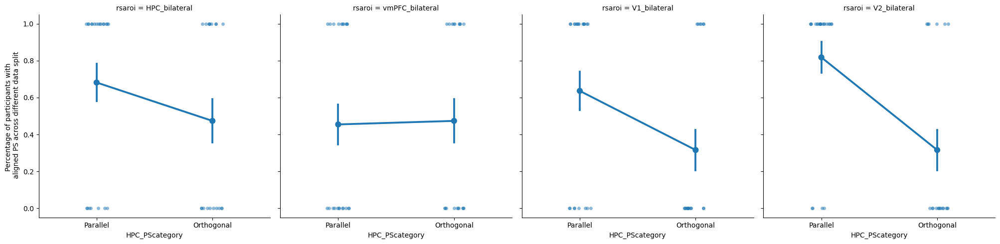

In [13]:
PScvalignquality = {}
for pgroi in rois:
    PScvalignquality[pgroi] = {}
    for rsaroi in rois:
        PScvalignquality[pgroi][rsaroi] = []
        for cvPS,subid in zip(ROIPS_PTA_cvres[pgroi][rsaroi],subid_list):
            PScvalignquality[pgroi][rsaroi].append(np.mean(np.sign(cvPS['fit']) == np.sign(cvPS['eval'])))

PScvalignquality_df = pd.concat(sum([[pd.DataFrame(v,columns=["paligned"]).assign(psroi = pgroi,rsaroi = k,subid=subid_list,HPCcat=subrep_category["HPC_bilateral"]) for k,v in PScvalignquality[pgroi].items()] for pgroi in rois],[]),
             axis=0).reset_index(drop=True)
PScvalignquality_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in PScvalignquality_df.subid]
PScvalignquality_df["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in PScvalignquality_df.subid]
PScvalignquality_df["HPC_PScategory"] = ["Parallel" if x==1 else "Orthogonal" for x in np.abs(PScvalignquality_df["HPCcat"])] # the PS group from the activity pattern
gs = sns.catplot(PScvalignquality_df[(PScvalignquality_df.subgroup=="Generalizer")&(PScvalignquality_df.psroi==PScvalignquality_df.rsaroi)].copy(),
            x="HPC_PScategory",
            y="paligned",
            #row="psroi",
            col="rsaroi",
            kind="strip",alpha=0.5)
gs.map_dataframe(sns.pointplot,x="HPC_PScategory",y="paligned",errorbar="se")
gs.set_ylabels("Percentage of participants with \n aligned PS across different data split")




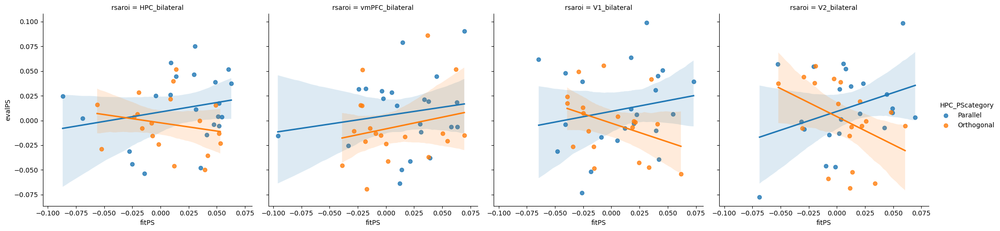

In [32]:
PScvalignquality = {}
for pgroi in rois:
    PScvalignquality[pgroi] = {}
    for rsaroi in rois:
        PScvalignquality[pgroi][rsaroi] = []
        for cvPS,subid in zip(ROIPS_PTA_cvres[pgroi][rsaroi],subid_list):
            PScvalignquality[pgroi][rsaroi].append([np.mean(np.sign(cvPS['fit']) == np.sign(cvPS['eval'])),cvPS['fit'][0],cvPS['fit'][1]])

PScvalignquality_df = pd.concat(sum([[pd.DataFrame(v,columns=["paligned",'fitPS','evalPS']).assign(psroi = pgroi,rsaroi = k,subid=subid_list,HPCcat=subrep_category["HPC_bilateral"]) for k,v in PScvalignquality[pgroi].items()] for pgroi in rois],[]),
             axis=0).reset_index(drop=True)
PScvalignquality_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in PScvalignquality_df.subid]
PScvalignquality_df["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in PScvalignquality_df.subid]
PScvalignquality_df["HPC_PScategory"] = ["Parallel" if x==1 else "Orthogonal" for x in np.abs(PScvalignquality_df["HPCcat"])] # the PS group from the activity pattern
gs = sns.lmplot(PScvalignquality_df[(PScvalignquality_df.subgroup=="Generalizer")&(PScvalignquality_df.psroi==PScvalignquality_df.rsaroi)].copy(),
            x="fitPS",
            y="evalPS",
            hue="HPC_PScategory",
            col="rsaroi")
#gs.map_dataframe(sns.pointplot,x="HPC_PScategory",y="paligned",errorbar="se")
#gs.set_ylabels("Percentage of participants with \n aligned PS across different data split")

In [ ]:
gs = sns.relplot(PScvalignquality_df[(PScvalignquality_df.subgroup=="Generalizer")&(PScvalignquality_df.psroi==PScvalignquality_df.rsaroi)].copy(),
            x="odd",
            y="even",
            #row="psroi",
            col="rsaroi",
            kind="strip",alpha=0.5)
gs.map_dataframe(sns.pointplot,x="HPC_PScategory",y="paligned",errorbar="se")
gs.set_ylabels("Percentage of participants with \n aligned PS across different data split")

In [23]:
ROIRSA_PTA_cvres_meandf = ROIRSA_PTA_cvres_df.groupby(['subid', 'subgroup', 'cohort', 'PSGROUProi', 'RSAroi','analysis','modelrdm'])[['coefficient','adjR2', 'R2']].mean().reset_index()
ROIRSA_PTA_cvres_meandf["region"] = pd.Categorical(ROIRSA_PTA_cvres_meandf["RSAroi"].to_numpy(),categories=rois,ordered=True)
ROIRSA_PTA_cvres_meandf = ROIRSA_PTA_cvres_meandf.merge(subrep_category_df,on=['subid', 'cohort', 'subgroup'],how="inner")
ROIRSA_PTA_cvres_meandf["HPCrepcat"] = pd.Categorical(
    ["parallel" if abs(scs)==1 else "orthogonal" for scs in ROIRSA_PTA_cvres_meandf.HPC_bilateral],
    categories=["parallel","orthogonal"],
    ordered=True
)

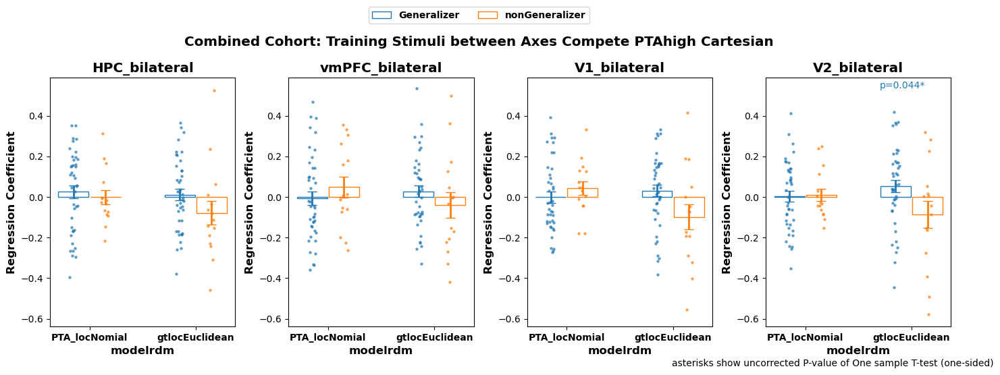

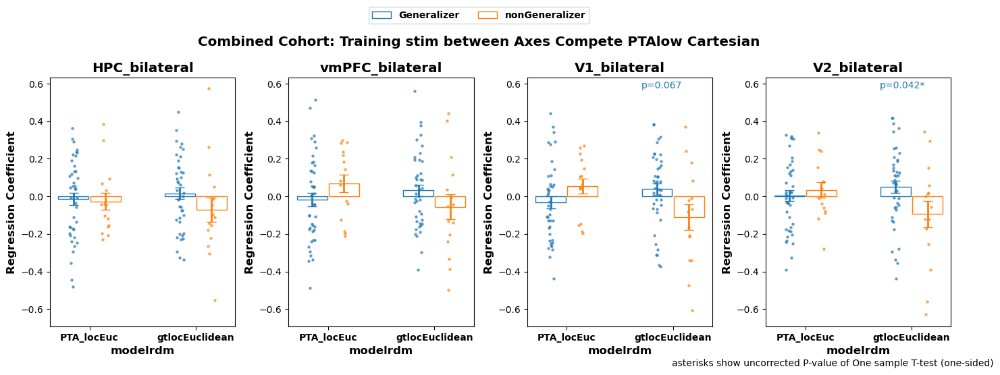

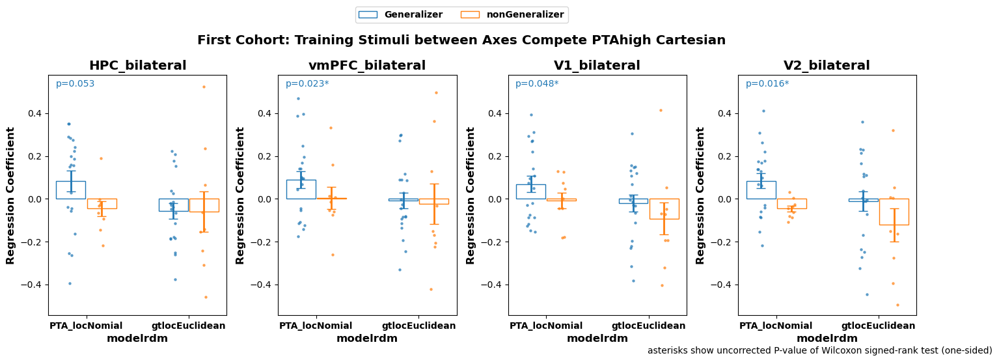

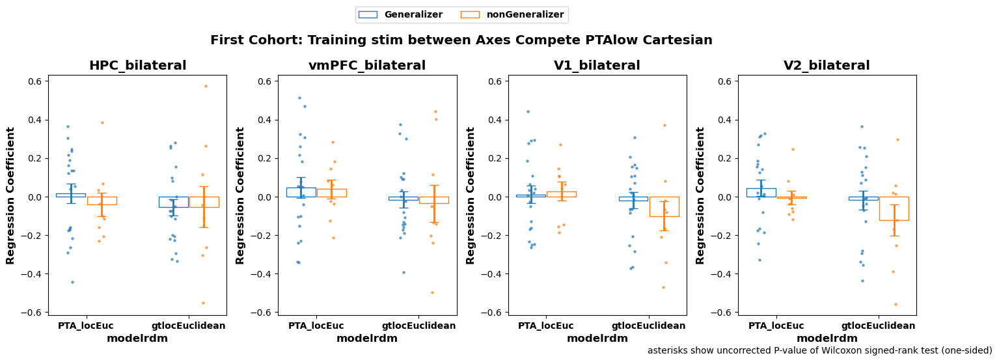

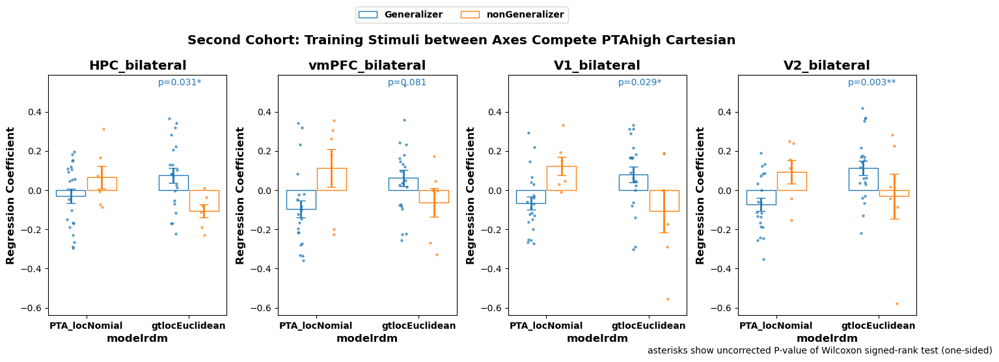

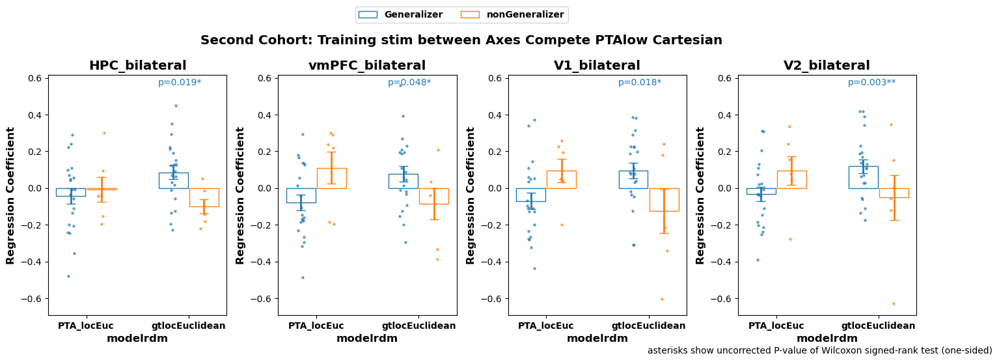

In [20]:
# test if coefficients are significantly above zero subgroup HPCrepcat
xvar, gvar, yvar, yvartest = "modelrdm",  "subgroup", "coefficient", "coefficient"


plt_ana = dict(zip([#'train stim Compete PTAhigh Cartesian',
                    'train stim betweenxy Compete PTAhigh Cartesian',
                    'train stim betweenxy Compete PTAlow Cartesian'],
                   
                   [#"Training Stimuli Compete PTAhigh Cartesian",
                   "Training Stimuli between Axes Compete PTAhigh Cartesian" ,
                    "Training stim between Axes Compete PTAlow Cartesian"
                   ]))
aprs    = dict(zip([#'train stim Compete PTAhigh Cartesian',
                    'train stim betweenxy Compete PTAhigh Cartesian',
                    'train stim betweenxy Compete PTAlow Cartesian'],
                   [#1.2,
                    1.4,1.4]))

#plot_subset_df = ROIRSA_PTA_cvres_df[(ROIRSA_PTA_cvres_df.PSGROUProi==ROIRSA_PTA_cvres_df.RSAroi)&(ROIRSA_PTA_cvres_df.heldoutrun==1)].copy().reset_index(drop=True)
plot_subset_df = ROIRSA_PTA_cvres_meandf[(ROIRSA_PTA_cvres_meandf.PSGROUProi==ROIRSA_PTA_cvres_meandf.RSAroi)].copy().reset_index(drop=True)
for cname,clist in zip(["Combined Cohort","First Cohort","Second Cohort"],[subid_list,cohort1ids,cohort2ids]):
    for a, atitle in plt_ana.items():
        curr_pdf = plot_subset_df[(plot_subset_df.analysis==a)&(plot_subset_df.subid.isin(clist))].copy().reset_index(drop=True)
        #curr_pdf = curr_pdf[curr_pdf.subid.isin(generalizers)].copy().reset_index(drop=True)
        curr_pdf.modelrdm = pd.Categorical(curr_pdf.modelrdm)
        nonparstat = lambda yt: 1. if np.size(yt)<20 else scipy.stats.wilcoxon(yt,alternative="greater").pvalue
        parastat = lambda yt: 1. if np.size(yt)<20 else scipy.stats.ttest_1samp(yt,0,alternative="greater").pvalue
        stat_name = 'Wilcoxon signed-rank test' if cname != "Combined Cohort" else 'One sample T-test'
        stat_func = parastat if cname != "Combined Cohort" else nonparstat
        fig,axes = grouped_barscatter_withstats(curr_pdf,
                                    facet_vars = "region", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                    prows=1,pcols=4,hrow=5,wcol=5/aprs[a],
                                    statfunc= stat_func)
        for ifacet, _ in enumerate(axes.flatten()):
            axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
            axes.flatten()[ifacet].set_xlabel("modelrdm",fontweight="bold",fontsize="large")
        
            
        hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
        fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        fig.suptitle(f"{cname}: {atitle}",fontweight="bold",fontsize="x-large")
        fig.text(x=0.7, y=0, s=f'asterisks show uncorrected P-value of {stat_name} (one-sided)')
        fig.tight_layout()


In [238]:
41-18

23

Text(0.5, 1.1, 'Training stimuli between Axes')

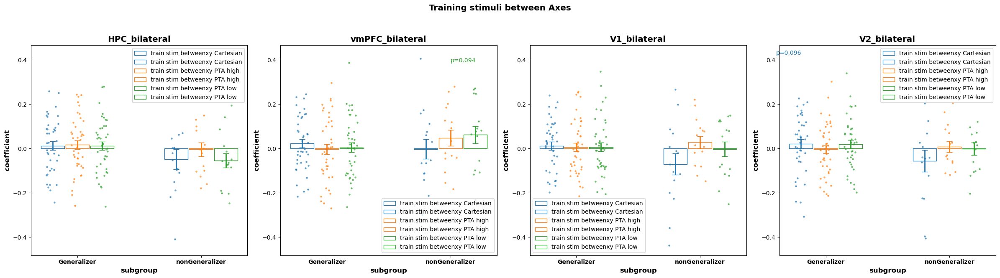

In [101]:
# compare R2
plot_subset_df = ROIRSA_PTA_cvres_meandf[(ROIRSA_PTA_cvres_meandf.PSGROUProi==ROIRSA_PTA_cvres_meandf.RSAroi)].copy().reset_index(drop=True)
R2_df = pd.concat([gdf.head(1).drop(columns=['modelrdm']) for gname,gdf in plot_subset_df.copy().groupby(["subgroup","subid","analysis","region"])],
                       axis=0).reset_index(drop=True)
R2_df["region"] = pd.Categorical(R2_df.region,
                                categories = rois,#['EC', 'hippocampus', 'mPFC', 'SPC', 'V1', 'V2'],
                                ordered=True)

comparedregressions = [ 'train stim betweenxy Cartesian','train stim betweenxy PTA high','train stim betweenxy PTA low']
#comparedregressions = ["train stim withinxy - Euc","train stim withinxy - VisualField"]
#comparedregressions = ['test stim Cartesian','test stim feature']
compare_r2_df = R2_df[(R2_df.analysis.isin(comparedregressions)) & (R2_df.subid.isin(subid_list))].copy().reset_index(drop=True)

#compare_r2_df.analysis = pd.Categorical(compare_r2_df.analysis.str.replace('train stim betweenxy ',' '))

compare_r2_df.subgroup = pd.Categorical(compare_r2_df.subgroup)



xvar, gvar, yvar = "subgroup",  "analysis", "coefficient" #,'coefficient'
fig,axes = grouped_barscatter_withstats(compare_r2_df,
                        facet_vars = "region", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvar,#
                        prows=1,pcols=4,hrow=6,wcol=6,
                        statfunc=lambda yt: 1. if np.size(yt)<10 else scipy.stats.wilcoxon(yt,alternative="greater").pvalue )#,alternative='greater').pvalue)
                        #if np.size(yt)<25 else scipy.stats.ttest_1samp(yt,0,alternative="greater").pvalue
[ax.legend() for ax in axes.flatten()]
fig.suptitle("Training stimuli between Axes",fontweight="bold",fontsize="x-large",y=1.1)


## Relationship between different representation classification methods

### correspondence between PS classification and Learning Asymmetry

It seems that classification for top-left using maps quite well to representation, 
but it didn't work well for top-right group 

Text(0.5, 1.0, 'nongeneralizer')

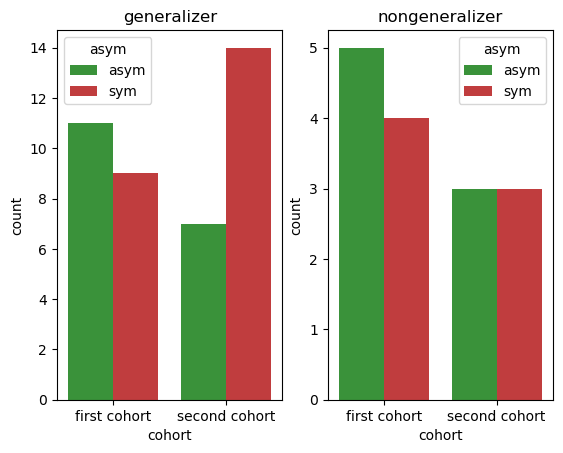

In [59]:
plt.subplot(1,2,1)
sns.countplot(subrep_category_df[subrep_category_df.subid.isin(generalizers)],x="cohort",hue="asym",palette=sns.color_palette(None,4)[2:])
plt.title("generalizer")
plt.subplot(1,2,2)
sns.countplot(subrep_category_df[subrep_category_df.subid.isin(nongeneralizers)],x="cohort",hue="asym",palette=sns.color_palette(None,4)[2:])
plt.title("nongeneralizer")


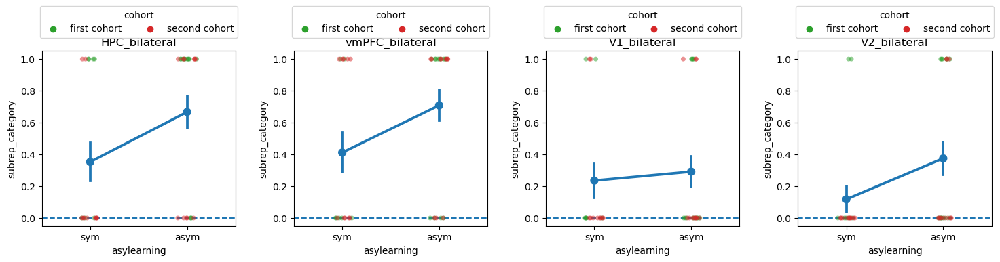

In [103]:
fig,axes = plt.subplots(1,4,figsize=(15,4))
plt_df = subrep_category_df[subrep_category_df.subgroup=="Generalizer"].copy()
for j in range(4): # ta*np.abs([x,y]).mean()
    plt_df[f"abs{rois[j]}"] = np.abs(plt_df[rois[j]])
    
    sns.pointplot(plt_df,
                    y=f"abs{rois[j]}",x='asym',
                    #hue="cohort",palette = dict(zip(["first cohort","second cohort"],sns.color_palette(None,4)[2:])),
                    errorbar="se",
                    ax=axes[j])
    sns.stripplot(plt_df,
                    y=f"abs{rois[j]}",x='asym',alpha=0.5,
                    hue="cohort",palette = dict(zip(["first cohort","second cohort"],sns.color_palette(None,4)[2:])),
                    ax=axes[j])                
    axes[j].set_xlabel("asylearning")
    axes[j].set_ylabel('subrep_category')
    axes[j].set_title(rois[j])
    axes[j].axhline(0,linestyle="--")
    sns.move_legend(axes[j],loc="lower center",bbox_to_anchor=(0.5,1.05),ncol=3)
    #axes[j].axvline(0,linestyle="--")
    #sns.kdeplot(plt_df,#bins=10,
    #                x=rois[j],
    #               hue="cohort",palette = dict(zip(["first cohort","second cohort"],sns.color_palette(None,4)[2:])),
    #               ax=axes[j,k])
    #axes[j,k].axvline(0)               
    #axes[j,k].set_title(rois[j])  
    #axes[j,k].set_xlabel("PS")  
    #axes[j,k].set_ylabel("count")
        
fig.tight_layout()



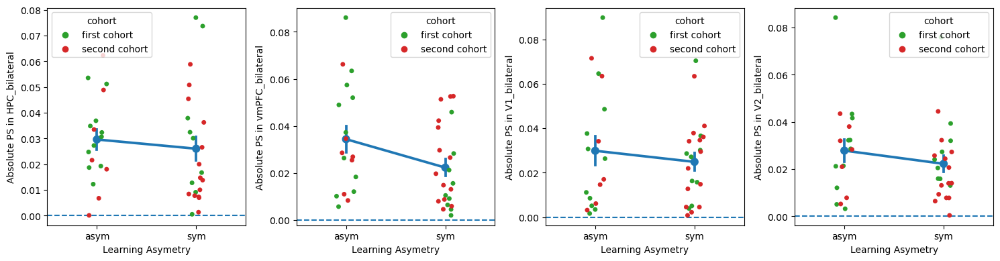

In [66]:
fig,axes = plt.subplots(1,4,figsize=(15,4))
plt_df = ps_roi_df[ps_roi_df.subgroup=="Generalizer"].copy()
for roi in rois:
    plt_df[f"abs_{roi}"] = np.abs(plt_df[roi])
for j in range(4):

    sns.pointplot(plt_df,
                    x="asym",y=f"abs_{rois[j]}",
                    #hue="cohort",palette = dict(zip(["first cohort","second cohort"],sns.color_palette(None,4)[2:])),
                    errorbar="se",
                    ax=axes[j])
    sns.stripplot(plt_df,
                    x="asym",y=f"abs_{rois[j]}",
                    hue="cohort",palette = dict(zip(["first cohort","second cohort"],sns.color_palette(None,4)[2:])),
                    ax=axes[j])                
    axes[j].set_xlabel("Learning Asymetry")
    axes[j].set_ylabel(f"Absolute PS in {rois[j].replace('_bliateral','')}")
    axes[j].axhline(0,linestyle="--")
    #axes[j].axvline(0,linestyle="--")
    #sns.kdeplot(plt_df,#bins=10,
    #                x=rois[j],
    #               hue="cohort",palette = dict(zip(["first cohort","second cohort"],sns.color_palette(None,4)[2:])),
    #               ax=axes[j,k])
    #axes[j,k].axvline(0)               
    #axes[j,k].set_title(rois[j])  
    #axes[j,k].set_xlabel("PS")  
    #axes[j,k].set_ylabel("count")
        
fig.tight_layout()


In [67]:
print(plt_df[(plt_df.asym=="asym")].copy().shape)
print(scipy.stats.ttest_1samp(plt_df[plt_df.asym=="asym"].copy()["abs_HPC_bilateral"].to_numpy(),0,alternative="two-sided"))
print(plt_df[plt_df.asym=="sym"].copy().shape)
print(scipy.stats.ttest_1samp(plt_df[plt_df.asym=="sym"].copy()["abs_HPC_bilateral"].to_numpy(),0))


(18, 17)
TtestResult(statistic=7.535114054379793, pvalue=8.166337352370509e-07, df=17)
(23, 17)
TtestResult(statistic=5.593023249478476, pvalue=1.269818305710809e-05, df=22)


In [62]:
for roi in rois:
    comprres = scipy.stats.mannwhitneyu(plt_df[plt_df.asym=="asym"].copy()[f"abs_{roi}"].to_numpy(),
                      plt_df[plt_df.asym=="sym"].copy()[f"abs_{roi}"].to_numpy(),
                      alternative="two-sided")
    print(f"{roi}: {comprres}")

HPC_bilateral: MannwhitneyuResult(statistic=245.0, pvalue=0.32455628613721055)
vmPFC_bilateral: MannwhitneyuResult(statistic=273.0, pvalue=0.08530387474206258)
V1_bilateral: MannwhitneyuResult(statistic=217.0, pvalue=0.8029212195198919)
V2_bilateral: MannwhitneyuResult(statistic=250.0, pvalue=0.2642125586115345)


Does the magnitude of RT effect correlate with how parallel the representation is? No

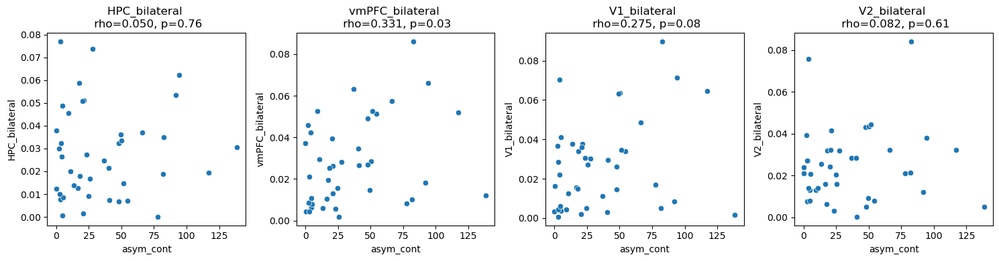

In [155]:
fig,axes = plt.subplots(1,4,figsize=(15,4))
plt_df = ps_roi_df[(ps_roi_df.subgroup=="Generalizer")].copy()
for roi in rois:
    plt_df[f"abs_{roi}"] = np.abs(plt_df[roi])
#plt_df["coefmulti"] = [ta*ac for ta,ac in plt_df[['tamapping', 'ave_abs_count_coef']].to_numpy()]
#plt_df["coefdiff"] = [ta*cx+cy for ta,cx,cy in plt_df[['tamapping','countx_coef', 'county_coef']].to_numpy()]
for j in range(4):
    xvar = "asym_cont"
    sns.scatterplot(plt_df,
                    x=xvar,y=f"abs_{rois[j]}",
#                    hue="cohort",palette = dict(zip(["first cohort","second cohort"],sns.color_palette(None,4)[2:])),
                    ax=axes[j])
    axes[j].set_xlabel(xvar)
    axes[j].set_ylabel(rois[j])
    PS_countcoef_corr = scipy.stats.pearsonr(plt_df[xvar],plt_df[f"abs_{rois[j]}"])
    axes[j].set_title(f"{rois[j]} \n rho={'%.3f, p=%.2f' % (PS_countcoef_corr.statistic, PS_countcoef_corr.pvalue)}")
        
fig.tight_layout()


### PS (classification) correspondence across regions
It seems that the PS across region are quite correlated

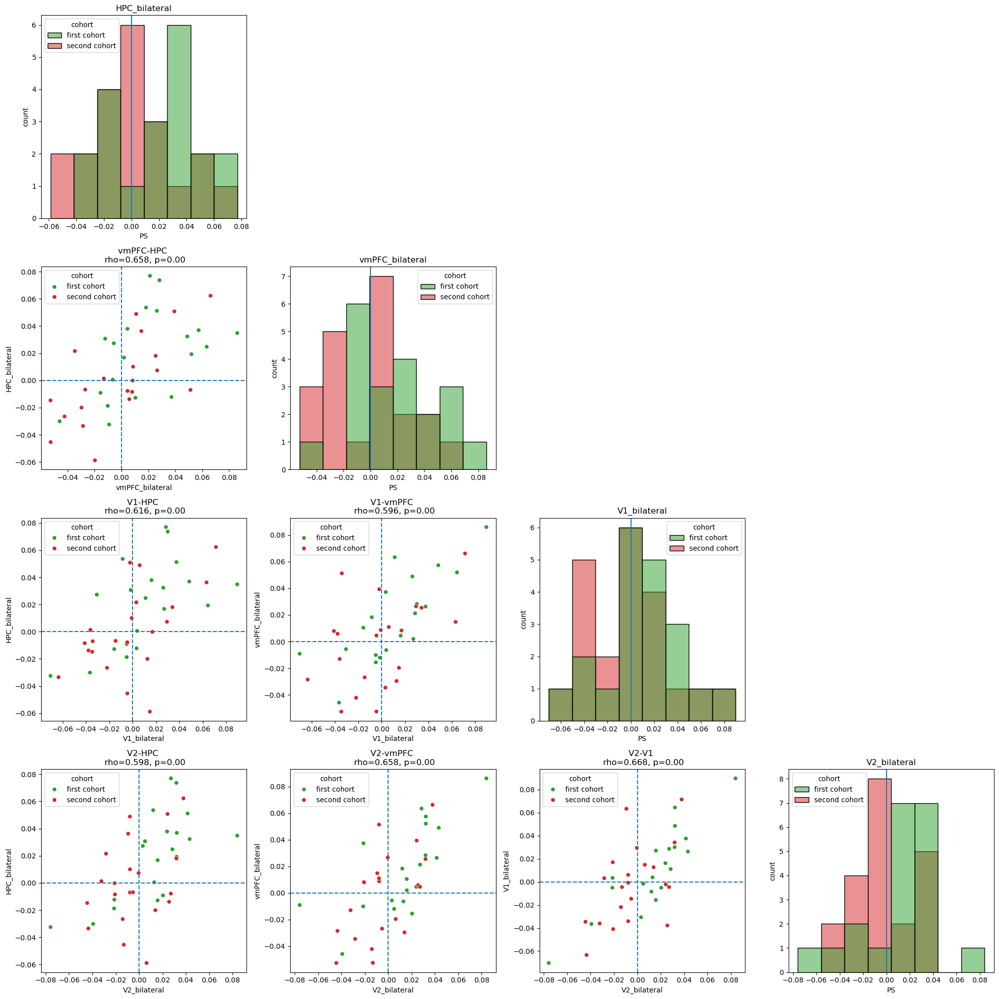

In [ ]:
fig,axes = plt.subplots(4,4,figsize=(20,20))
plt_df = ps_roi_df[ps_roi_df.subgroup=="Generalizer"].copy()
for j in range(4):
    for k in range(4):
        if j>=k:
            axes[j,k].tick_params(axis='both', labelleft=True, labelbottom=True)
        else:
            axes[j,k].remove()

        if j == k:
            sns.histplot(plt_df,bins=8,
                         x=rois[j],
                         hue="cohort",palette = dict(zip(["first cohort","second cohort"],sns.color_palette(None,4)[2:])),
                         ax=axes[j,k])
            axes[j,k].axvline(0)               
            axes[j,k].set_title(rois[j])  
            axes[j,k].set_xlabel("PS")  
            axes[j,k].set_ylabel("count")
        
        if j>k:
            sns.scatterplot(plt_df,
                         x=rois[j],y=rois[k],
                         hue="cohort",palette = dict(zip(["first cohort","second cohort"],sns.color_palette(None,4)[2:])),
                         ax=axes[j,k])
            axes[j,k].set_xlabel(rois[j])  
            axes[j,k].set_ylabel(rois[k])
            PS_crossroi_corr = scipy.stats.spearmanr(plt_df[rois[j]],plt_df[rois[k]])
            axes[j,k].set_title(f"{rois[j].replace('_bilateral','')}-{rois[k].replace('_bilateral','')} \n rho={'%.3f, p=%.2f' % (PS_crossroi_corr.statistic, PS_crossroi_corr.pvalue)}")
            axes[j,k].axhline(0,linestyle="--")
            axes[j,k].axvline(0,linestyle="--")
fig.tight_layout()

### correlation between Learning Asymmetry and model RDM coefficient

Text(0.5, 1.0, 'Generalizer Learning Asymmetry distribution')

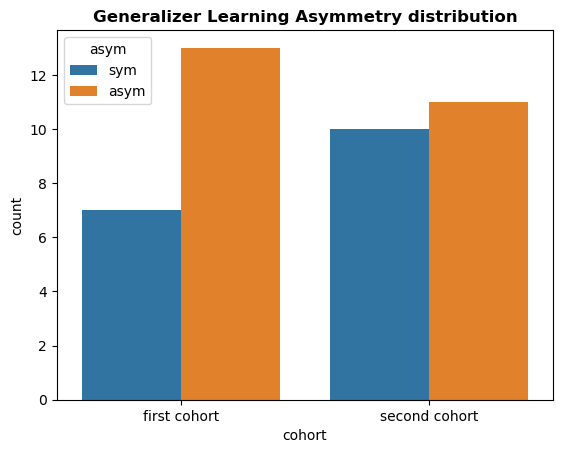

In [112]:
sns.countplot(subrep_category_df[subrep_category_df.subid.isin(generalizers)],
              hue="asym",x="cohort")
plt.title("Generalizer Learning Asymmetry distribution",fontweight="bold")

In [36]:
scanner_ave_perf[scanner_ave_perf.subid==subid]

,cohort,islearner,isgeneralizer,subid,tamapping,tamapping_str,countx_coef,county_coef,ave_abs_count_coef,countx_p,county_p,LLR_train,LLR_test
55,second cohort,learner,generalizer,sub130,-1,topright,153.41876,-90.217315,153.41876,0.175737,0.421616,3.820144,3.153771


In [114]:
fname ="training_nocenter"
AsymgroupaveRDMS = {"Generalizer":{},"nonGeneralizer":{}}
for roi in rois:
    AsymgroupaveRDMS["Generalizer"][roi] = {"top-left":[],"top-right":[]}
    AsymgroupaveRDMS["nonGeneralizer"][roi] = {"top-left":[],"top-right":[]}
    for subrdm,subdf,subid in list(zip(sub_rdms[fname][roi],sub_stimdfs[fname][roi],subid_list)):
        assert scanner_ave_perf[scanner_ave_perf.subid==subid]["tamapping"].values.size==1            
        ta = scanner_ave_perf[scanner_ave_perf.subid==subid]["tamapping"].values[0]
        if ta == -1:
            if subid in generalizers:
                AsymgroupaveRDMS["Generalizer"][roi]["top-right"].append(subrdm)
            else:
                AsymgroupaveRDMS["nonGeneralizer"][roi]["top-right"].append(subrdm)
        elif ta == 1:
            if subid in generalizers:
                AsymgroupaveRDMS["Generalizer"][roi]["top-left"].append(subrdm)
            else:
                AsymgroupaveRDMS["nonGeneralizer"][roi]["top-left"].append(subrdm)


In [ ]:
for roi in rois:
    for mappingname in AsymgroupaveRDMS["Generalizer"][roi].keys():
        averdm = np.mean([minmax_scale(x) for x in AsymgroupaveRDMS["Generalizer"][roi][mappingname]],axis=0)
        outputdir = os.path.join(ROIRSAdir,"MDS",f"{fname}_AsymLearning")
        checkdir(outputdir)
        mcol = "training_axlocTL"
        fig, axes, X_df = plot_rdm_mds(averdm,ncompo=3,stimdf=navi_stimdf[curr_filt].copy().reset_index(drop=True),
                                    gcol="training_axsetstr",
                                    huecol="training_axsetstr",stylecol=mcol,stim_namer=lambda h,s: '%s%d' % (h,s),
                                    plot_3d=False)
        fig.suptitle(f"{roi} - {subgroup}")
        fig.savefig(os.path.join(outputdir,f"{roi}_Generalizer_{mappingname}.jpg"))
        #for loc1,loc2,tl in X_df[['MDS ax1', 'MDS ax2', "stim_name"]].to_numpy():
        #    axes[1].text(loc1,loc2, tl,size='small')
        plt.close()
        cpal = dict(zip(np.unique(X_df["training_axsetstr"]), 
                        sns.color_palette(None, np.unique(X_df["training_axsetstr"]).size).as_hex()))
        pxfig = px.line_3d(X_df,x="MDS ax1",y="MDS ax2",z="MDS ax3",
                        text="stim_name",
                        #symbol= "training_axloc",
                        line_group="training_axsetstr",
                        color_discrete_sequence=["black"],
                        line_dash_sequence=["dash"],
                        )
        pxfig.update_traces(
            line=dict(
                width=3
            )
        )
        for k,(ta,tadf) in enumerate(X_df.groupby("training_axsetstr")):
            trace_arr = tadf[["MDS ax1","MDS ax2","MDS ax3"]].to_numpy()
            pxfig.add_trace(
                go.Scatter3d(
                    x=trace_arr[:,0], y=trace_arr[:,1],z=trace_arr[:,2], 
                    mode='markers',
                    marker=dict(
                        color=cpal[ta]#[cpal[ta]] * trace_arr.shape[0]
                    ),
                    name=f"Training stimuli on {ta} axis",

                )
            )

        axlocs = np.unique(X_df[mcol])
        MDSX = X_df[["MDS ax1","MDS ax2","MDS ax3"]].to_numpy()
        assert all([np.sum(X_df.stim_x == j)==1 for j in axlocs])
        assert all([np.sum(X_df.stim_y == j)==1 for j in axlocs])
        xstims = np.array([MDSX[X_df.stim_x == j,:][0] for j in axlocs])
        ystims = np.array([MDSX[X_df.stim_y == j,:][0] for j in axlocs])

        pxfig.update_layout(#
            title_text=f"{roi.replace('_bilateral','')} {subgroup}",
            title_subtitle_text='Parallelism Score = %.3f' % (np.nanmean(parallel_axes_cosine_sim(xstims,ystims))),
            title_x=0.3,title_y=0.9,
            title_font_weight="bold",title_font_size=20,
            title_subtitle_font_size=20)
        pxfig.write_html(os.path.join(outputdir,f"{roi}_Generalizer_{mappingname}.html"))

In [128]:
np.unique(ROIRSA_PTA_cvres_meandf.analysis)

array(['train stim Compete PTAhigh Cartesian',
       'train stim betweenxy Cartesian',
       'train stim betweenxy Compete PTAhigh Cartesian',
       'train stim betweenxy Compete PTAlow Cartesian',
       'train stim betweenxy PTA high', 'train stim betweenxy PTA low'],
      dtype=object)

In [26]:
splt_df.columns

Index(['subid', 'subgroup', 'cohort', 'PSGROUProi', 'RSAroi', 'analysis',
       'modelrdm', 'coefficient', 'adjR2', 'R2', 'region', 'HPC_bilateral',
       'vmPFC_bilateral', 'V1_bilateral', 'V2_bilateral', 'subcohort', 'odd',
       'even', 'asym_cont', 'asym', 'subid_cat', 'HPCrepcat'],
      dtype='object')

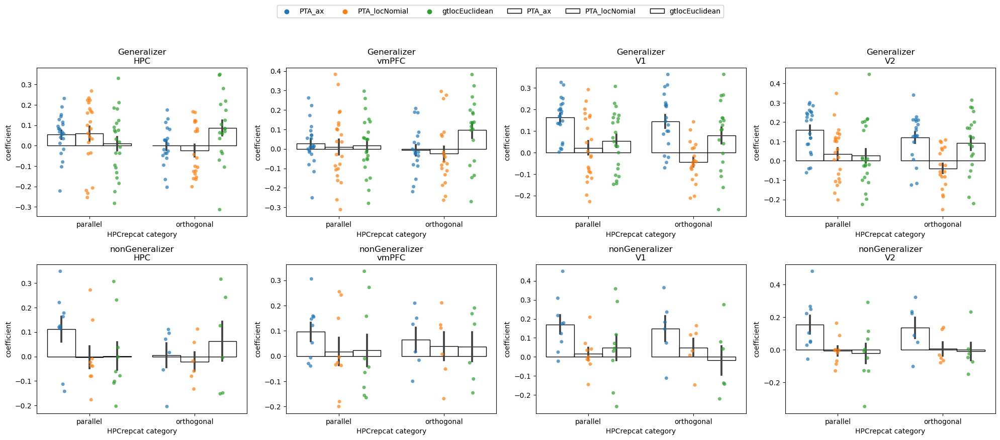

In [27]:
regname = "train stim Compete PTAhigh Cartesian" #train stim betweenxy Compete PTAhigh Cartesian "gtlocEuclidean"
PTAhighloc_coef = ROIRSA_PTA_cvres_meandf[(ROIRSA_PTA_cvres_meandf.analysis==regname)].copy().reset_index(drop=True)
fig_csrsacorr,axes_csrsacorr = plt.subplots(2,4,figsize=(20,8))
for k,sgname in enumerate(np.unique(PTAhighloc_coef.subgroup)):
    for j,roi in enumerate(rois):
        splt_df = PTAhighloc_coef[PTAhighloc_coef.RSAroi==roi].copy()
        splt_df = splt_df[splt_df.subgroup==sgname]
        sns.barplot(splt_df,
                    x="HPCrepcat",y="coefficient",
                    hue="modelrdm",fill=False,
                    errorbar="se",
                    ax=axes_csrsacorr[k,j])
        sns.stripplot(splt_df,
                        x="HPCrepcat",y="coefficient",
                        hue="modelrdm",dodge=True,alpha=0.7,
                        ax=axes_csrsacorr[k,j])
        axes_csrsacorr[k,j].set_title(f"{sgname}\n{roi.replace('_bilateral','')}")
        axes_csrsacorr[k,j].set_xlabel("HPCrepcat category")

        if j==len(rois)-1:
            h,l = axes_csrsacorr[k,j].get_legend_handles_labels()
            fig_csrsacorr.legend(h,l)
            sns.move_legend(fig_csrsacorr,
                    loc="lower center", bbox_to_anchor = (0.5,1.05),ncol=6)  
        axes_csrsacorr[k,j].legend().remove()

fig_csrsacorr.tight_layout()


In [144]:
print(ROIRSA_PTA_cvres_meandf.columns)
np.unique(ROIRSA_PTA_cvres_meandf.analysis)

Index(['subid', 'subgroup', 'cohort', 'PSGROUProi', 'RSAroi', 'analysis',
       'modelrdm', 'coefficient', 'adjR2', 'R2', 'region', 'HPC_bilateral',
       'vmPFC_bilateral', 'V1_bilateral', 'V2_bilateral', 'subcohort', 'odd',
       'even', 'asym', 'asym_cont', 'subid_cat', 'HPCrepcat'],
      dtype='object')


array(['train stim Compete PTAhigh Cartesian',
       'train stim betweenxy Cartesian',
       'train stim betweenxy Compete PTAhigh Cartesian',
       'train stim betweenxy Compete PTAlow Cartesian',
       'train stim betweenxy PTA high', 'train stim betweenxy PTA low'],
      dtype=object)

In [145]:
ROIRSA_PTA_cvres_meandf.head(5)

,subid,subgroup,cohort,PSGROUProi,RSAroi,analysis,modelrdm,coefficient,adjR2,R2,...,vmPFC_bilateral,V1_bilateral,V2_bilateral,subcohort,odd,even,asym,asym_cont,subid_cat,HPCrepcat
0,sub001,Generalizer,first cohort,HPC_bilateral,HPC_bilateral,train stim Compete PTAhigh Cartesian,PTA_ax,0.055201,-0.017417,0.057947,...,1,0,0,First Cohort,-6.748415,11.455465,sym,4.70705,sub001,parallel
1,sub001,Generalizer,first cohort,HPC_bilateral,HPC_bilateral,train stim Compete PTAhigh Cartesian,PTA_locNomial,0.159999,-0.017417,0.057947,...,1,0,0,First Cohort,-6.748415,11.455465,sym,4.70705,sub001,parallel
2,sub001,Generalizer,first cohort,HPC_bilateral,HPC_bilateral,train stim Compete PTAhigh Cartesian,gtlocEuclidean,0.068043,-0.017417,0.057947,...,1,0,0,First Cohort,-6.748415,11.455465,sym,4.70705,sub001,parallel
3,sub001,Generalizer,first cohort,HPC_bilateral,HPC_bilateral,train stim betweenxy Cartesian,gtlocEuclidean,0.165927,0.063212,0.063212,...,1,0,0,First Cohort,-6.748415,11.455465,sym,4.70705,sub001,parallel
4,sub001,Generalizer,first cohort,HPC_bilateral,HPC_bilateral,train stim betweenxy Compete PTAhigh Cartesian,PTA_locNomial,0.186029,0.046938,0.110475,...,1,0,0,First Cohort,-6.748415,11.455465,sym,4.70705,sub001,parallel


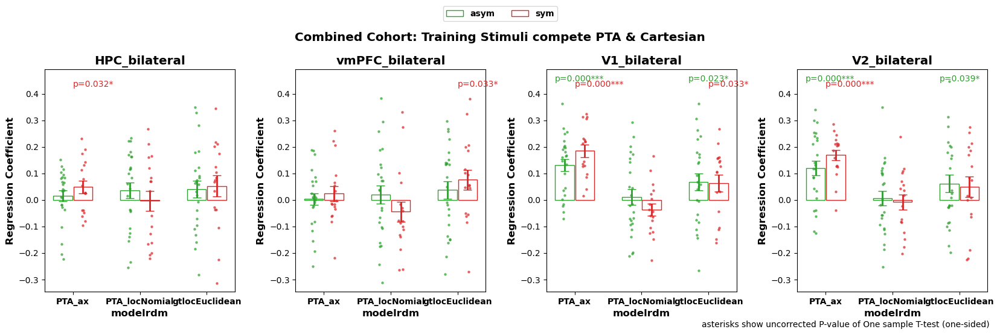

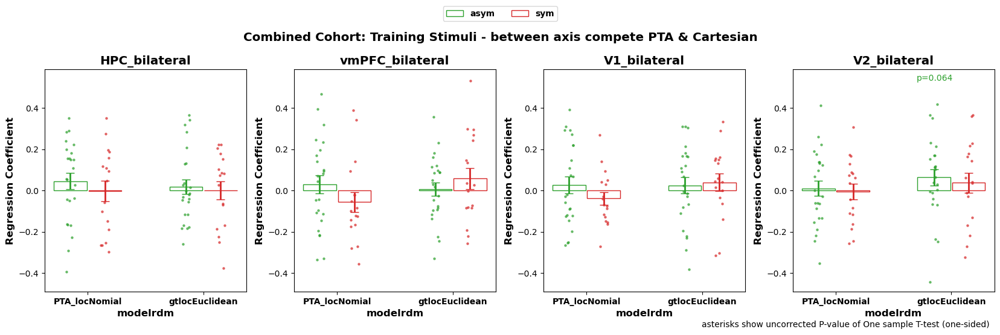

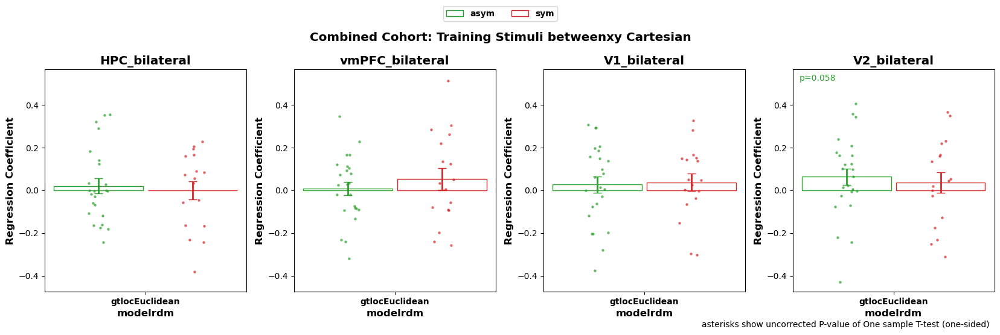

In [147]:
plt_ana = dict(zip(
    ['train stim Compete PTAhigh Cartesian',
     'train stim betweenxy Compete PTAhigh Cartesian',
     'train stim betweenxy Cartesian',
     ],
    ['Training Stimuli compete PTA & Cartesian',
     'Training Stimuli - between axis compete PTA & Cartesian',
     'Training Stimuli betweenxy Cartesian']
))
xvar, gvar, yvar, yvartest = "modelrdm",  "asym", "coefficient", "coefficient"
for cname,clist in zip(["Combined Cohort"],[subid_list]):
    for a, atitle in plt_ana.items():
        curr_pdf = ROIRSA_PTA_cvres_meandf[(ROIRSA_PTA_cvres_meandf.analysis==a)&(ROIRSA_PTA_cvres_meandf.subid.isin(clist))&(ROIRSA_PTA_cvres_meandf.subid.isin(generalizers))].copy().reset_index(drop=True)
        curr_pdf.modelrdm = pd.Categorical(curr_pdf.modelrdm)
        nonparstat = lambda yt:scipy.stats.wilcoxon(yt,alternative="greater").pvalue
        parastat = lambda yt: scipy.stats.ttest_1samp(yt,0,alternative="greater").pvalue
        stat_name = 'Wilcoxon signed-rank test' if cname != "Combined Cohort" else 'One sample T-test'
        stat_func = nonparstat if cname != "Combined Cohort" else parastat
        fig,axes = grouped_barscatter_withstats(curr_pdf,
                                    facet_vars = "region", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                    prows=1,pcols=4,hrow=5,wcol=5/1.2,hues=sns.color_palette(None,4)[2:],
                                    statfunc= parastat)
        
        for ifacet, _ in enumerate(axes.flatten()):
            axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
            axes.flatten()[ifacet].set_xlabel("modelrdm",fontweight="bold",fontsize="large")
        
            
        hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
        fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        fig.suptitle(f"{cname}: {atitle}",fontweight="bold",fontsize="x-large")
        fig.text(x=0.7, y=0, s=f'asterisks show uncorrected P-value of {stat_name} (one-sided)')
        fig.tight_layout()


# Relationship between train and Test

## Cross train and test stimuli Decoding

In [97]:
nctrtestim_decoding_res = load(os.path.join(ROIRSAdir,"noncenter_train2test_LRdecoding_acc.pkl"))
print(nctrtestim_decoding_res.keys())
print(nctrtestim_decoding_res['GSresults'].columns)

dict_keys(['GSresults', 'decoder', 'performance', 'confusion_matrices'])
Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'roi', 'subid', 'target',
       'heldoutgroup', 'heldouttype'],
      dtype='object')


In [99]:
trtedecodingcheckgsdfsummax = []
for gname,gdf in nctrtestim_decoding_res['GSresults'][nctrtestim_decoding_res['GSresults'].subid.isin(generalizers)].copy().groupby(["subid","roi","target"]):
    gdfsum = gdf.groupby(["subid","roi","target"])["mean_test_score"].max().reset_index()
    gdfsum["param_C"] = gdf.param_C.to_numpy()[np.argmax(gdf.mean_test_score.to_numpy())]
    trtedecodingcheckgsdfsummax.append(gdfsum)
trtedecodingcheckgsdfsummax = pd.concat(trtedecodingcheckgsdfsummax,axis=0).reset_index(drop=True)


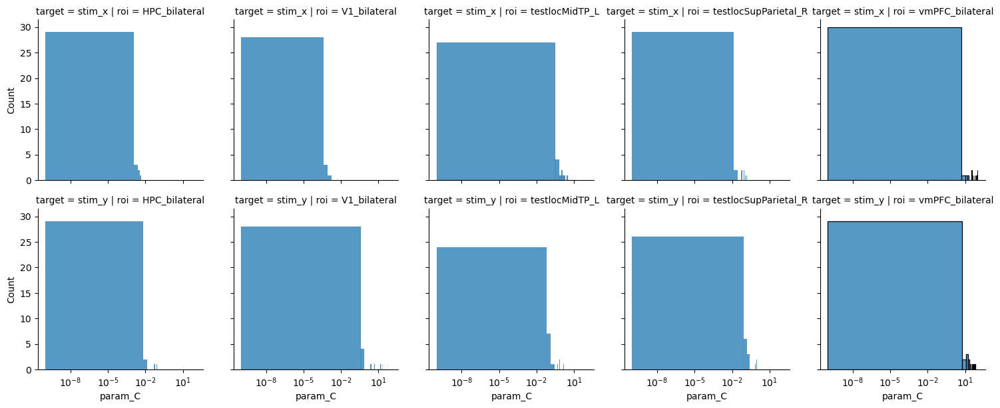

In [104]:
gs = sns.FacetGrid(trtedecodingcheckgsdfsummax, col="roi", row="target")
for ifacet, (gnam,gdf) in enumerate(trtedecodingcheckgsdfsummax.groupby(["target","roi"])):
    sns.histplot(gdf,x="param_C",ax=gs.axes.flatten()[ifacet])
#gs.map_dataframe(sns.lineplot,x="param_C",y="mean_test_score",alpha=0.8,color="black") # show average line
gs.set(xscale="log")


In [76]:
trtedecodingcheckgsdfsummax

,subid,roi,target,mean_test_score,param_C
0,sub001,HPC_bilateral,stim_x,0.312500,0.001884
1,sub001,HPC_bilateral,stim_y,0.250000,0.000001
2,sub001,V1_bilateral,stim_x,0.343750,37.193736
3,sub001,V1_bilateral,stim_y,0.687500,20.045340
4,sub001,testlocMidTP_L,stim_x,0.250000,0.000003
...,...,...,...,...,...
405,sub130,testlocMidTP_L,stim_y,0.562500,0.000334
406,sub130,testlocSupParietal_R,stim_x,0.328125,0.000334
407,sub130,testlocSupParietal_R,stim_y,0.312500,0.028601
408,sub130,vmPFC_bilateral,stim_x,0.312500,0.000046


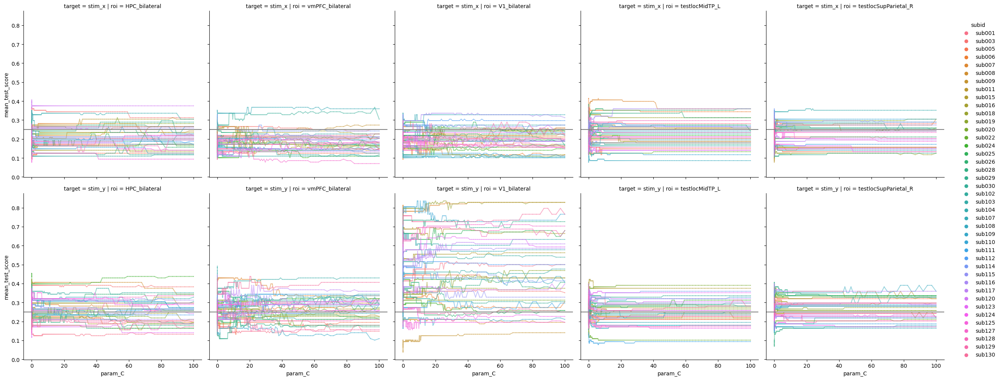

In [105]:
#check if gridsearch cover sufficient range of parameter range
trtedecodingcheckgsdf = nctrtestim_decoding_res['GSresults'][nctrtestim_decoding_res['GSresults'].subid.isin(generalizers)].copy()
trtedecodingcheckgsdf.roi = pd.Categorical(trtedecodingcheckgsdf.roi, categories=rois,ordered=True)
trtedecodingcheckgsdfsum = trtedecodingcheckgsdf.groupby(["subid","roi","target","param_C"])["mean_test_score"].mean().reset_index()
gs = sns.relplot(data=trtedecodingcheckgsdfsum,x="param_C",y="mean_test_score",hue="subid",col="roi",row="target",kind="scatter",facet_kws=dict(sharex=True,sharey=True),alpha=0.5,s=2)
gs.map_dataframe(sns.lineplot,x="param_C",y="mean_test_score",hue="subid",alpha=0.5) #show individual lines
#gs.map_dataframe(sns.lineplot,x="param_C",y="mean_test_score",alpha=0.8,color="black") # show average line
#gs.set(xscale="log")
for j,ax in enumerate(gs.axes.flatten()):
    ax.axhline(0.25,c="grey")

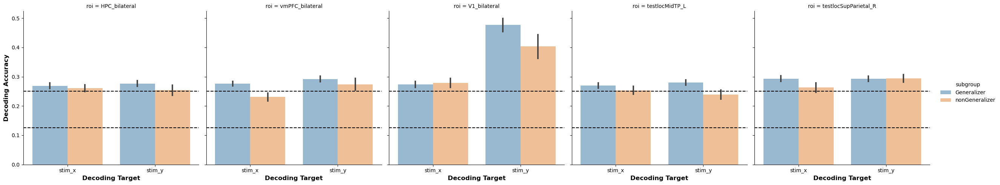

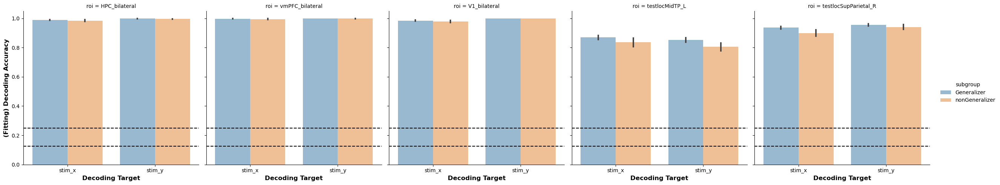

In [106]:
nctrtesstimdc_performance_df = nctrtestim_decoding_res["performance"]
nctrtesstimdc_performance_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrtesstimdc_performance_df["subid"]]
gs = sns.catplot(data=nctrtesstimdc_performance_df,
            x="target",y="eval_acc",
            hue="subgroup",palette="tab10",
            col="roi",
            kind="bar",errorbar="se",alpha=0.5)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black")
    ax.axhline(1/8,linestyle="--",color="black")
gs = sns.catplot(data=nctrtesstimdc_performance_df,
            x="target",y="fit_acc",
            hue="subgroup",palette="tab10",
            col="roi",
            kind="bar",errorbar="se",alpha=0.5)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black")
    ax.axhline(1/8,linestyle="--",color="black")
#gs.map_dataframe(sns.stripplot,
#                 x="target",y="eval_acc",
#                hue="subgroup",palette="tab10",
#                dodge=True)

In [107]:
nctrtesstimdc_performance_df[nctrtesstimdc_performance_df.heldoutgroup==0].copy().heldouttype.unique()

array(['train2test'], dtype=object)

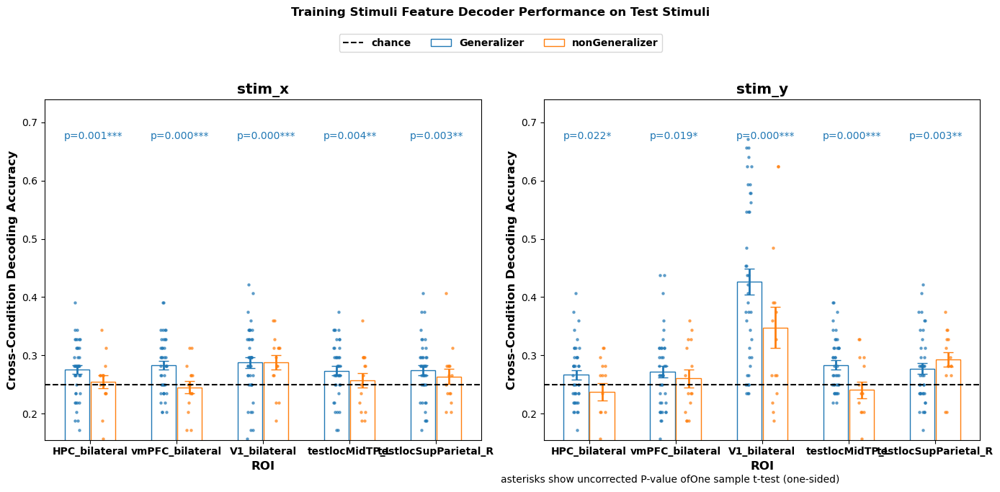

In [108]:
nctrtesstimdc_performance_df["eval_acc_above_chance"] = nctrtesstimdc_performance_df.eval_acc - 0.25

nctrtesstimdc_performance_df_sum = nctrtesstimdc_performance_df.groupby(["roi","subid","heldouttype","target"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
nctrtesstimdc_performance_df_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrtesstimdc_performance_df_sum["subid"]]
)

nctrtesstimdc_performance_df_sum = nctrtesstimdc_performance_df_sum[nctrtesstimdc_performance_df_sum.roi.isin(rois)].copy().reset_index(drop=True)
nctrtesstimdc_performance_df_sum["roi"] = pd.Categorical(nctrtesstimdc_performance_df_sum["roi"],categories=rois,ordered=True)
xvar, gvar, yvar, yvartest = "roi",  "subgroup", "eval_acc","eval_acc_above_chance"
fig,axes = grouped_barscatter_withstats(nctrtesstimdc_performance_df_sum[nctrtesstimdc_performance_df_sum.heldouttype=="train2test"].copy(),
                             facet_vars = "target", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                             prows=1,pcols=2,
                             
                             statfunc=lambda yt: 1. if np.size(yt)<20 else scipy.stats.ttest_1samp(yt,0,alternative='greater').pvalue)
for ifacet, _ in enumerate(axes.flatten()):
    axes.flatten()[ifacet].set_ylabel("Cross-Condition Decoding Accuracy",fontweight="bold",fontsize="large")
    axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
    axes.flatten()[ifacet].axhline(0.25,label="chance",color="k",ls='--')
    
hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
fig.legend([hs[0],hs[1],hs[-1]],[ls[0],ls[1],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.05),ncol = 4,
           prop = dict(weight="bold"))
fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
fig.suptitle("Training Stimuli Feature Decoder Performance on Test Stimuli",fontweight="bold",fontsize="large",y=1.1)
fig.tight_layout()

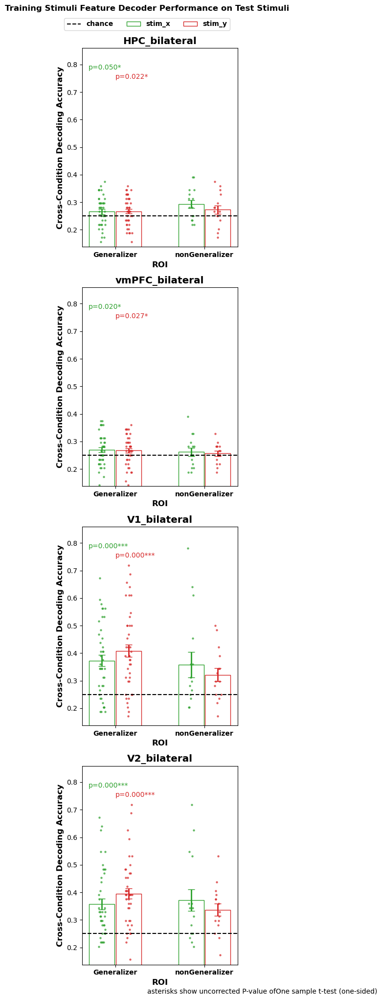

In [75]:
nctrtesstimdc_performance_df["eval_acc_above_chance"] = nctrtesstimdc_performance_df.eval_acc - 0.25

nctrtesstimdc_performance_df_sum = nctrtesstimdc_performance_df.groupby(["roi","subid","heldouttype","target"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
nctrtesstimdc_performance_df_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrtesstimdc_performance_df_sum["subid"]]
)

non_ips_rois = ["HPC_bilateral","vmPFC_bilateral","V1_bilateral","V2_bilateral"]
nctrtesstimdc_performance_df_sum = nctrtesstimdc_performance_df_sum[nctrtesstimdc_performance_df_sum.roi.isin(non_ips_rois)].copy().reset_index(drop=True)
nctrtesstimdc_performance_df_sum["roi"] = pd.Categorical(nctrtesstimdc_performance_df_sum["roi"],categories=non_ips_rois,ordered=True)
xvar, gvar, yvar, yvartest = "subgroup", "target", "eval_acc","eval_acc_above_chance"
fig,axes = grouped_barscatter_withstats(nctrtesstimdc_performance_df_sum[nctrtesstimdc_performance_df_sum.heldouttype=="train2test"].copy(),
                             facet_vars = "roi", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                             prows=4,pcols=1,hues=sns.color_palette(None,4)[2:],
                             hrow=5,wcol=4,
                             statfunc=lambda yt: 1. if np.size(yt)<20 else scipy.stats.ttest_1samp(yt,0,alternative='greater').pvalue)
for ifacet, _ in enumerate(axes.flatten()):
    axes.flatten()[ifacet].set_ylabel("Cross-Condition Decoding Accuracy",fontweight="bold",fontsize="large")
    axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
    axes.flatten()[ifacet].axhline(0.25,label="chance",color="k",ls='--')
    
hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
fig.legend([hs[0],hs[1],hs[-1]],[ls[0],ls[1],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1),ncol = 4,
           prop = dict(weight="bold"))
fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
fig.suptitle("Training Stimuli Feature Decoder Performance on Test Stimuli",fontweight="bold",fontsize="large",y=1.01)
fig.tight_layout()

## Cross task decoding

In [109]:
nclocnavi_decoding_res = load(os.path.join(ROIRSAdir,"noncenter_navi2loc_LRdecoding_acc.pkl"))
print(nctrtestim_decoding_res.keys())
print(nctrtestim_decoding_res['GSresults'].columns)

dict_keys(['GSresults', 'decoder', 'performance', 'confusion_matrices'])
Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'roi', 'subid', 'target',
       'heldoutgroup', 'heldouttype'],
      dtype='object')


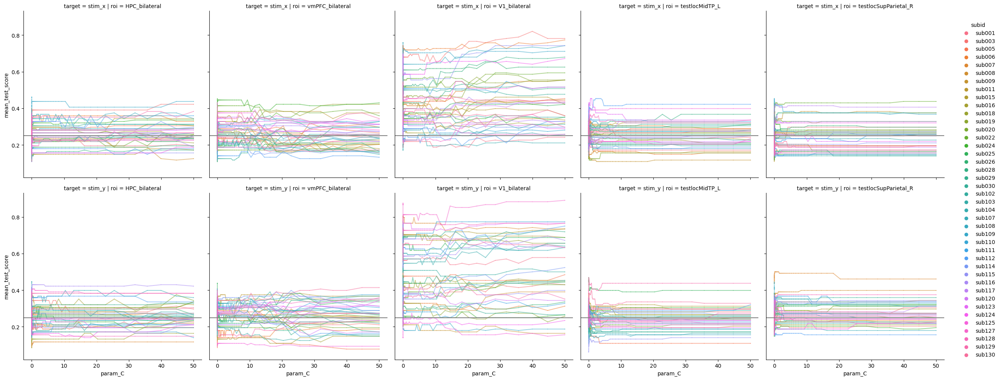

In [110]:
#check if gridsearch cover sufficient range of parameter range
nclocnavidecodingcheckgsdf = nclocnavi_decoding_res['GSresults'][nclocnavi_decoding_res['GSresults'].subid.isin(generalizers)].copy()
nclocnavidecodingcheckgsdf.roi = pd.Categorical(nclocnavidecodingcheckgsdf.roi, categories=rois,ordered=True)
nclocnavidecodingcheckgsdfsum = nclocnavidecodingcheckgsdf.groupby(["subid","roi","target","param_C"])["mean_test_score"].mean().reset_index()
gs = sns.relplot(data=nclocnavidecodingcheckgsdfsum,x="param_C",y="mean_test_score",hue="subid",col="roi",row="target",kind="scatter",facet_kws=dict(sharex=True,sharey=True),alpha=0.5,s=2)
gs.map_dataframe(sns.lineplot,x="param_C",y="mean_test_score",hue="subid",alpha=0.5) #show individual lines
#gs.map_dataframe(sns.lineplot,x="param_C",y="mean_test_score",alpha=0.8,color="black") # show average line
#gs.set(xscale="log")
for j,ax in enumerate(gs.axes.flatten()):
    ax.axhline(0.25,c="grey")

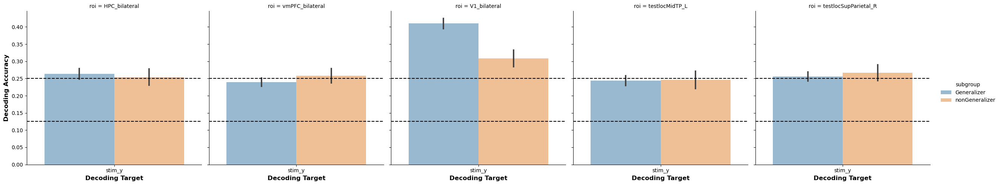

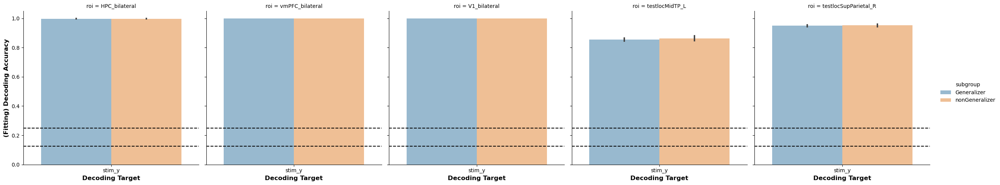

In [111]:
nclocnavidc_performance_df = nclocnavi_decoding_res["performance"]
nclocnavidc_performance_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nclocnavidc_performance_df["subid"]]
gs = sns.catplot(data=nclocnavidc_performance_df,
            x="target",y="eval_acc",
            hue="subgroup",palette="tab10",
            col="roi",
            kind="bar",errorbar="se",alpha=0.5)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black")
    ax.axhline(1/8,linestyle="--",color="black")
gs = sns.catplot(data=nclocnavidc_performance_df,
            x="target",y="fit_acc",
            hue="subgroup",palette="tab10",
            col="roi",
            kind="bar",errorbar="se",alpha=0.5)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black")
    ax.axhline(1/8,linestyle="--",color="black")
#gs.map_dataframe(sns.stripplot,
#                 x="target",y="eval_acc",
#                hue="subgroup",palette="tab10",
#                dodge=True)

In [84]:
from sklearn import metrics
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import LeaveOneGroupOut,LeavePGroupsOut
from sklearn.model_selection import GridSearchCV
from zpyhelper.MVPA.preprocessors import extract_pc,average_flexi_session
def classifier_cv(X,targets,split_groups,baseclf=LinearSVC,baseclf_kwargs={},return_splits=False,
                  return_decoder=False):
    logo = LeaveOneGroupOut()
    fit_acc,pred_acc = [],[]
    decoders = []
    for i, (fit_idx, eval_idx) in enumerate(logo.split(X,targets,groups=split_groups)):
        if np.ndim(targets)>1:
            
            clf = MultiOutputClassifier(baseclf(**baseclf_kwargs))
            clf.fit(X[fit_idx,:],targets[fit_idx,:])
            fit_acc.append(clf.score(X[fit_idx,:],targets[fit_idx,:]))
            pred_acc.append(clf.score(X[eval_idx,:],targets[eval_idx,:]))
        else:
            
            clf = baseclf(**baseclf_kwargs)
            clf.fit(X[fit_idx,:],targets[fit_idx])
            
            fit_acc.append(clf.score(X[fit_idx,:],targets[fit_idx]))
            pred_acc.append(clf.score(X[eval_idx,:],targets[eval_idx]))
        decoders.append(clf)
        
    if return_splits:
        if return_decoder:
            return fit_acc,pred_acc,decoders
        else:
            return fit_acc,pred_acc
    else:
        if return_decoder:
            return np.mean(fit_acc),np.mean(pred_acc),decoders
        else:
            return np.mean(fit_acc),np.mean(pred_acc)

In [85]:
analyses = [

    {"name":"predict training stim cross-validate by task",
     "target_col":["stim_x","stim_y"],
     "splitby_col":"taskname",
     "chancelvl":0.25,
     "stimgroup_filter":1 ## training stim to training loc
     },

    {"name":"predict test stim cross-validate by task",
    "target_col":["stim_x","stim_y"],
    "splitby_col":"taskname",
    "chancelvl":0.25,
    "stimgroup_filter":0 ## test stim to training loc
    },

     ]
crosstaskCCGP_results = []
for roi in rois:
    for subdata,subid in zip(roi_data[roi],subid_list):
        print(f"{roi} - {subid}",end="\r",flush=True)            
        for a_config in analyses:
            a_name,target_col,split_by_col = a_config["name"],a_config["target_col"],a_config["splitby_col"]
            subgroup = "Generalizer" if subid in generalizers else "nonGeneralizer"
            preprocedX = deepcopy(subdata["preprocX"])
            stimdf = subdata["stimdf"]
            non_center_filter = [not all([x==0, y==0]) for x,y in stimdf[["stim_x","stim_y"]].to_numpy()]
            
            xydecoders = []
            for j,tcol in enumerate(target_col):
                navi_filter = np.all(np.vstack([
                            stimdf.taskname.to_numpy() == "navigation",
                            stimdf.stim_group.to_numpy() == a_config["stimgroup_filter"],
                            stimdf[tcol]!=0
                            ]),axis=0)
                lzer_filter = np.all(np.vstack([
                            stimdf.taskname.to_numpy() == "localizer",
                            stimdf[tcol]!=0
                            ]),axis=0)

            
                currdf = pd.concat([stimdf[navi_filter].copy().reset_index(drop=True),
                                    stimdf[lzer_filter].copy().reset_index(drop=True)]).reset_index(drop=True)
                sessions_all = currdf.stim_session.to_numpy()
                #currdf = currdf[currdf.stim_session>=3].copy().reset_index(drop=True)
                
                X = np.vstack([preprocedX[navi_filter,:],preprocedX[lzer_filter,:]])
                #X = average_flexi_session(X, sessions_all,[[0,1,2,3],[4]])
                X = np.vstack([scale_feature(d,s_dir=1) for d in split_data(X,sessions_all)])
                #X = PCA().fit_transform(X)
                #X = scale_feature(X,s_dir=1)
            
                targets = np.array([(x*2+2).astype(int) for x in currdf[tcol].to_numpy()]) 
                split_groups = currdf[split_by_col].to_numpy()
                baseclf_kwargs = {'max_iter':1000000,'tol':1e-5, 'C':0.001,'random_state':0}                
                #fit_filter, eval_filter = split_groups=="navigation", split_groups=="localizer"
                #clf = LogisticRegression(**baseclf_kwargs)
                #clf.fit(X[fit_filter,:], targets[fit_filter])
                #fit_acc,eval_acc = clf.score(X[fit_filter,:], targets[fit_filter]), clf.score(X[eval_filter,:], targets[eval_filter])
                
                fit_acc,eval_acc = classifier_cv(X,targets,split_groups,
                                                baseclf=LogisticRegression,baseclf_kwargs=baseclf_kwargs,return_splits=False)

                # gridsearch_groups = currdf[target_col[int(1-j)]].to_numpy()
                # baseclf_kwargs = {'max_iter':1000000,'tol':1e-5}
                # gridsearcg_paramgrid={'C':np.geomspace(10**-10,20,num=20)}

                # fit_filter, eval_filter = split_groups=="navigation", split_groups=="localizer"
                # clf = GridSearchCV(LogisticRegression(**baseclf_kwargs),
                #                    param_grid=gridsearcg_paramgrid,
                #                    cv=LeaveOneGroupOut())
                # clf.fit(X[fit_filter,:],targets[fit_filter],groups=gridsearch_groups[fit_filter])

                # fit_acc = clf.score(X[fit_filter,:],targets[fit_filter])
                # eval_acc = clf.score(X[eval_filter,:],targets[eval_filter])
                
                # fit_acc,eval_acc = classifier_gridsearchcv_cv(X,targets,split_groups,
                #                 gridsearcg_paramgrid,gridsearch_groups,
                #                 baseclf=LogisticRegression,baseclf_kwargs=baseclf_kwargs,
                #                 return_splits=False,return_decoder=False)

                crosstaskCCGP_res = {"accuracy":[fit_acc,eval_acc],"stage":["fit","eval"]}
                crosstaskCCGP_results.append(
                    pd.DataFrame(crosstaskCCGP_res).assign(roi=roi,subid=subid,subgroup=subgroup,analysis=a_name,predcol = tcol)
                        )
                    

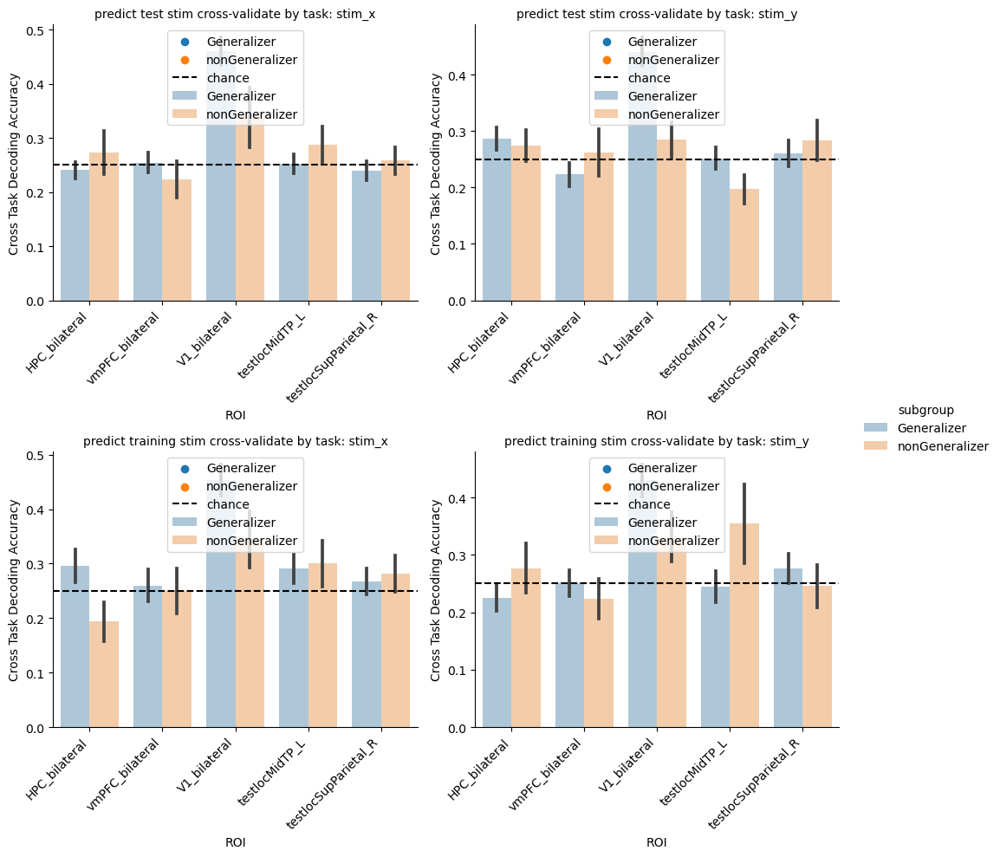

In [91]:
crosstaskCCGP_results_df = pd.concat(crosstaskCCGP_results).reset_index(drop=True)
crosstaskCCGP_results_df.head(5)
crosstaskCCGP_results_df["roi"] = pd.Categorical(crosstaskCCGP_results_df["roi"],categories=rois,ordered=True)
crosstaskCCGP_results_df["accuracy_above_chance"] = crosstaskCCGP_results_df["accuracy"]-0.25
crosstaskCCGP_results_df["stage"] = pd.Categorical(crosstaskCCGP_results_df.stage,
                                                   categories = ['eval', 'fit'],
                                                   ordered=True)
crosstaskCCGP_results_df["analysis"] = pd.Categorical(crosstaskCCGP_results_df.analysis)
crosstaskCCGP_results_df.to_csv(os.path.join(ROIRSAdir,"crosstaskdecoding.csv"))

fg_trainingCCGP = sns.catplot(crosstaskCCGP_results_df[crosstaskCCGP_results_df.stage=="eval"].copy(),
            hue="subgroup",y="accuracy",
            row="analysis",
            x="roi",col="predcol",
            kind="bar",errorbar="se",
            sharey=False,alpha=0.4)
fg_trainingCCGP.set_titles(template="{row_name}: {col_name}") 
fg_trainingCCGP.map(sns.stripplot, 'roi', "accuracy", "subgroup", dodge=True, 
                     size=3,alpha=0.5,
                     hue_order=['Generalizer', 'nonGeneralizer'],palette=sns.color_palette()[:2],
                     order = base_rois)
for ax in fg_trainingCCGP.axes.flatten():
    ax.axhline(0.25,label="chance",color="k",ls='--')
    ax.set_xlabel("ROI",visible=True)
    ax.set_ylabel("Cross Task Decoding Accuracy",visible=True)
    ax.tick_params(labelbottom=True,labeltop=False,labelleft=True,labelright=False)
    plt.setp(ax.get_xticklabels(), visible=True, rotation=45, ha="right")
    old_labels = ax.get_xticklabels()
    #ax.set_xticklabels([x.get_text().replace("cluster_","").replace("_","\n") for x in old_labels])
    #ax.set_aspect(3)
    ax.legend()
    sns.move_legend(ax, loc="upper center", bbox_to_anchor=(0.5,1))

fg_trainingCCGP.tight_layout()


In [718]:
crosstaskCCGP_results_df.columns

Index(['accuracy', 'stage', 'roi', 'subid', 'subgroup', 'analysis', 'predcol',
       'region', 'side', 'accuracy_above_chance'],
      dtype='object')

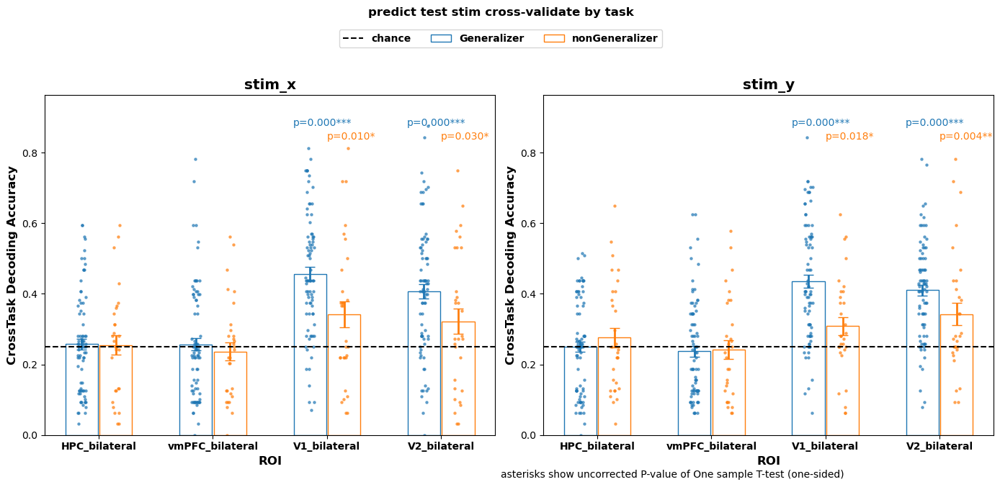

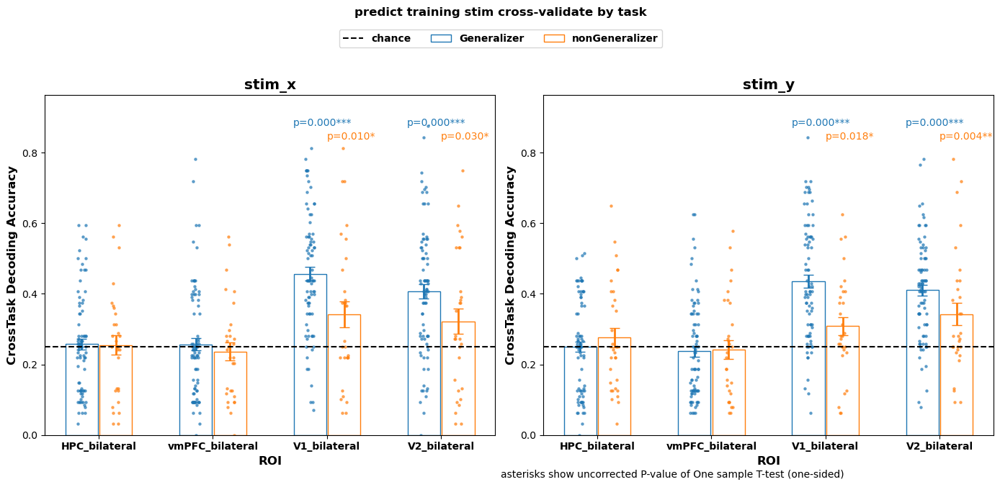

In [752]:
xvar, gvar, yvar, yvartest = "roi",  "subgroup", "accuracy","accuracy_above_chance"
keep_rois = [x for x in rois if "IPS" not in x]
plotsubsetdf = crosstaskCCGP_results_df[(crosstaskCCGP_results_df.stage=="eval")&(crosstaskCCGP_results_df.roi.isin(keep_rois))].copy()
plotsubsetdf.roi = pd.Categorical(plotsubsetdf.roi, categories=keep_rois,ordered=True)
for gname, pdf in plotsubsetdf.groupby("analysis"):
    fig,axes = grouped_barscatter_withstats(plotsubsetdf,
                                facet_vars = "predcol", 
                                xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                prows=1,pcols=2,
                                statfunc=lambda yt: 1. if np.size(yt)<20 else scipy.stats.ttest_1samp(yt,0,alternative='greater').pvalue)
    for ifacet, _ in enumerate(axes.flatten()):
        axes.flatten()[ifacet].set_ylabel("CrossTask Decoding Accuracy",fontweight="bold",fontsize="large")
        axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
        axes.flatten()[ifacet].axhline(0.25,label="chance",color="k",ls='--')
        
    hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
    fig.legend([hs[0],hs[1],hs[-1]],[ls[0],ls[1],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.05),ncol = 4,
            prop = dict(weight="bold"))
    fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value of One sample T-test (one-sided)')
    fig.suptitle(gname,fontweight="bold",fontsize="large",y=1.09)
    fig.tight_layout()

### is cross-task decoding correlated with compression

In [765]:
loc2testencoding_resdf = crosstaskCCGP_results_df.query("stage=='eval' & analysis=='predict training stim cross-validate by task'").copy().reset_index(drop=True)
loc2testencoding_resdf["dimonaxis"] = loc2testencoding_resdf["predcol"].map({"stim_x":"x axis","stim_y":"y axis"})
print(svdestdim_df_sum.head(5))
loc2testencoding_resdf.head(5)

             roi   subid dimonaxis  est_dim  reconstruction_corr  run  \
0  HPC_bilateral  sub001    x axis     1.75             0.028507  1.5   
1  HPC_bilateral  sub001    y axis     1.50             0.011834  1.5   
2  HPC_bilateral  sub002    x axis     1.25             0.024494  1.5   
3  HPC_bilateral  sub002    y axis     1.00             0.049318  1.5   
4  HPC_bilateral  sub003    x axis     1.00             0.035985  1.5   

         subgroup     subcohort  
0     Generalizer  first cohort  
1     Generalizer  first cohort  
2  nonGeneralizer  first cohort  
3  nonGeneralizer  first cohort  
4     Generalizer  first cohort  


,accuracy,stage,roi,subid,subgroup,analysis,predcol,region,side,accuracy_above_chance,dimonaxis
0,0.09375,eval,HPC_bilateral,sub001,Generalizer,predict training stim cross-validate by task,stim_x,HPC,bilateral,-0.15625,x axis
1,0.40625,eval,HPC_bilateral,sub001,Generalizer,predict training stim cross-validate by task,stim_y,HPC,bilateral,0.15625,y axis
2,0.31250,eval,HPC_bilateral,sub002,nonGeneralizer,predict training stim cross-validate by task,stim_x,HPC,bilateral,0.06250,x axis
3,0.09375,eval,HPC_bilateral,sub002,nonGeneralizer,predict training stim cross-validate by task,stim_y,HPC,bilateral,-0.15625,y axis
4,0.18750,eval,HPC_bilateral,sub003,Generalizer,predict training stim cross-validate by task,stim_x,HPC,bilateral,-0.06250,x axis


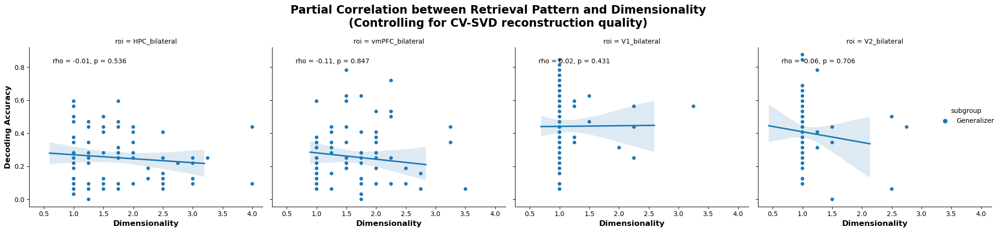

In [768]:
loc2testencoding_resdf = loc2testencoding_resdf.join(svdestdim_df_sum.set_index(["roi","subid","subgroup","dimonaxis"]),on=["roi","subid","subgroup","dimonaxis"],rsuffix="_svd")
loc2testencoding_resdf = loc2testencoding_resdf[loc2testencoding_resdf.roi.isin(keep_rois)]
loc2testencoding_resdf["roi"] = pd.Categorical(loc2testencoding_resdf.roi, categories=keep_rois,ordered=True)
gs = sns.relplot(loc2testencoding_resdf[loc2testencoding_resdf.subgroup=="Generalizer"],
            x="est_dim",y="accuracy",hue="subgroup",
            col="roi")

gs.map_dataframe(sns.regplot, 
                 x="est_dim",y="accuracy",
                 x_partial="reconstruction_corr",
                 #y_partial="reconstruction_corr",
                 scatter=False)

def partialrankcorr(data,x, y,x_covar, **kwargs):
    res = pingouin.partial_corr(data=data, x=x,y=y,x_covar=x_covar,method="spearman",alternative="greater")
    rho,pval = res.r[0], res["p-val"][0]
    ax = plt.gca()
    ax.annotate(f'rho = {rho:.2f}, p = {pval:.3f}', xy=(0.1, 0.9), xycoords=ax.transAxes)
gs.map_dataframe(partialrankcorr, x="est_dim",y="accuracy",x_covar="reconstruction_corr")
gs.set_ylabels("Decoding Accuracy",fontsize="large",fontweight="bold")
gs.set_xlabels("Dimensionality",fontsize="large",fontweight="bold")
gs.figure.suptitle("Partial Correlation between Retrieval Pattern and Dimensionality\n(Controlling for CV-SVD reconstruction quality)",fontsize="xx-large",fontweight="bold")
gs.figure.tight_layout()


## Test stimuli representation encoding models

In [136]:
from sklearn.linear_model import LinearRegression
from multivariate.mvpa_estimator import CompositionalRetrieval
import scipy.spatial
import scipy.stats

In [138]:
reg_coefs,percept_reg_coefs = dict(zip(["train2test","loc2test","loc2train"],[{},{},{}])), dict(zip(["train2test","loc2test","loc2train"],[{},{},{}]))
dmod_reg_coefs = dict(zip(["train2test","loc2test","loc2train"],[{},{},{}]))
compositionretrieval_results = []
for roi in [x for x in rois if "IPS" not in x]:
    for ana in ["train2test","loc2test","loc2train"]:
        reg_coefs[ana][roi],      percept_reg_coefs[ana][roi]  = {"Generalizer":[],"nonGeneralizer":[]}, {"Generalizer":[],"nonGeneralizer":[]}
        dmod_reg_coefs[ana][roi] = {"Generalizer":[],"nonGeneralizer":[]}
    for subdata,subid in zip(roi_data[roi],subid_list):
        print(f"{roi} - {subid}",end="\r",flush=True)
        subgroup = "Generalizer" if subid in generalizers else "nonGeneralizer"
        preprocedX = deepcopy(subdata["preprocX"])
        stimdf = subdata["stimdf"]
        
        navi_filter = np.vstack(
            [stimdf.taskname.to_numpy() == "navigation",
             [not np.logical_and(x==0,y==0) for x,y in stimdf[["stim_x","stim_y"]].to_numpy()]]
        ).all(axis=0)
        
        #average across sessions
        navi_X = np.mean(split_data(X      = preprocedX[navi_filter,:],
                                    groups = stimdf[navi_filter].copy().stim_session.to_numpy()),
                        axis=0)
        
        assert navi_X.shape[0] == 24
        navi_df = stimdf[navi_filter&(stimdf.stim_session==0)].copy().reset_index(drop=True)

        training_filter = navi_df.stim_group==1
        test_filter = navi_df.stim_group==0

        trdf = navi_df[training_filter].copy().reset_index(drop=True)
        trX  = navi_X[training_filter]
        trdfneworder = trdf.sort_values(by=['training_axset','training_axlocTL'])
        new_order = trdfneworder.index
        training_df = trdfneworder.reset_index(drop=True).assign(stim_task=0)
        training_X = trX[new_order,:]
        
        
        test_X = navi_X[test_filter]
        test_df = navi_df[test_filter].copy().reset_index(drop=True).assign(stim_task=0)


        lzer_filter = np.vstack(
            [stimdf.taskname.to_numpy() == "localizer",
             [not np.logical_and(x==0,y==0) for x,y in stimdf[["stim_x","stim_y"]].to_numpy()]]
        ).all(axis=0)
        lzerX  = preprocedX[lzer_filter,:]
        lzdfneworder = stimdf[lzer_filter].copy().reset_index(drop=True).sort_values(by=['training_axset','training_axlocTL'])
        new_order = lzdfneworder.index
        lzer_df = lzdfneworder.reset_index(drop=True).assign(stim_task=1)
        lzer_X = lzerX[new_order,:]

        CRestimator = CompositionalRetrieval(
                               activitypattern=np.vstack([training_X,test_X,lzer_X]),
                               stim_df=pd.concat([training_df,test_df,lzer_df],axis=0).reset_index(drop=True)
                               )
        CRestimator.fit()

        subresdf = pd.DataFrame({"value":CRestimator.result,
                                 "metric":CRestimator.resultnames}
                                 ).assign(roi=roi,subid=subid,subgroup=subgroup)
        compositionretrieval_results.append(subresdf)
        for ana in ["train2test","loc2test","loc2train"]:
            reg_coefs[ana][roi][subgroup].append(CRestimator.regcoefmats[ana][0])
            percept_reg_coefs[ana][roi][subgroup].append(CRestimator.regcoefmats[ana][1]) 
            dmod_reg_coefs[ana][roi][subgroup].append(CRestimator.regcoefmats[ana][2])
        



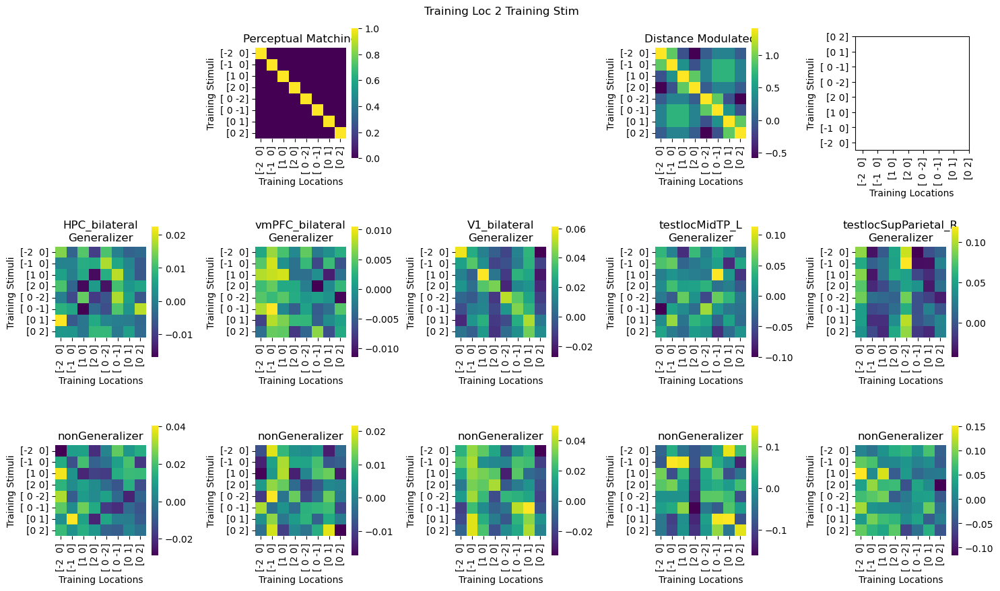

In [139]:
ana = "loc2train"
allylabs = (training_df[["stim_x","stim_y"]].to_numpy()*2).astype(int)
allxlabs = (lzer_df[["stim_x","stim_y"]].to_numpy()*2).astype(int)
xticksat = np.arange(0,8,1)
yticksat = np.arange(0,8,1)

fig,axes = plt.subplots(3,len(rois),figsize=(3*len(rois),3*3))
sns.heatmap(np.mean(percept_reg_coefs[ana][roi]["Generalizer"],axis=0),
            ax=axes[0,1],cmap="viridis")

axes[0,1].set_title("Perceptual Matching")
sns.heatmap(np.mean(dmod_reg_coefs[ana][roi]["Generalizer"],axis=0),
            ax=axes[0,3],cmap="viridis")
axes[0,3].set_title("Distance Modulated")
keep_rois = [x for x in rois if "IPS" not in x]
for j,roi in enumerate(keep_rois):
    Gmeanmat = np.mean(reg_coefs[ana][roi]["Generalizer"],axis=0)
    sns.heatmap(Gmeanmat,ax=axes[1,j],cmap="viridis")
    axes[1,j].set_title(f"{roi}\nGeneralizer")
    nGmeanmat = np.mean(reg_coefs[ana][roi]["nonGeneralizer"],axis=0)
    sns.heatmap(nGmeanmat,ax=axes[2,j],cmap="viridis")
    axes[2,j].set_title(f"nonGeneralizer")

for ax in axes.flatten():
    ax.set_xticks(xticksat+0.5)
    ax.set_yticks(yticksat+0.5)
    ax.set_xticklabels(allxlabs[xticksat],rotation=90)
    ax.set_yticklabels(allylabs[yticksat],rotation=0)
    ax.set_xlabel("Training Locations")
    ax.set_ylabel("Training Stimuli")
    ax.set_aspect(1)
axes[0,0].remove()
axes[0,2].remove()

fig.suptitle("Training Loc 2 Training Stim")
fig.tight_layout()
    

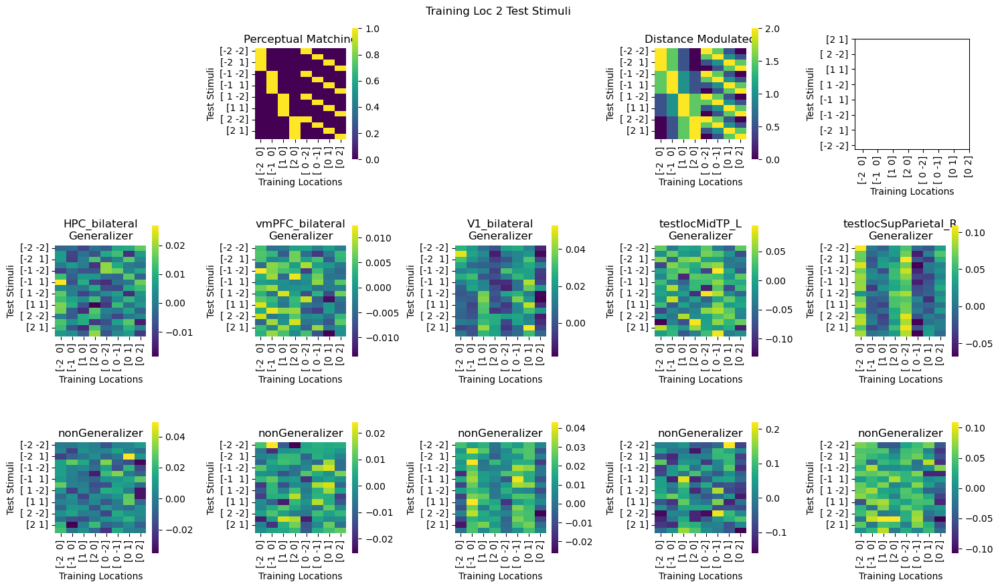

In [140]:
ana = "loc2test"
allylabs = (test_df[["stim_x","stim_y"]].to_numpy()*2).astype(int)
allxlabs = (lzer_df[["stim_x","stim_y"]].to_numpy()*2).astype(int)
xticksat = np.arange(0,8,1)
yticksat = np.arange(0,16,2)

fig,axes = plt.subplots(3,len(rois),figsize=(3*len(rois),3*3))
sns.heatmap(np.mean(percept_reg_coefs[ana][roi]["Generalizer"],axis=0),
            ax=axes[0,1],cmap="viridis")

axes[0,1].set_title("Perceptual Matching")
sns.heatmap(np.mean(dmod_reg_coefs[ana][roi]["Generalizer"],axis=0),
            ax=axes[0,3],cmap="viridis")
axes[0,3].set_title("Distance Modulated")
for j,roi in enumerate(keep_rois):
    Gmeanmat = np.mean(reg_coefs[ana][roi]["Generalizer"],axis=0)
    sns.heatmap(Gmeanmat,ax=axes[1,j],cmap="viridis")
    axes[1,j].set_title(f"{roi}\nGeneralizer")
    nGmeanmat = np.mean(reg_coefs[ana][roi]["nonGeneralizer"],axis=0)
    sns.heatmap(nGmeanmat,ax=axes[2,j],cmap="viridis")
    axes[2,j].set_title(f"nonGeneralizer")

for ax in axes.flatten():
    ax.set_xticks(xticksat+0.5)
    ax.set_yticks(yticksat+0.5)
    ax.set_xticklabels(allxlabs[xticksat],rotation=90)
    ax.set_yticklabels(allylabs[yticksat],rotation=0)
    ax.set_xlabel("Training Locations")
    ax.set_ylabel("Test Stimuli")
    ax.set_aspect(0.5)
axes[0,0].remove()
axes[0,2].remove()

fig.suptitle("Training Loc 2 Test Stimuli")
fig.tight_layout()
    

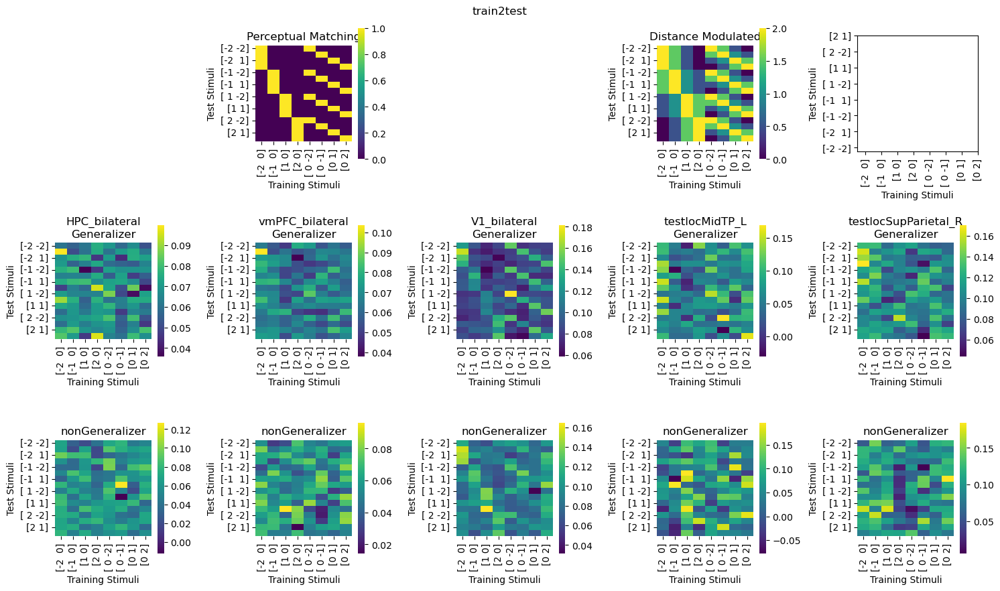

In [142]:
ana = "train2test"
allylabs = (test_df[["stim_x","stim_y"]].to_numpy()*2).astype(int)
allxlabs = (training_df[["stim_x","stim_y"]].to_numpy()*2).astype(int)
xticksat = np.arange(0,8,1)
yticksat = np.arange(0,16,2)

fig,axes = plt.subplots(3,len(rois),figsize=(3*len(rois),3*3))
sns.heatmap(np.mean(percept_reg_coefs[ana][roi]["Generalizer"],axis=0),
            ax=axes[0,1],cmap="viridis")

axes[0,1].set_title("Perceptual Matching")
sns.heatmap(np.mean(dmod_reg_coefs[ana][roi]["Generalizer"],axis=0),
            ax=axes[0,3],cmap="viridis")
axes[0,3].set_title("Distance Modulated")
for j,roi in enumerate(keep_rois):
    Gmeanmat = np.mean(reg_coefs[ana][roi]["Generalizer"],axis=0)
    sns.heatmap(Gmeanmat,ax=axes[1,j],cmap="viridis")
    axes[1,j].set_title(f"{roi}\nGeneralizer")
    nGmeanmat = np.mean(reg_coefs[ana][roi]["nonGeneralizer"],axis=0)
    sns.heatmap(nGmeanmat,ax=axes[2,j],cmap="viridis")
    axes[2,j].set_title(f"nonGeneralizer")

for ax in axes.flatten():
    ax.set_xticks(xticksat+0.5)
    ax.set_yticks(yticksat+0.5)
    ax.set_xticklabels(allxlabs[xticksat],rotation=90)
    ax.set_yticklabels(allylabs[yticksat],rotation=0)
    ax.set_xlabel("Training Stimuli")
    ax.set_ylabel("Test Stimuli")
    ax.set_aspect(0.5)
axes[0,0].remove()
axes[0,2].remove()

fig.suptitle(ana)
fig.tight_layout()
    

In [143]:
keep_rois = rois
compositionretrieval_resdf = pd.concat(compositionretrieval_results,axis=0).reset_index(drop=True)
compositionretrieval_resdf[["anagroup","metricname"]] = compositionretrieval_resdf.metric.str.split("-",expand=True)
compositionretrieval_resdf[["region","side"]] = compositionretrieval_resdf.roi.str.split("_",expand=True)
compositionretrieval_resdf.roi = pd.Categorical(compositionretrieval_resdf.roi,
                                                   categories=keep_rois,ordered=True)
print(np.unique(compositionretrieval_resdf.metricname))
compositionretrieval_resdf.head(5)
# sns.catplot(compositionretrieval_resdf,
#             x="region",y="value",hue="subgroup",
#             row="anagroup",col="metricname",
#             kind="bar",errorbar="se",sharey=False,sharex=False)


['comporegr2' 'meancompoweight' 'meanweightdiff' 'reg_distmod'
 'reg_percept' 'sumweightdiff' 'zcorr_distmod' 'zcorr_percept']


,value,metric,roi,subid,subgroup,anagroup,metricname,region,side
0,0.110603,train2test-comporegr2,HPC_bilateral,sub001,Generalizer,train2test,comporegr2,HPC,bilateral
1,-0.112754,train2test-reg_distmod,HPC_bilateral,sub001,Generalizer,train2test,reg_distmod,HPC,bilateral
2,0.172457,train2test-reg_percept,HPC_bilateral,sub001,Generalizer,train2test,reg_percept,HPC,bilateral
3,-0.060252,train2test-zcorr_distmod,HPC_bilateral,sub001,Generalizer,train2test,zcorr_distmod,HPC,bilateral
4,0.073215,train2test-zcorr_percept,HPC_bilateral,sub001,Generalizer,train2test,zcorr_percept,HPC,bilateral


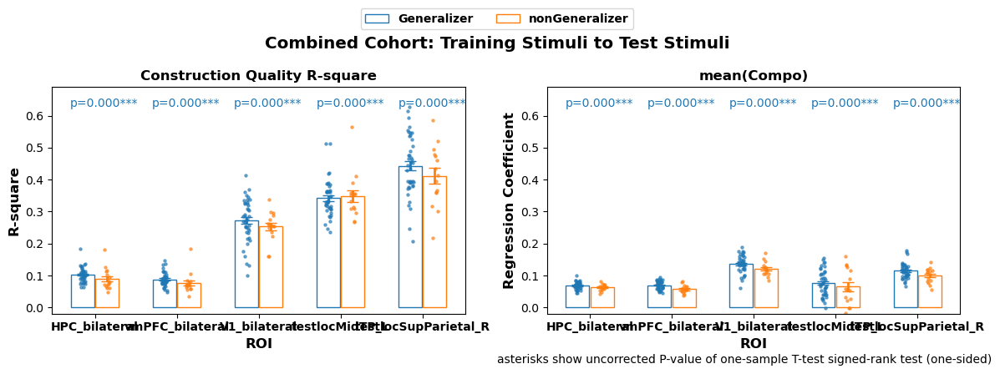

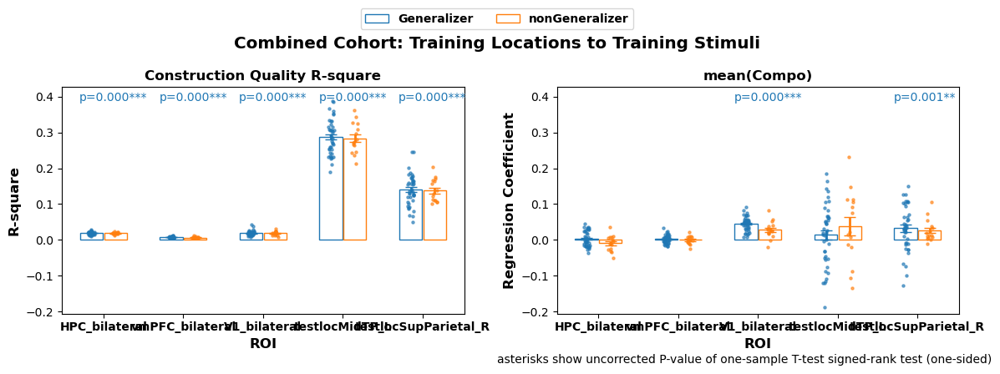

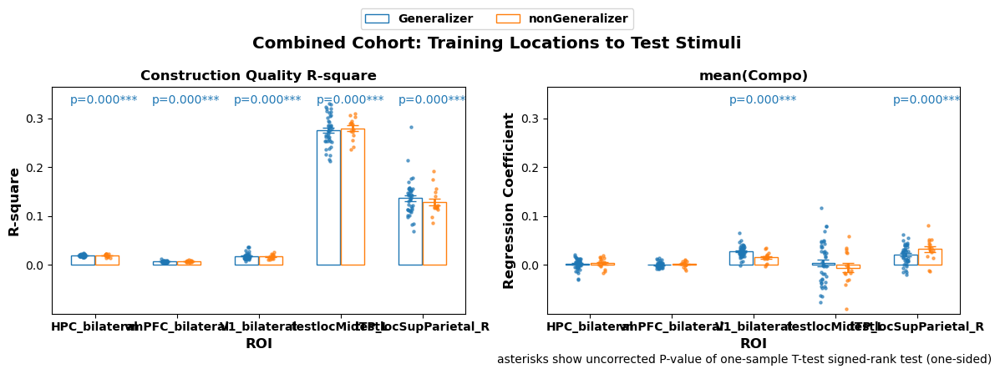

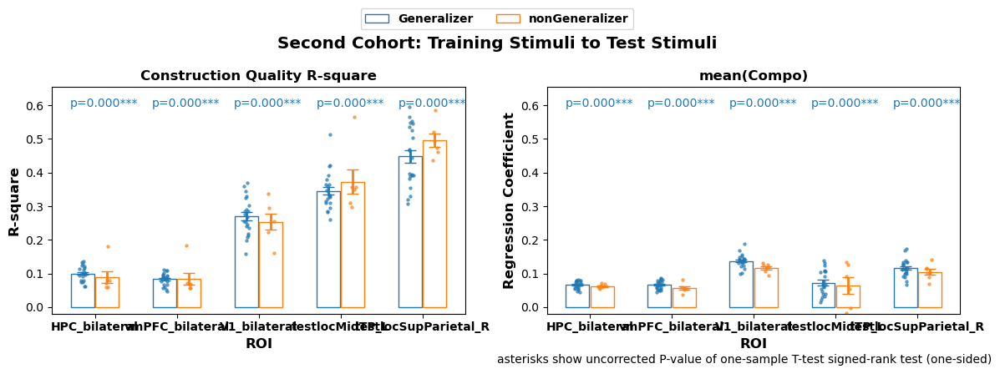

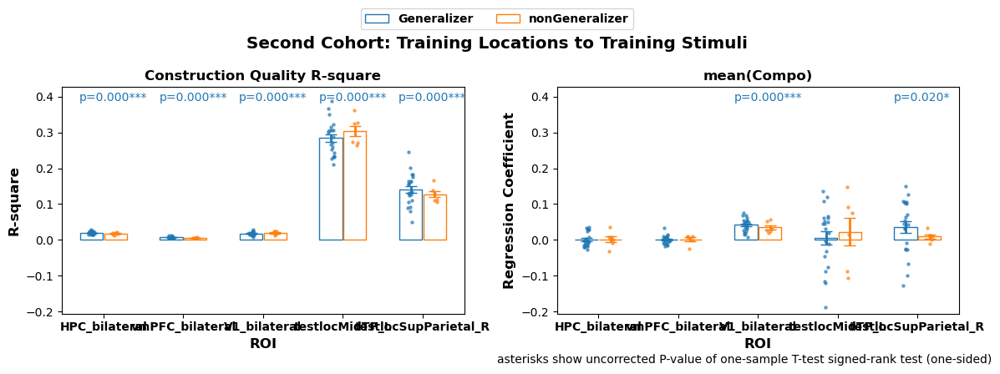

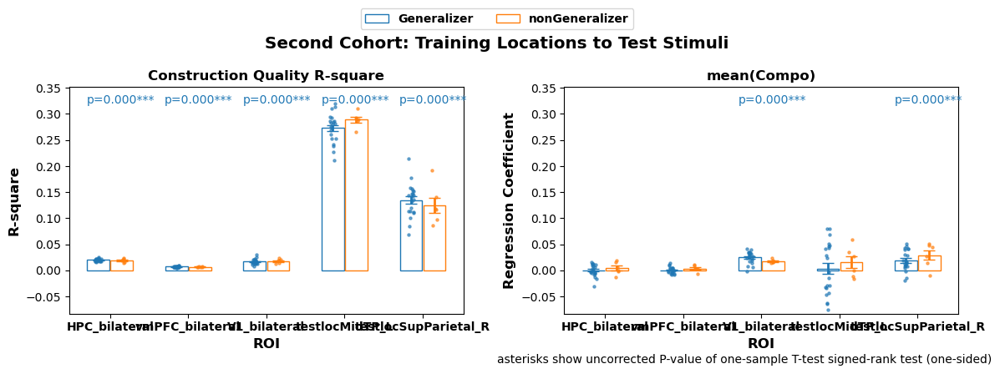

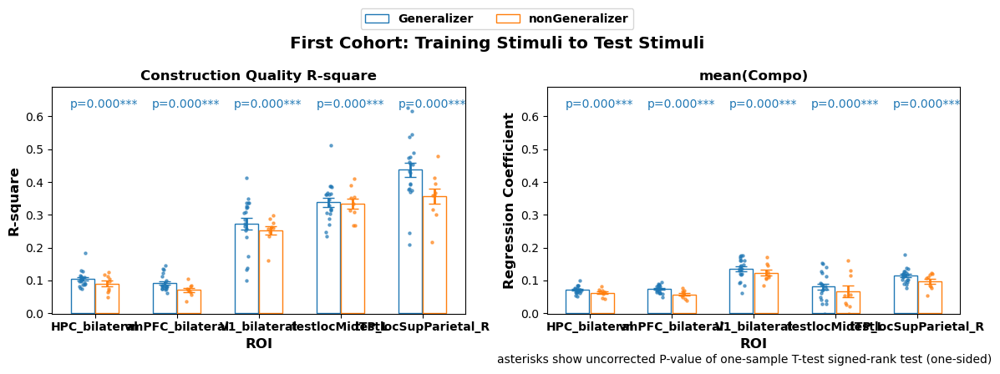

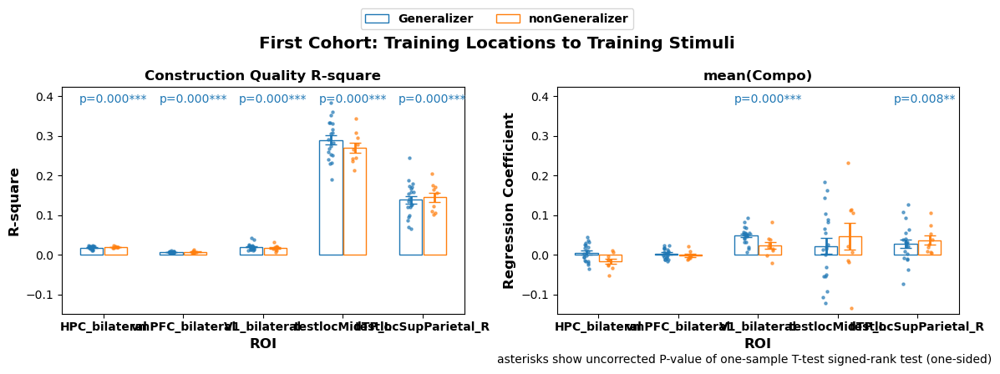

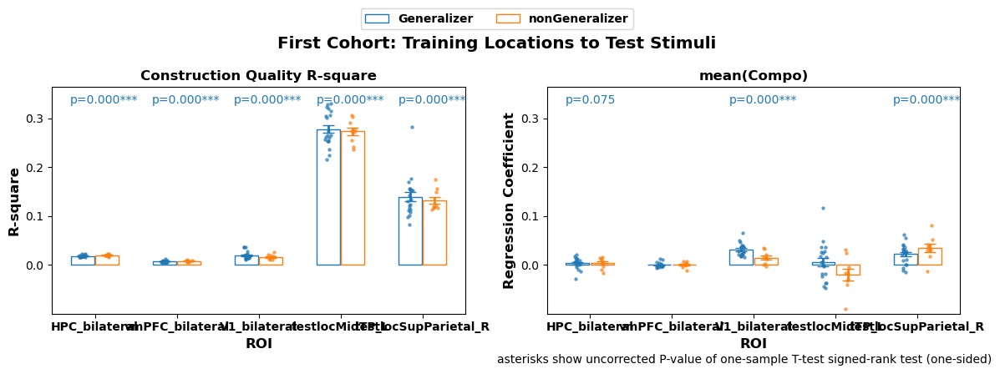

In [144]:
# sanity check, see if coefficient of Compo is greater than zero, and if compo>noncompo
xvar, gvar, yvar, yvartest = "roi",  "subgroup", "value", "value"
plt_mts = ["comporegr2","meancompoweight"]
facet_names = dict(zip(plt_mts,["Construction Quality R-square","mean(Compo)"]))
plt_ana = dict(zip(["train2test","loc2train","loc2test"],
                   ["Training Stimuli to Test Stimuli", "Training Locations to Training Stimuli", "Training Locations to Test Stimuli"]))
for sname,slist in reversed(cohort_names_lists.items()):
    for a, atitle in plt_ana.items():
        curr_pdf = compositionretrieval_resdf[(compositionretrieval_resdf.metricname.isin(plt_mts))&(compositionretrieval_resdf.anagroup==a)&(compositionretrieval_resdf.subid.isin(slist))].copy()
        curr_pdf.metricname = pd.Categorical(curr_pdf.metricname,categories=plt_mts,ordered=True)
        fig,axes = grouped_barscatter_withstats(curr_pdf,
                                    facet_vars = "metricname", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                    prows=1,pcols=2,
                                    hrow=4,wcol=6,
                                    statfunc=lambda yt: 1. if np.size(yt)<20 else scipy.stats.ttest_1samp(yt,0,alternative="greater").pvalue)
        for ifacet, _ in enumerate(axes.flatten()):
            if ifacet==0:
                axes.flatten()[ifacet].set_ylabel("R-square",fontweight="bold",fontsize="large")
            else:
                axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
            axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
            oldtitle = axes.flatten()[ifacet].title.get_text()
            axes.flatten()[ifacet].set_title(facet_names[oldtitle],fontweight="bold",fontsize="large")
            
        hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
        fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        fig.suptitle(f"{sname}: {atitle}",fontweight="bold",fontsize="x-large")
        fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value of one-sample T-test signed-rank test (one-sided)')
        fig.tight_layout()


In [ ]:
xvar, gvar, yvar, yvartest = "roi",  "subgroup", "value", "value"
plt_mts = ["zcorr_percept","zcorr_distmod"]
facet_names = facet_names = dict(zip(plt_mts,["Perceptual", "Distance Modulated"]))
plt_ana = dict(zip(["train2test","loc2train","loc2test"],
                   ["Training Stimuli to Test Stimuli", "Training Locations to Training Stimuli", "Training Locations to Test Stimuli"]))
for sname,slist in reversed(cohort_names_lists.items()):
    for a, atitle in plt_ana.items():
        curr_pdf = compositionretrieval_resdf[(compositionretrieval_resdf.metricname.isin(plt_mts))&(compositionretrieval_resdf.anagroup==a)&(compositionretrieval_resdf.subid.isin(slist))].copy()
        curr_pdf.metricname = pd.Categorical(curr_pdf.metricname,categories=plt_mts,ordered=True)
        fig,axes = grouped_barscatter_withstats(curr_pdf,
                                    facet_vars = "metricname", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                    prows=1,pcols=2,
                                    hrow=4,wcol=6,
                                    statfunc=lambda yt: 1. if np.size(yt)<20 else scipy.stats.ttest_1samp(yt,0,alternative="greater").pvalue)
        for ifacet, _ in enumerate(axes.flatten()):
            axes.flatten()[ifacet].set_ylabel("Partial Spearman Rho",fontweight="bold",fontsize="large")
            axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
            oldtitle = axes.flatten()[ifacet].title.get_text()
            axes.flatten()[ifacet].set_title(facet_names[oldtitle],fontweight="bold",fontsize="large")
            
        hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
        fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        fig.suptitle(f"{sname}: {atitle}",fontweight="bold",fontsize="x-large")
        fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value of Wilcoxon signed-rank test (one-sided)')
        fig.tight_layout()


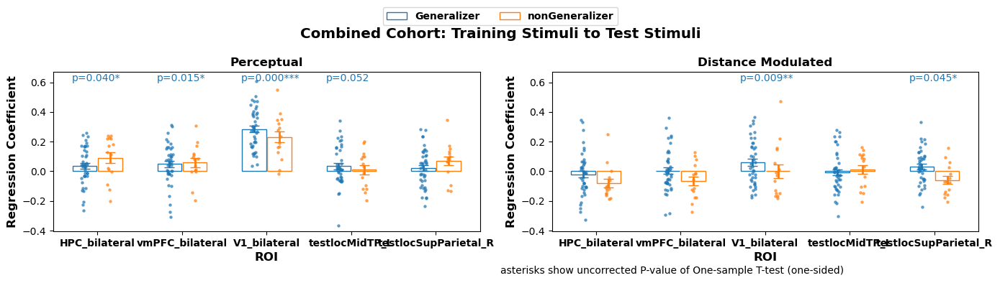

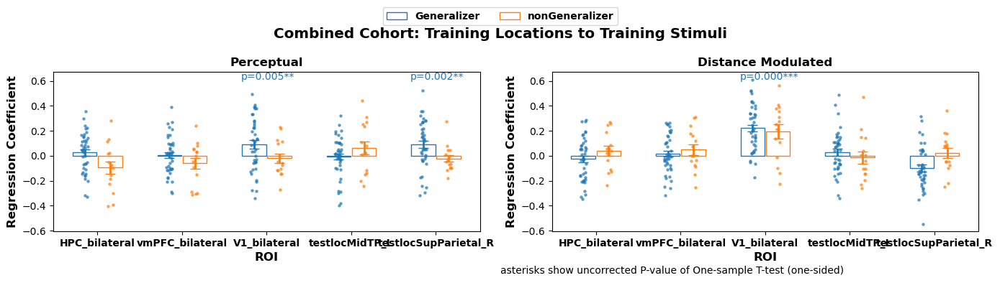

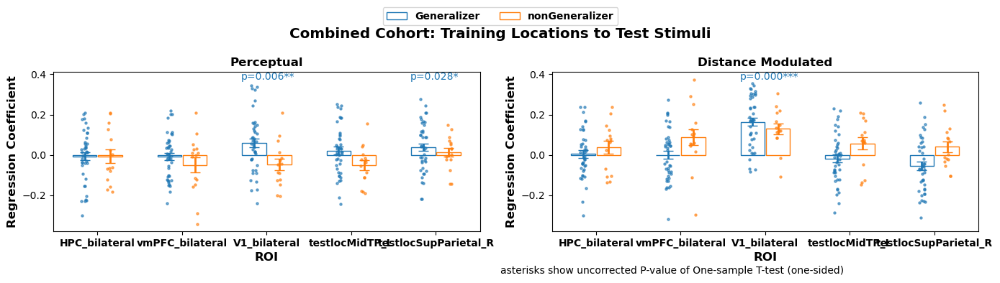

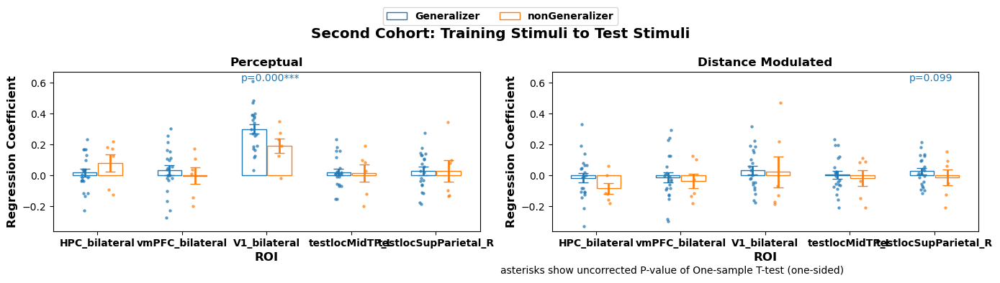

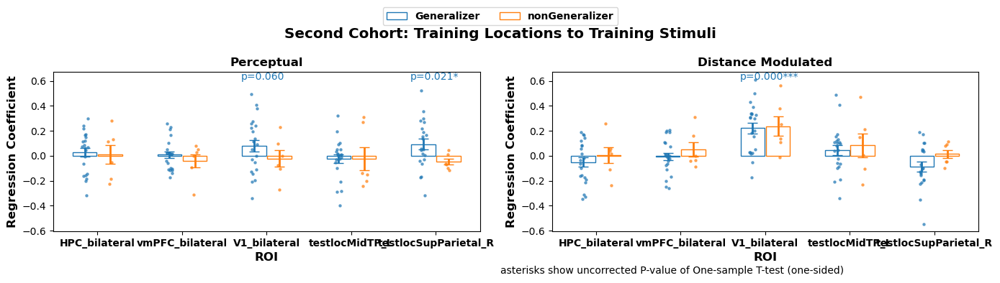

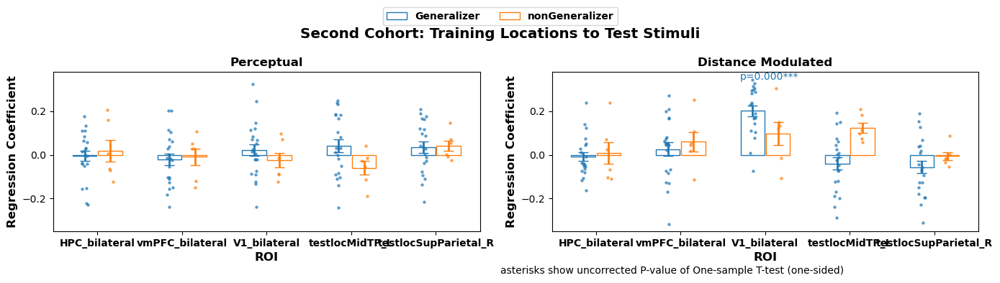

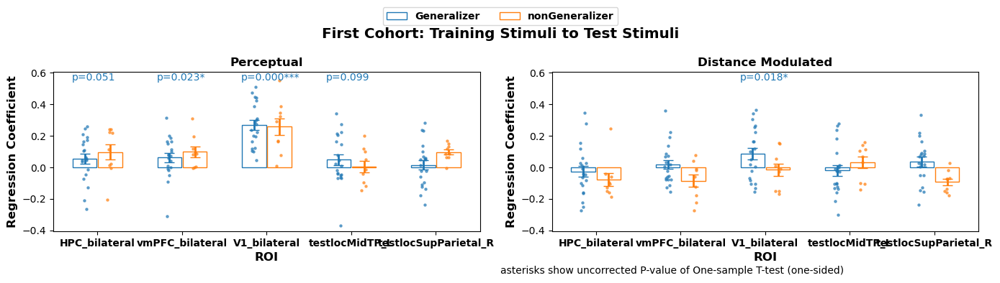

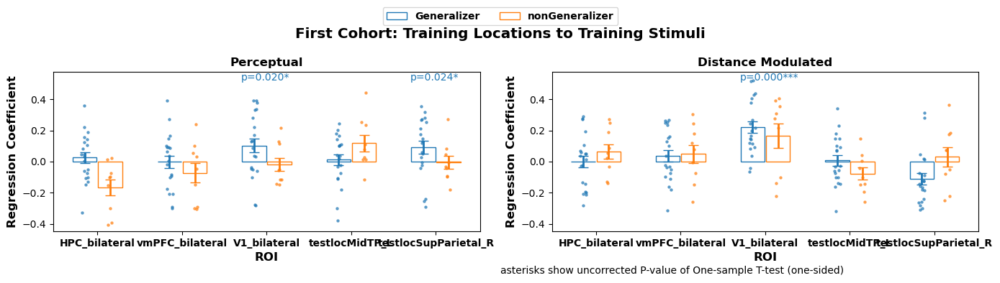

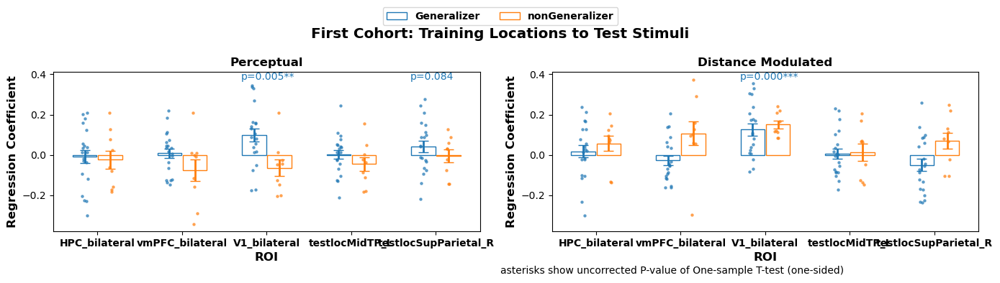

In [147]:
xvar, gvar, yvar, yvartest = "roi",  "subgroup", "value", "value"
plt_mts = ["reg_percept","reg_distmod"]
facet_names = dict(zip(plt_mts,["Perceptual", "Distance Modulated"]))
plt_ana = dict(zip(["train2test","loc2train","loc2test"],
                   ["Training Stimuli to Test Stimuli", "Training Locations to Training Stimuli", "Training Locations to Test Stimuli"]))
for sname,slist in reversed(cohort_names_lists.items()):
    for a, atitle in plt_ana.items():
        curr_pdf = compositionretrieval_resdf[(compositionretrieval_resdf.metricname.isin(plt_mts))&(compositionretrieval_resdf.anagroup==a)&(compositionretrieval_resdf.subid.isin(slist))].copy()
        curr_pdf.metricname = pd.Categorical(curr_pdf.metricname,categories=plt_mts,ordered=True)
        fig,axes = grouped_barscatter_withstats(curr_pdf,
                                    facet_vars = "metricname", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                    prows=1,pcols=2,
                                    hrow=3.5,wcol=7,
                                    statfunc=lambda yt: 1. if np.size(yt)<20 else scipy.stats.ttest_1samp(yt,0,alternative="greater").pvalue)
        for ifacet, _ in enumerate(axes.flatten()):
            axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
            axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
            oldtitle = axes.flatten()[ifacet].title.get_text()
            axes.flatten()[ifacet].set_title(facet_names[oldtitle],fontweight="bold",fontsize="large")
            
        hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
        fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        fig.suptitle(f"{sname}: {atitle}",fontweight="bold",fontsize="x-large")
        fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value of One-sample T-test (one-sided)')
        fig.tight_layout()


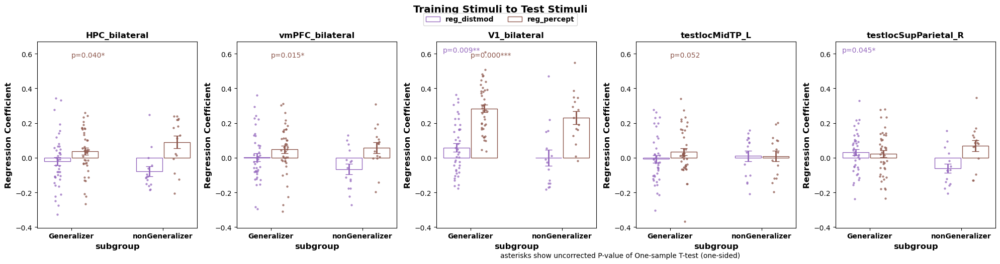

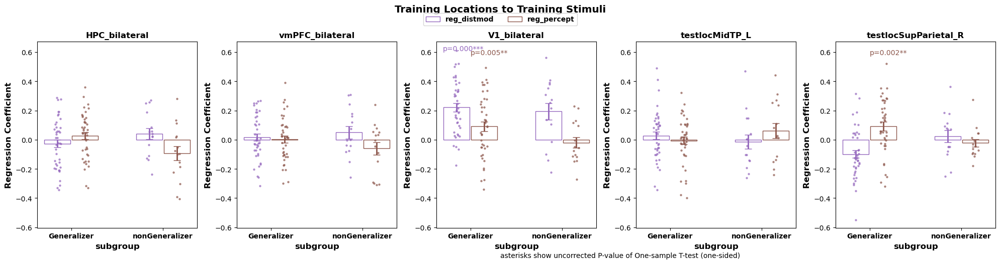

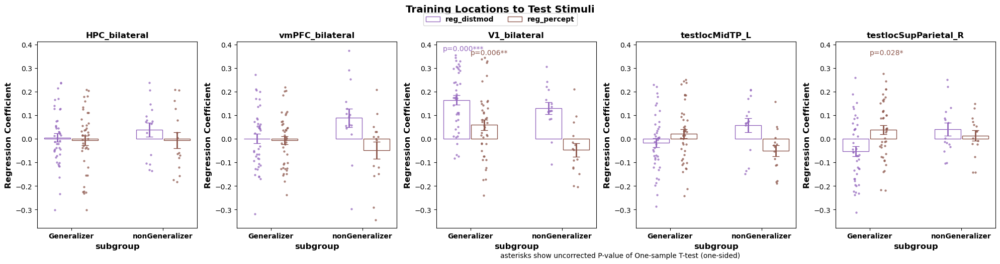

In [149]:
xvar, gvar, yvar, yvartest = "subgroup",  "metricname",  "value", "value"
plt_mts = ["reg_percept","reg_distmod"]
#facet_names = dict(zip(plt_mts,["Perceptual", "Distance Modulated"]))
plt_ana = dict(zip(["train2test","loc2train","loc2test"],
                   ["Training Stimuli to Test Stimuli", "Training Locations to Training Stimuli", "Training Locations to Test Stimuli"]))
for sname,slist in list(reversed(cohort_names_lists.items()))[:1]:
    for a, atitle in plt_ana.items():
        curr_pdf = compositionretrieval_resdf[(compositionretrieval_resdf.metricname.isin(plt_mts))&(compositionretrieval_resdf.anagroup==a)&(compositionretrieval_resdf.subid.isin(slist))].copy()
        curr_pdf.subgroup = pd.Categorical(curr_pdf.subgroup,ordered=True)
        fig,axes = grouped_barscatter_withstats(curr_pdf,
                                    facet_vars = "roi", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                    prows=1,pcols=5, hues=sns.color_palette("tab10",6)[4:],
                                    hrow=5,wcol=4,
                                    statfunc=lambda yt: 1. if np.size(yt)<20 else scipy.stats.ttest_1samp(yt,0,alternative="greater").pvalue)
        for ifacet, _ in enumerate(axes.flatten()):
            axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
            #axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
            oldtitle = axes.flatten()[ifacet].title.get_text()
            axes.flatten()[ifacet].set_title(oldtitle,fontweight="bold",fontsize="large")
            
        hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
        fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,0.99),ncol = 4,
                prop = dict(weight="bold"))
        fig.suptitle(atitle,fontweight="bold",fontsize="x-large",y=1.01)
        fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value of One-sample T-test (one-sided)')
        fig.tight_layout()


In [485]:
compositionretrieval_resdf.metricname
compositionretrieval_resdf.query("anagroup=='train2test' and metricname=='meanweightdiff'")

,value,metric,roi,subid,subgroup,anagroup,metricname,region,side
4,-0.003887,train2test-meanweightdiff,HPC_bilateral,sub001,Generalizer,train2test,meanweightdiff,HPC,bilateral
22,-0.007334,train2test-meanweightdiff,HPC_bilateral,sub002,nonGeneralizer,train2test,meanweightdiff,HPC,bilateral
40,0.011749,train2test-meanweightdiff,HPC_bilateral,sub003,Generalizer,train2test,meanweightdiff,HPC,bilateral
58,0.002838,train2test-meanweightdiff,HPC_bilateral,sub004,nonGeneralizer,train2test,meanweightdiff,HPC,bilateral
76,0.007156,train2test-meanweightdiff,HPC_bilateral,sub005,Generalizer,train2test,meanweightdiff,HPC,bilateral
...,...,...,...,...,...,...,...,...,...
4954,0.015457,train2test-meanweightdiff,V2_bilateral,sub125,Generalizer,train2test,meanweightdiff,V2,bilateral
4972,0.045706,train2test-meanweightdiff,V2_bilateral,sub127,Generalizer,train2test,meanweightdiff,V2,bilateral
4990,0.036389,train2test-meanweightdiff,V2_bilateral,sub128,Generalizer,train2test,meanweightdiff,V2,bilateral
5008,0.054205,train2test-meanweightdiff,V2_bilateral,sub129,Generalizer,train2test,meanweightdiff,V2,bilateral


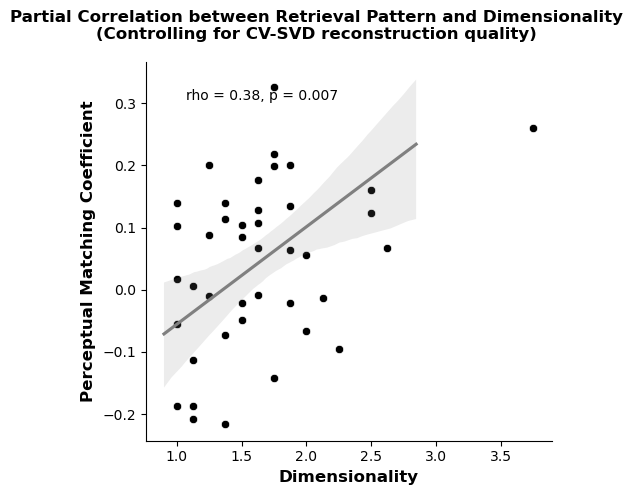

In [104]:
train2testencoding_resdf = compositionretrieval_resdf.query("anagroup=='train2test' and metricname=='reg_percept'").copy()
train2testencoding_resdf = train2testencoding_resdf.join(svdestdim_df_sum_overaxis.set_index(["roi","subid","subgroup"]),on=["roi","subid","subgroup"],rsuffix="_svd")
train2testencoding_resdf = train2testencoding_resdf[train2testencoding_resdf.roi.isin(keep_rois)]
train2testencoding_resdf["region"] = [x.split("_")[0] for x in train2testencoding_resdf.roi]
#train2testencoding_resdf["roi"] = pd.Categorical(train2testencoding_resdf.roi, categories=keep_rois,ordered=True)
gs = sns.relplot(train2testencoding_resdf[(train2testencoding_resdf.subgroup=="Generalizer")&(train2testencoding_resdf.region=="HPC")],
            x="est_dim",y="value",
            color="black"
            #hue="subgroup",
            #col="roi"
            )

gs.map_dataframe(sns.regplot, 
                 x="est_dim",y="value",
                 color="grey",
                 x_partial="reconstruction_corr",
                 #y_partial="reconstruction_corr",
                 scatter=False)

def partialrankcorr(data,x, y,x_covar, **kwargs):
    res = pingouin.partial_corr(data=data, x=x,y=y,covar=x_covar,method="spearman",alternative="greater")
    rho,pval = res.r[0], res["p-val"][0]
    ax = plt.gca()
    #if pval<=0.05: #gen_pval_annot(pval)
    ax.annotate(f'rho = {rho:.2f}, p = {pval:.3f}', xy=(0.1, 0.9), xycoords=ax.transAxes)
    #else:
    #    ax.annotate(f'rho = {rho:.2f}', xy=(0.1, 0.9), xycoords=ax.transAxes)
gs.map_dataframe(partialrankcorr, x="est_dim",y="value",x_covar="reconstruction_corr")
gs.set_ylabels("Perceptual Matching Coefficient",fontsize="large",fontweight="bold")
gs.set_xlabels("Dimensionality",fontsize="large",fontweight="bold")
gs.figure.suptitle("Partial Correlation between Retrieval Pattern and Dimensionality\n(Controlling for CV-SVD reconstruction quality)",fontsize="large",fontweight="bold")
gs.figure.tight_layout()
